In [62]:
import spike.spike_analysis.spike_collection as sc
import spike.spike_analysis.spike_recording as sr
import spike.spike_analysis.firing_rate_calculations as fr
import spike.spike_analysis.normalization as norm
import spike.spike_analysis.single_cell as single_cell
import spike.spike_analysis.spike_collection as collection
import spike.spike_analysis.zscoring as zscoring
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import behavior.boris_extraction as boris
import matplotlib.pyplot as plt
import pickle
import re

In [63]:
pd.set_option('display.max_colwidth', 0)  # 0 means unlimited in newer pandas versions

# Show all rows
pd.set_option("display.max_rows", None)

# Show all columns
pd.set_option("display.max_columns", None)

# Don’t truncate column contents
pd.set_option("display.max_colwidth", None)

# Expand the display to the full width of the screen
pd.set_option("display.width", 0)


In [64]:
spike_collection_json_path = r'C:\Users\thoma\Code\ResearchCode\diff_fam_social_memory_ephys\spike_collection.json\spike_collection.json'

In [65]:
import importlib
importlib.reload(sc)
importlib.reload(zscoring)

<module 'spike.spike_analysis.zscoring' from 'c:\\Users\\thoma\\Code\\ResearchCode\\diff_fam_social_memory_ephys\\spike\\spike_analysis\\zscoring.py'>

In [66]:
sp = sc.SpikeCollection.load_collection(spike_collection_json_path)

In [67]:
rec_events = sp.recordings[0].event_dict

# get unique event names from rec_events dictionary
event_names = list(rec_events.keys())
print("Unique event names:", event_names)

Unique event names: ['alone_rewarded', 'alone_rewarded_baseline', 'high_comp', 'high_comp_lose', 'high_comp_lose_baseline', 'high_comp_win', 'high_comp_win_baseline', 'lose', 'low_comp', 'low_comp_lose', 'low_comp_lose_baseline', 'low_comp_win', 'low_comp_win_baseline', 'overall_pretone', 'win']


In [68]:
exclude_events_baseline_alone_rewarded = [ 'alone_rewarded_baseline', 'high_comp', 'high_comp_lose_baseline', 'high_comp_win_baseline', 
                           'low_comp', 'low_comp_lose_baseline', 'low_comp_win_baseline', 'lose', 'win', 'overall_pretone']

In [69]:
exclude_events_baseline = [ 'alone_rewarded_baseline', 'high_comp', 'high_comp_lose_baseline', 'high_comp_win_baseline', 
                           'low_comp', 'low_comp_lose_baseline', 'low_comp_win_baseline', 'lose', 'win', 'overall_pretone', 'alone_rewarded']

In [70]:
win_lose = ['win', 'lose']

In [71]:
# for each rec, what makes up the percentages of win or lose events
event_name_counts = {}
for rec in sp.recordings:
    event_dict = rec.event_dict
    total_events = sum(len(v) for k, v in event_dict.items() if k in win_lose)
    event_name_counts[rec.name] = {k: len(v) for k, v in event_dict.items() if k in win_lose}
    event_name_counts[rec.name]['total'] = total_events

# Calculate percentages
event_name_percentages = {}
for rec_name, counts in event_name_counts.items():
    event_name_percentages[rec_name] = {k: (v / counts['total'] * 100) if counts['total'] > 0 else 0
                                         for k, v in counts.items() if k != 'total'}
# Display results
for rec_name, percentages in event_name_percentages.items():
    print(f"Recording: {rec_name}")
    for event_name, percentage in percentages.items():
        print(f"  Event: {event_name}, Percentage: {percentage:.2f}%")
    print()


Recording: 20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec
  Event: lose, Percentage: 35.00%
  Event: win, Percentage: 65.00%

Recording: 20230612_101430_standard_comp_to_training_D1_subj_1-4_t4b2L_box1_merged.rec
  Event: lose, Percentage: 65.00%
  Event: win, Percentage: 35.00%

Recording: 20230612_112630_standard_comp_to_training_D1_subj_1-1_t1b3L_box2_merged.rec
  Event: lose, Percentage: 65.00%
  Event: win, Percentage: 35.00%

Recording: 20230612_112630_standard_comp_to_training_D1_subj_1-2_t2b2L_box1_merged.rec
  Event: lose, Percentage: 35.00%
  Event: win, Percentage: 65.00%

Recording: 20230613_105657_standard_comp_to_training_D2_subj_1-1_t1b2L_box1_merged.rec
  Event: lose, Percentage: 5.00%
  Event: win, Percentage: 95.00%

Recording: 20230613_105657_standard_comp_to_training_D2_subj_1-4_t4b3L_box2_merged.rec
  Event: lose, Percentage: 95.00%
  Event: win, Percentage: 5.00%

Recording: 20230614_114041_standard_comp_to_training_D3_subj_1-1_t1b3L_b

In [72]:
# for each rec, what makes up the percentages of events? not including those in exclude_events_baseline
event_name_counts = {}
for rec in sp.recordings:
    event_dict = rec.event_dict
    total_events = sum(len(v) for k, v in event_dict.items() if k not in exclude_events_baseline)
    event_name_counts[rec.name] = {k: len(v) for k, v in event_dict.items() if k not in exclude_events_baseline}
    event_name_counts[rec.name]['total'] = total_events

# Calculate percentages
event_name_percentages = {}
for rec_name, counts in event_name_counts.items():
    event_name_percentages[rec_name] = {k: (v / counts['total'] * 100) if counts['total'] > 0 else 0
                                         for k, v in counts.items() if k != 'total'}
# Display results
for rec_name, percentages in event_name_percentages.items():
    print(f"Recording: {rec_name}")
    for event_name, percentage in percentages.items():
        print(f"  Event: {event_name}, Percentage: {percentage:.2f}%")
    print()

Recording: 20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec
  Event: high_comp_lose, Percentage: 5.00%
  Event: high_comp_win, Percentage: 40.00%
  Event: low_comp_lose, Percentage: 30.00%
  Event: low_comp_win, Percentage: 25.00%

Recording: 20230612_101430_standard_comp_to_training_D1_subj_1-4_t4b2L_box1_merged.rec
  Event: high_comp_lose, Percentage: 40.00%
  Event: high_comp_win, Percentage: 5.00%
  Event: low_comp_lose, Percentage: 25.00%
  Event: low_comp_win, Percentage: 30.00%

Recording: 20230612_112630_standard_comp_to_training_D1_subj_1-1_t1b3L_box2_merged.rec
  Event: high_comp_lose, Percentage: 50.00%
  Event: high_comp_win, Percentage: 20.00%
  Event: low_comp_lose, Percentage: 15.00%
  Event: low_comp_win, Percentage: 15.00%

Recording: 20230612_112630_standard_comp_to_training_D1_subj_1-2_t2b2L_box1_merged.rec
  Event: high_comp_lose, Percentage: 20.00%
  Event: high_comp_win, Percentage: 50.00%
  Event: low_comp_lose, Percentage: 15.00%
  Eve

In [73]:
i = 0
for rec in sp.recordings:
    i+=1
    print(f"{i}: {rec.name}")

1: 20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec
2: 20230612_101430_standard_comp_to_training_D1_subj_1-4_t4b2L_box1_merged.rec
3: 20230612_112630_standard_comp_to_training_D1_subj_1-1_t1b3L_box2_merged.rec
4: 20230612_112630_standard_comp_to_training_D1_subj_1-2_t2b2L_box1_merged.rec
5: 20230613_105657_standard_comp_to_training_D2_subj_1-1_t1b2L_box1_merged.rec
6: 20230613_105657_standard_comp_to_training_D2_subj_1-4_t4b3L_box2_merged.rec
7: 20230614_114041_standard_comp_to_training_D3_subj_1-1_t1b3L_box1_merged.rec
8: 20230614_114041_standard_comp_to_training_D3_subj_1-2_t2b2L_box2_merged.rec
9: 20230616_111904_standard_comp_to_training_D4_subj_1-2_t2b2L_box2_merged.rec
10: 20230616_111904_standard_comp_to_training_D4_subj_1-4_t4b3L_box1_merged.rec
11: 20230617_115521_standard_comp_to_omission_D1_subj_1-1_t1b3L_box1_merged.rec
12: 20230617_115521_standard_comp_to_omission_D1_subj_1-2_t2b2L_box2_merged.rec
13: 20230618_100636_standard_comp_to_omission_D2_

### Skipping recs without alone rewarded

In [74]:
def run_zscore_global_baseline_psth(recording, event_name, pre_window=10, equalize=10, timebin=0.25, SD=1.65, verbose=False):
    """
    Z-score event firing rates using a global pooled baseline per unit with PSTH-like averaging.
    Computes baseline across all non-excluded events, averaging across trials per timebin, then across timebins.
    Event firing rates are similarly averaged using PSTH method.

    Parameters
    ----------
    recording : SpikeRecording
        SpikeRecording object with spike data and event_dict.
    event_name : str
        Event type to analyze.
    pre_window : float
        Duration (s) before events to use for baseline extraction.
    equalize : float
        Duration (s) of event window to analyze.
    timebin : float
        Bin width (s) for PSTH computation (default 0.25s = 250ms).
    SD : float
        Threshold in SD units for significance classification.
    verbose : bool
        Print debug info if True.

    Returns
    -------
    df : pd.DataFrame
        Per-unit z-scores with global baseline and PSTH-based event rates.
    """
    # --- Step 1: Identify good units ---
    units = getattr(recording, "good_units", None)
    if units is None:
        units = [u for u, label in recording.labels_dict.items() if label == "good"]
        if verbose:
            print("Using labels_dict for good units:", units)

    # Define events to exclude from baseline
    exclude_events_baseline = [
        'alone_rewarded_baseline', 'high_comp', 'high_comp_lose_baseline',
        'high_comp_win_baseline', 'low_comp', 'low_comp_lose_baseline',
        'low_comp_win_baseline', 'lose', 'win', 'overall_pretone'
    ]

    timebin_ms = timebin * 1000
    sampling_rate = recording.sampling_rate

    # --- Step 2: Compute GLOBAL baseline firing rates (PSTH-like) ---
    global_baseline_matrices = {u: [] for u in units}

    for ev_type, ev_windows in recording.event_dict.items():
        if ev_type in exclude_events_baseline:
            continue
        for unit_id in units:
            spikes_ms = recording.unit_timestamps[unit_id] * (1000 / sampling_rate)
            for w in ev_windows:
                start_baseline = w[0] - pre_window * 1000
                end_baseline = w[0]
                baseline_bins = np.arange(start_baseline, end_baseline + timebin_ms, timebin_ms)
                spike_counts = np.histogram(spikes_ms, bins=baseline_bins)[0]
                firing_rate = spike_counts * (1000 / timebin_ms)  # Hz
                global_baseline_matrices[unit_id].append(firing_rate)

                if verbose:
                    print(f"[{recording.name}] Unit {unit_id} | Baseline Event {ev_type}, Window {w}")
                    print(f"Baseline firing rates: {firing_rate}\n")

    # --- Step 3: Compute EVENT firing rates (PSTH-like) ---
    event_fr_matrices = {u: [] for u in units}
    event_windows = recording.event_dict[event_name]

    for unit_id in units:
        spikes_ms = recording.unit_timestamps[unit_id] * (1000 / sampling_rate)
        for w in event_windows:
            start_event = w[0]
            end_event = min(w[1], start_event + equalize * 1000)
            event_bins = np.arange(start_event, end_event + timebin_ms, timebin_ms)
            spike_counts = np.histogram(spikes_ms, bins=event_bins)[0]
            firing_rate = spike_counts * (1000 / timebin_ms)  # Hz
            event_fr_matrices[unit_id].append(firing_rate)

            if verbose:
                print(f"[{recording.name}] Unit {unit_id} | Event {event_name}, Window {w}")
                print(f"Event firing rates: {firing_rate}\n")

    # --- Step 4: Compute mean and SD for baseline and event per unit ---
    rows = []
    for unit_id in units:
        baseline_fr_matrix = np.array(global_baseline_matrices[unit_id])  # Shape: trials × bins
        event_fr_matrix = np.array(event_fr_matrices[unit_id])

        if verbose:
            print(f"Event name: {event_name}")
            print(f"Baseline FR matrix shape for unit {unit_id}: {baseline_fr_matrix.shape}")
            print(f"Baseline FR matrix for unit {unit_id}:\n{baseline_fr_matrix}\n")
            print(f"Event FR matrix shape for unit {unit_id}: {event_fr_matrix.shape}")
            print(f"Event FR matrix for unit {unit_id}:\n{event_fr_matrix}\n")

        if baseline_fr_matrix.size == 0 or event_fr_matrix.size == 0:
            b_mean = np.nan
            b_sd = np.nan
            ev_mean = np.nan
            zscore = np.nan
        else:
            # Handle inconsistent bin counts by trimming to shortest
            if len(set(len(row) for row in global_baseline_matrices[unit_id])) > 1:
                min_bins = min(len(row) for row in global_baseline_matrices[unit_id])
                baseline_fr_matrix = baseline_fr_matrix[:, :min_bins]
                if verbose:
                    print(f"Trimming baseline matrix for unit {unit_id} to {min_bins} bins")
            if len(set(len(row) for row in event_fr_matrices[unit_id])) > 1:
                min_bins = min(len(row) for row in event_fr_matrices[unit_id])
                event_fr_matrix = event_fr_matrix[:, :min_bins]
                if verbose:
                    print(f"Trimming event matrix for unit {unit_id} to {min_bins} bins")

            # Baseline mean: mean across trials per bin, then mean across bins
            b_mean_per_bin = np.mean(baseline_fr_matrix, axis=0)
            b_mean = np.mean(b_mean_per_bin) if len(b_mean_per_bin) > 0 else np.nan

            # Baseline SD: SD across trials per bin, then mean across bins
            
            # b_sd_per_bin = np.std(baseline_fr_matrix, axis=0, ddof=1)
            # b_sd = np.mean(b_sd_per_bin) if len(b_sd_per_bin) > 0 else np.nan

            # Baseline SD: compute mean trace across trials, then SD across bins
            b_sd = np.std(b_mean_per_bin, ddof=1) if len(b_mean_per_bin) > 0 else np.nan

            # Event mean: mean across trials per bin, then mean across bins
            ev_mean_per_bin = np.mean(event_fr_matrix, axis=0)
            ev_mean = np.mean(ev_mean_per_bin) if len(ev_mean_per_bin) > 0 else np.nan

            # Z-score
            zscore = np.nan if np.isnan(b_sd) or b_sd == 0 else (ev_mean - b_mean) / b_sd

        rows.append({
            "Recording": recording.name,
            "Event name": event_name,
            "Unit number": unit_id,
            "Global Pre-event M": b_mean,
            "Global Pre-event SD": b_sd,
            "Event M": ev_mean,
            "Event Z-Score": zscore,
        })

    # Create DataFrame
    df = pd.DataFrame(rows)

    # --- Step 5: Significance threshold ---
    df["sig"] = np.select(
        [df["Event Z-Score"] > SD, df["Event Z-Score"] < -SD],
        ["increase", "decrease"],
        default="not sig"
    )

    return df

In [75]:
# Example usage with the wrapper function
def run_all_recordings_all_events_global_psth(sp, pre_window=10, equalize=10, timebin=0.25, SD=1.65, verbose=False):
    all_event_names = sorted({ev for rec in sp.recordings for ev in rec.event_dict.keys()})
    dfs = []
    skipped = []

    for rec in sp.recordings:

        # check if 'alone_rewarded' has windows, if not skip the recording
        if 'alone_rewarded' not in rec.event_dict or len(rec.event_dict['alone_rewarded']) == 0:
            skipped.append((rec.name, 'alone_rewarded', "no windows"))
            print(f"[INFO] Skipping {rec.name} / alone_rewarded: no windows")
            continue

        for ev in all_event_names:
            
            if ev not in rec.event_dict or len(rec.event_dict[ev]) == 0:
                skipped.append((rec.name, ev, "no windows"))
                continue
            try:
                df_ev = run_zscore_global_baseline_psth(
                    recording=rec,
                    event_name=ev,
                    pre_window=pre_window,
                    equalize=equalize,
                    timebin=timebin,
                    SD=SD,
                    verbose=verbose
                )
                if not df_ev.empty:
                    df_ev["Event windows"] = len(rec.event_dict[ev])
                    dfs.append(df_ev)
                else:
                    skipped.append((rec.name, ev, "empty result"))
            except Exception as e:
                skipped.append((rec.name, ev, f"error: {e}"))

    big_df = pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()
    skipped_df = pd.DataFrame(skipped, columns=["Recording", "Event name", "reason"])
    return big_df, skipped_df

# Run the analysis
alone_global, skipped = run_all_recordings_all_events_global_psth(sp, pre_window=10, equalize=10, timebin=0.25, SD=1.65, verbose=False)
print(f"big_df shape: {alone_global.shape}")
print(f"Skipped counts: {skipped.shape[0]}")
print(f"# sig: {alone_global['sig'].value_counts()}")

alone_global.to_csv(
    "C:/Users/thoma/Code/ResearchCode/diff_fam_social_memory_ephys/other_peoples_sutff/Thomas/reward_comp/outputs/zscores_global_baseline_standardway_alone.csv",
    index=False
)



[INFO] Skipping 20230617_115521_standard_comp_to_omission_D1_subj_1-1_t1b3L_box1_merged.rec / alone_rewarded: no windows
[INFO] Skipping 20230617_115521_standard_comp_to_omission_D1_subj_1-2_t2b2L_box2_merged.rec / alone_rewarded: no windows
[INFO] Skipping 20230618_100636_standard_comp_to_omission_D2_subj_1-1_t1b2L_box2_merged.rec / alone_rewarded: no windows
[INFO] Skipping 20230618_100636_standard_comp_to_omission_D2_subj_1-4_t4b3L_box1_merged.rec / alone_rewarded: no windows
[INFO] Skipping 20230619_115321_standard_comp_to_omission_D3_subj_1-4_t3b3L_box2_merged.rec / alone_rewarded: no windows
[INFO] Skipping 20230620_114347_standard_comp_to_omission_D4_subj_1-1_t1b2L_box_2_merged.rec / alone_rewarded: no windows
[INFO] Skipping 20230620_114347_standard_comp_to_omission_D4_subj_1-2_t3b3L_box_1_merged.rec / alone_rewarded: no windows
[INFO] Skipping 20230621_111240_standard_comp_to_omission_D5_subj_1-4_t3b3L_box1_merged.rec / alone_rewarded: no windows
[INFO] Skipping 20240317_15192

# Global PSTH

In [76]:
def run_zscore_global_baseline_psth(recording, event_name, pre_window=10, equalize=10, timebin=0.25, SD=1.65, verbose=False):
    """
    Z-score event firing rates using a global pooled baseline per unit with PSTH-like averaging.
    Computes baseline across all non-excluded events, averaging across trials per timebin, then across timebins.
    Event firing rates are similarly averaged using PSTH method.

    Parameters
    ----------
    recording : SpikeRecording
        SpikeRecording object with spike data and event_dict.
    event_name : str
        Event type to analyze.
    pre_window : float
        Duration (s) before events to use for baseline extraction.
    equalize : float
        Duration (s) of event window to analyze.
    timebin : float
        Bin width (s) for PSTH computation (default 0.25s = 250ms).
    SD : float
        Threshold in SD units for significance classification.
    verbose : bool
        Print debug info if True.

    Returns
    -------
    df : pd.DataFrame
        Per-unit z-scores with global baseline and PSTH-based event rates.
    """
    # --- Step 1: Identify good units ---
    units = getattr(recording, "good_units", None)
    if units is None:
        units = [u for u, label in recording.labels_dict.items() if label == "good"]
        if verbose:
            print("Using labels_dict for good units:", units)

    # Define events to exclude from baseline
    exclude_events_baseline = [
        'alone_rewarded_baseline', 'high_comp', 'high_comp_lose_baseline',
        'high_comp_win_baseline', 'low_comp', 'low_comp_lose_baseline',
        'low_comp_win_baseline', 'lose', 'win', 'overall_pretone'
    ]

    timebin_ms = timebin * 1000
    sampling_rate = recording.sampling_rate

    # --- Step 2: Compute GLOBAL baseline firing rates (PSTH-like) ---
    global_baseline_matrices = {u: [] for u in units}

    for ev_type, ev_windows in recording.event_dict.items():
        if ev_type in exclude_events_baseline:
            continue
        for unit_id in units:
            spikes_ms = recording.unit_timestamps[unit_id] * (1000 / sampling_rate)
            for w in ev_windows:
                start_baseline = w[0] - pre_window * 1000
                end_baseline = w[0]
                baseline_bins = np.arange(start_baseline, end_baseline + timebin_ms, timebin_ms)
                spike_counts = np.histogram(spikes_ms, bins=baseline_bins)[0]
                firing_rate = spike_counts * (1000 / timebin_ms)  # Hz
                global_baseline_matrices[unit_id].append(firing_rate)

                if verbose:
                    print(f"[{recording.name}] Unit {unit_id} | Baseline Event {ev_type}, Window {w}")
                    print(f"Baseline firing rates: {firing_rate}\n")

    # --- Step 3: Compute EVENT firing rates (PSTH-like) ---
    event_fr_matrices = {u: [] for u in units}
    event_windows = recording.event_dict[event_name]

    for unit_id in units:
        spikes_ms = recording.unit_timestamps[unit_id] * (1000 / sampling_rate)
        for w in event_windows:
            start_event = w[0]
            end_event = min(w[1], start_event + equalize * 1000)
            event_bins = np.arange(start_event, end_event + timebin_ms, timebin_ms)
            spike_counts = np.histogram(spikes_ms, bins=event_bins)[0]
            firing_rate = spike_counts * (1000 / timebin_ms)  # Hz
            event_fr_matrices[unit_id].append(firing_rate)

            if verbose:
                print(f"[{recording.name}] Unit {unit_id} | Event {event_name}, Window {w}")
                print(f"Event firing rates: {firing_rate}\n")

    # --- Step 4: Compute mean and SD for baseline and event per unit ---
    rows = []
    for unit_id in units:
        baseline_fr_matrix = np.array(global_baseline_matrices[unit_id])  # Shape: trials × bins
        event_fr_matrix = np.array(event_fr_matrices[unit_id])

        if verbose:
            print(f"Event name: {event_name}")
            print(f"Baseline FR matrix shape for unit {unit_id}: {baseline_fr_matrix.shape}")
            print(f"Baseline FR matrix for unit {unit_id}:\n{baseline_fr_matrix}\n")
            print(f"Event FR matrix shape for unit {unit_id}: {event_fr_matrix.shape}")
            print(f"Event FR matrix for unit {unit_id}:\n{event_fr_matrix}\n")

        if baseline_fr_matrix.size == 0 or event_fr_matrix.size == 0:
            b_mean = np.nan
            b_sd = np.nan
            ev_mean = np.nan
            zscore = np.nan
        else:
            # Handle inconsistent bin counts by trimming to shortest
            if len(set(len(row) for row in global_baseline_matrices[unit_id])) > 1:
                min_bins = min(len(row) for row in global_baseline_matrices[unit_id])
                baseline_fr_matrix = baseline_fr_matrix[:, :min_bins]
                if verbose:
                    print(f"Trimming baseline matrix for unit {unit_id} to {min_bins} bins")
            if len(set(len(row) for row in event_fr_matrices[unit_id])) > 1:
                min_bins = min(len(row) for row in event_fr_matrices[unit_id])
                event_fr_matrix = event_fr_matrix[:, :min_bins]
                if verbose:
                    print(f"Trimming event matrix for unit {unit_id} to {min_bins} bins")

            # Baseline mean: mean across trials per bin, then mean across bins
            b_mean_per_bin = np.mean(baseline_fr_matrix, axis=0)
            b_mean = np.mean(b_mean_per_bin) if len(b_mean_per_bin) > 0 else np.nan

            # Baseline SD: SD across trials per bin, then mean across bins
            
            # b_sd_per_bin = np.std(baseline_fr_matrix, axis=0, ddof=1)
            # b_sd = np.mean(b_sd_per_bin) if len(b_sd_per_bin) > 0 else np.nan

            # Baseline SD: compute mean trace across trials, then SD across bins
            b_sd = np.std(b_mean_per_bin, ddof=1) if len(b_mean_per_bin) > 0 else np.nan

            # Event mean: mean across trials per bin, then mean across bins
            ev_mean_per_bin = np.mean(event_fr_matrix, axis=0)
            ev_mean = np.mean(ev_mean_per_bin) if len(ev_mean_per_bin) > 0 else np.nan

            # Z-score
            zscore = np.nan if np.isnan(b_sd) or b_sd == 0 else (ev_mean - b_mean) / b_sd

        rows.append({
            "Recording": recording.name,
            "Event name": event_name,
            "Unit number": unit_id,
            "Global Pre-event M": b_mean,
            "Global Pre-event SD": b_sd,
            "Event M": ev_mean,
            "Event Z-Score": zscore,
        })

    # Create DataFrame
    df = pd.DataFrame(rows)

    # --- Step 5: Significance threshold ---
    df["sig"] = np.select(
        [df["Event Z-Score"] > SD, df["Event Z-Score"] < -SD],
        ["increase", "decrease"],
        default="not sig"
    )

    return df

In [ ]:
# Example usage with the wrapper function
def run_all_recordings_all_events_global_psth(sp, pre_window=10, equalize=10, timebin=0.25, SD=1.65, verbose=False):
    all_event_names = sorted({ev for rec in sp.recordings for ev in rec.event_dict.keys()})
    dfs = []
    skipped = []

    for rec in sp.recordings:
        for ev in all_event_names:

            if ev not in rec.event_dict or len(rec.event_dict[ev]) == 0:
                skipped.append((rec.name, ev, "no windows"))
                continue
            try:
                df_ev = run_zscore_global_baseline_psth(
                    recording=rec,
                    event_name=ev,
                    pre_window=pre_window,
                    equalize=equalize,
                    timebin=timebin,
                    SD=SD,
                    verbose=verbose
                )
                if not df_ev.empty:
                    df_ev["Event windows"] = len(rec.event_dict[ev])
                    dfs.append(df_ev)
                else:
                    skipped.append((rec.name, ev, "empty result"))
            except Exception as e:
                skipped.append((rec.name, ev, f"error: {e}"))

    big_df = pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()
    skipped_df = pd.DataFrame(skipped, columns=["Recording", "Event name", "reason"])
    return big_df, skipped_df

# Run the analysis
big_df, skipped = run_all_recordings_all_events_global_psth(sp, pre_window=10, equalize=10, timebin=0.25, SD=1.65, verbose=False)
print(f"big_df shape: {big_df.shape}")
print(f"Skipped counts: {skipped.shape[0]}")
print(f"# sig: {big_df['sig'].value_counts()}")

big_df.to_csv(
    "C:/Users/thoma/Code/ResearchCode/diff_fam_social_memory_ephys/other_peoples_sutff/Thomas/reward_comp/outputs/zscores_global_baseline_standardway.csv",
    index=False
)



big_df shape: (6677, 9)
Skipped counts: 228
# sig: sig
not sig     4577
increase    1253
decrease     847
Name: count, dtype: int64


In [78]:
big_df.head()

,Recording,Event name,Unit number,Global Pre-event M,Global Pre-event SD,Event M,Event Z-Score,sig,Event windows
0,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,alone_rewarded,104,0.093333,0.095243,0.075,-0.192490,not sig,40
1,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,alone_rewarded,11,0.436667,0.201956,0.270,-0.825261,not sig,40
2,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,alone_rewarded,122,0.053333,0.069512,0.185,1.894159,increase,40
3,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,alone_rewarded,125,0.708333,0.317644,0.690,-0.057717,not sig,40
4,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,alone_rewarded,126,3.223333,0.939728,3.215,-0.008868,not sig,40


In [79]:
big_df['sig'].value_counts()

sig
not sig     4577
increase    1253
decrease     847
Name: count, dtype: int64

In [80]:
global_sig = big_df[big_df['sig'] != 'not sig']

In [81]:
# drop event names that are not of interest
global_sig_filtered = global_sig[~global_sig['Event name'].isin(exclude_events_baseline_alone_rewarded)]
global_sig_filtered['sig'].value_counts()

sig
increase    577
decrease    383
Name: count, dtype: int64

In [82]:
al_r = global_sig.query('''`Event name` == 'alone_rewarded' ''')
print(len(al_r))
al_r.head(8)

89


,Recording,Event name,Unit number,Global Pre-event M,Global Pre-event SD,Event M,Event Z-Score,sig,Event windows
2,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,alone_rewarded,122,0.053333,0.069512,0.185,1.894159,increase,40
8,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,alone_rewarded,158,0.183333,0.185976,0.570,2.079127,increase,40
12,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,alone_rewarded,211,3.848333,0.683378,2.045,-2.638851,decrease,40
15,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,alone_rewarded,232,0.791667,0.253157,1.955,4.595309,increase,40
16,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,alone_rewarded,33,2.825000,0.510335,1.970,-1.675371,decrease,40
330,20230612_101430_standard_comp_to_training_D1_subj_1-4_t4b2L_box1_merged.rec,alone_rewarded,12,1.196667,0.369476,2.545,3.649308,increase,40
331,20230612_101430_standard_comp_to_training_D1_subj_1-4_t4b2L_box1_merged.rec,alone_rewarded,15,5.723333,0.625489,3.600,-3.394677,decrease,40
333,20230612_101430_standard_comp_to_training_D1_subj_1-4_t4b2L_box1_merged.rec,alone_rewarded,47,0.223333,0.169833,0.650,2.512269,increase,40


In [83]:
al_r['Recording'].unique()

array(['20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec',
       '20230612_101430_standard_comp_to_training_D1_subj_1-4_t4b2L_box1_merged.rec',
       '20230612_112630_standard_comp_to_training_D1_subj_1-1_t1b3L_box2_merged.rec',
       '20230612_112630_standard_comp_to_training_D1_subj_1-2_t2b2L_box1_merged.rec',
       '20230613_105657_standard_comp_to_training_D2_subj_1-1_t1b2L_box1_merged.rec',
       '20230613_105657_standard_comp_to_training_D2_subj_1-4_t4b3L_box2_merged.rec',
       '20230614_114041_standard_comp_to_training_D3_subj_1-1_t1b3L_box1_merged.rec',
       '20230614_114041_standard_comp_to_training_D3_subj_1-2_t2b2L_box2_merged.rec',
       '20230616_111904_standard_comp_to_training_D4_subj_1-2_t2b2L_box2_merged.rec',
       '20230616_111904_standard_comp_to_training_D4_subj_1-4_t4b3L_box1_merged.rec',
       '20240320_142408_alone_comp_subj_3-1_t6b6_merged.rec',
       '20240320_142408_alone_comp_subj_3-3_t5b5_merged.rec',
       '20240320

In [84]:
hcw_global = global_sig.query('''`Event name` == 'high_comp_win' ''')
hcw_global.head(7)

,Recording,Event name,Unit number,Global Pre-event M,Global Pre-event SD,Event M,Event Z-Score,sig,Event windows
111,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_win,11,0.436667,0.201956,0.9500,2.541805,increase,8
114,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_win,126,3.223333,0.939728,1.2625,-2.086597,decrease,8
116,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_win,143,1.016667,0.312238,2.3625,4.310274,increase,8
121,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_win,199,4.346667,0.832009,2.4125,-2.324694,decrease,8
124,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_win,23,0.351667,0.194504,1.2750,4.747111,increase,8
125,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_win,232,0.791667,0.253157,1.6500,3.390522,increase,8
126,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_win,33,2.825000,0.510335,5.1500,4.555833,increase,8


In [85]:
hcw_global['sig'].value_counts()

sig
increase    106
decrease     63
Name: count, dtype: int64

In [86]:
lcw_global = global_sig.query("`Event name` == 'low_comp_win'")
lcw_global.head(6)

,Recording,Event name,Unit number,Global Pre-event M,Global Pre-event SD,Event M,Event Z-Score,sig,Event windows
248,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,low_comp_win,143,1.016667,0.312238,2.50,4.750642,increase,5
249,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,low_comp_win,147,0.068333,0.063133,0.38,4.936681,increase,5
252,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,low_comp_win,192,0.975000,0.349093,2.44,4.196586,increase,5
253,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,low_comp_win,199,4.346667,0.832009,1.76,-3.108940,decrease,5
256,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,low_comp_win,23,0.351667,0.194504,1.66,6.726502,increase,5
257,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,low_comp_win,232,0.791667,0.253157,1.48,2.719001,increase,5


In [87]:
hcl_global = global_sig.query('''`Event name` == 'high_comp_lose' ''')
hcl_global.head(9)

,Recording,Event name,Unit number,Global Pre-event M,Global Pre-event SD,Event M,Event Z-Score,sig,Event windows
67,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_lose,11,0.436667,0.201956,0.0,-2.162185,decrease,1
70,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_lose,126,3.223333,0.939728,0.4,-3.004416,decrease,1
72,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_lose,143,1.016667,0.312238,0.5,-1.654718,decrease,1
76,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_lose,192,0.975000,0.349093,0.3,-1.933581,decrease,1
78,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_lose,211,3.848333,0.683378,5.8,2.855910,increase,1
81,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_lose,232,0.791667,0.253157,0.3,-1.942144,decrease,1
82,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_lose,33,2.825000,0.510335,5.2,4.653808,increase,1
83,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_lose,51,0.551667,0.233388,1.1,2.349447,increase,1
84,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,high_comp_lose,65,0.378333,0.167698,0.9,3.110757,increase,1


In [88]:
lcl_global = global_sig.query('''`Event name` == 'low_comp_lose' ''')
lcl_global.head(5)

,Recording,Event name,Unit number,Global Pre-event M,Global Pre-event SD,Event M,Event Z-Score,sig,Event windows
198,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,low_comp_lose,104,0.093333,0.095243,0.450000,3.744808,increase,6
202,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,low_comp_lose,126,3.223333,0.939728,0.616667,-2.773853,decrease,6
204,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,low_comp_lose,143,1.016667,0.312238,0.500000,-1.654718,decrease,6
205,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,low_comp_lose,147,0.068333,0.063133,0.200000,2.085550,increase,6
207,20230612_101430_standard_comp_to_training_D1_subj_1-3_t3b3L_box2_merged.rec,low_comp_lose,189,1.528333,0.395527,0.816667,-1.799287,decrease,6


In [89]:
excluded_sig = global_sig[~global_sig['Event name'].isin(exclude_events_baseline_alone_rewarded)]
len(excluded_sig)

960

In [90]:
recording_types = ['long_comp', 'standard_comp_to_training', 'alone_comp']
# parse recording name like '20230616_111904_standard_comp_to_training_D4_subj_1-4_t4b3L_box1_merged.rec' from global_sig and count how many of each type are in the 'Recording' column, using regex


In [91]:
# showing number of significant units per event
sig_counts = global_sig.groupby(['Event name', 'sig']).size().unstack()
sig_counts.head(20)

# print out sig counts for each event
print(f"{sig_counts}")

sig                      decrease  increase
Event name                                 
alone_rewarded                 54        35
alone_rewarded_baseline        34        24
high_comp                      51       130
high_comp_lose                 66       175
high_comp_lose_baseline        34        24
high_comp_tie                  38        46
high_comp_win                  63       106
high_comp_win_baseline         34        24
lose                           58       167
low_comp                       76       121
low_comp_lose                  61       114
low_comp_lose_baseline         34        24
low_comp_win                  101       101
low_comp_win_baseline          37        27
overall_pretone                34        24
win                            72       111


In [92]:
sig_counts['high_comp_lose'].head(10)

KeyError: 'high_comp_lose'

In [ ]:
excluded_sig_specific = sig_specific_event_df[~sig_specific_event_df['Event name'].isin(exclude_events_baseline_alone_rewarded)]
print("Total neurons (event-specific baseline, excluded events):", len(excluded_sig_specific))
print(f"Unique neurons: {excluded_sig_specific['Recording'].nunique()} recordings, {excluded_sig_specific['Unit number'].nunique()} units")

Total neurons (event-specific baseline, excluded events): 22
Unique neurons: 13 recordings, 19 units


In [ ]:
# find number of significant neurons per event
sig_global_counts = global_sig.groupby(['Event name', 'sig']).size().unstack()
sig_global_counts.head(20)

sig,increase
Event name,
alone_rewarded,8
alone_rewarded_baseline,1
high_comp,4
high_comp_lose,9
high_comp_lose_baseline,1
high_comp_tie,3
high_comp_win,7
high_comp_win_baseline,1
lose,6


In [ ]:
print(sig_global_counts)

sig                      increase
Event name                       
alone_rewarded                  8
alone_rewarded_baseline         1
high_comp                       4
high_comp_lose                  9
high_comp_lose_baseline         1
high_comp_tie                   3
high_comp_win                   7
high_comp_win_baseline          1
lose                            6
low_comp                        2
low_comp_lose                   5
low_comp_lose_baseline          1
low_comp_win                    6
low_comp_win_baseline           1
overall_pretone                 1
win                             7


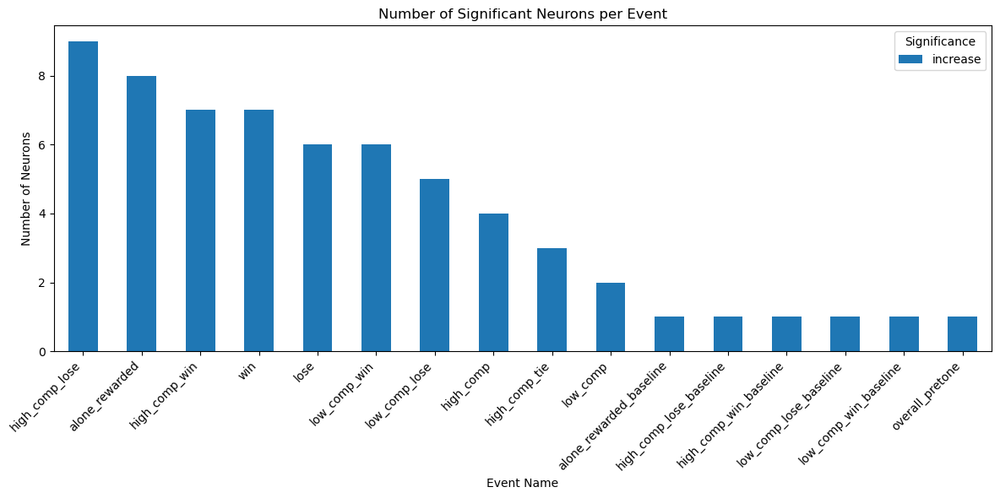

In [ ]:
# bar plot from most increasing to least increasing significant neurons per event
import matplotlib.pyplot as plt
sig_global_counts_sorted = sig_global_counts.sort_values(by='increase', ascending=False)
sig_global_counts_sorted.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Number of Significant Neurons per Event')
plt.xlabel('Event Name')
plt.ylabel('Number of Neurons')
plt.legend(title='Significance', loc='upper right')
# make the xlabels horizontal
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()



In [ ]:
# find the number of each type of event across all recordings
event_counts = {}
for rec in sp.recordings:
    for ev, windows in rec.event_dict.items():
        if ev not in event_counts:
            event_counts[ev] = 0
        event_counts[ev] += len(windows)

for ev, count in event_counts.items():
    print(f"Event: {ev}, Count: {count}")

Event: alone_rewarded, Count: 856
Event: alone_rewarded_baseline, Count: 320
Event: high_comp, Count: 625
Event: high_comp_lose, Count: 295
Event: high_comp_lose_baseline, Count: 330
Event: high_comp_win, Count: 330
Event: high_comp_win_baseline, Count: 320
Event: lose, Count: 435
Event: low_comp, Count: 316
Event: low_comp_lose, Count: 140
Event: low_comp_lose_baseline, Count: 328
Event: low_comp_win, Count: 176
Event: low_comp_win_baseline, Count: 322
Event: overall_pretone, Count: 1300
Event: win, Count: 506
Event: high_comp_tie, Count: 30


# There's an issue in the transition between not sig and sig where I'm lossing more sig that i should be. Seems like the time sig df was created then the code for it was deleted.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def run_zscore_global_baseline_psth(recording, event_name, pre_window=10, equalize=10, timebin=0.25, SD=1.65, verbose=False):
    """
    Z-score event firing rates using a global pooled baseline per unit with PSTH-like averaging.
    Computes baseline across all non-excluded events and event firing rates per time bin.
    Returns per-unit summary and time-resolved firing rates/z-scores for visualization.

    Parameters
    ----------
    recording : SpikeRecording
        SpikeRecording object with spike data and event_dict.
    event_name : str
        Event type to analyze.
    pre_window : float
        Duration (s) before events to use for baseline extraction.
    equalize : float
        Duration (s) of event window to analyze.
    timebin : float
        Bin width (s) for PSTH computation (default 0.25s = 250ms).
    SD : float
        Threshold in SD units for significance classification.
    verbose : bool
        Print debug info if True.

    Returns
    -------
    df : pd.DataFrame
        Per-unit z-scores with global baseline and PSTH-based event rates (original output).
    time_df : pd.DataFrame
        Time-resolved firing rates and z-scores, averaged across trials per unit and time bin.
    """
    # --- Step 1: Identify good units ---
    units = getattr(recording, "good_units", None)
    if units is None:
        units = [u for u, label in recording.labels_dict.items() if label == "good"]
        if verbose:
            print("Using labels_dict for good units:", units)

    # Define events to exclude from baseline
    exclude_events_baseline = [
        'alone_rewarded_baseline', 'high_comp', 'high_comp_lose_baseline',
        'high_comp_win_baseline', 'low_comp', 'low_comp_lose_baseline',
        'low_comp_win_baseline', 'lose', 'win', 'overall_pretone'
    ]

    timebin_ms = timebin * 1000
    sampling_rate = recording.sampling_rate

    # Define time bins for baseline and event periods
    baseline_bins = np.arange(-pre_window * 1000, 0 + timebin_ms, timebin_ms)
    event_bins = np.arange(0, equalize * 1000 + timebin_ms, timebin_ms)
    time_points = np.concatenate([baseline_bins[:-1], event_bins[:-1]]) / 1000  # Convert to seconds

    # --- Step 2: Compute GLOBAL baseline firing rates (PSTH-like) ---
    global_baseline_matrices = {u: [] for u in units}
    for ev_type, ev_windows in recording.event_dict.items():
        if ev_type in exclude_events_baseline:
            continue
        for unit_id in units:
            spikes_ms = recording.unit_timestamps[unit_id] * (1000 / sampling_rate)
            for w in ev_windows:
                start_baseline = w[0] - pre_window * 1000
                end_baseline = w[0]
                bins = np.arange(start_baseline, end_baseline + timebin_ms, timebin_ms)
                spike_counts = np.histogram(spikes_ms, bins=bins)[0]
                firing_rate = spike_counts * (1000 / timebin_ms)  # Hz
                global_baseline_matrices[unit_id].append(firing_rate)
                if verbose:
                    print(f"[{recording.name}] Unit {unit_id} | Baseline Event {ev_type}, Window {w}")
                    print(f"Baseline firing rates: {firing_rate}\n")

    # --- Step 3: Compute EVENT firing rates (PSTH-like) ---
    event_fr_matrices = {u: [] for u in units}
    event_windows = recording.event_dict[event_name]
    for unit_id in units:
        spikes_ms = recording.unit_timestamps[unit_id] * (1000 / sampling_rate)
        for w in event_windows:
            start_event = w[0]
            end_event = min(w[1], start_event + equalize * 1000)
            bins = np.arange(start_event, end_event + timebin_ms, timebin_ms)
            spike_counts = np.histogram(spikes_ms, bins=bins)[0]
            firing_rate = spike_counts * (1000 / timebin_ms)  # Hz
            event_fr_matrices[unit_id].append(firing_rate)
            if verbose:
                print(f"[{recording.name}] Unit {unit_id} | Event {event_name}, Window {w}")
                print(f"Event firing rates: {firing_rate}\n")

    # --- Step 4: Compute time-resolved firing rates and z-scores ---
    time_rows = []
    rows = []
    for unit_id in units:
        baseline_fr_matrix = np.array(global_baseline_matrices[unit_id])
        event_fr_matrix = np.array(event_fr_matrices[unit_id])

        if baseline_fr_matrix.size == 0 or event_fr_matrix.size == 0:
            b_mean = np.nan
            b_sd = np.nan
            ev_mean = np.nan
            zscore = np.nan
            baseline_fr_per_bin = np.full(len(baseline_bins) - 1, np.nan)
            event_fr_per_bin = np.full(len(event_bins) - 1, np.nan)
            zscore_per_bin = np.full(len(time_points), np.nan)
        else:
            # Handle inconsistent bin counts by trimming to shortest
            if len(set(len(row) for row in global_baseline_matrices[unit_id])) > 1:
                min_bins = min(len(row) for row in global_baseline_matrices[unit_id])
                baseline_fr_matrix = baseline_fr_matrix[:, :min_bins]
                if verbose:
                    print(f"Trimming baseline matrix for unit {unit_id} to {min_bins} bins")
            if len(set(len(row) for row in event_fr_matrices[unit_id])) > 1:
                min_bins = min(len(row) for row in event_fr_matrices[unit_id])
                event_fr_matrix = event_fr_matrix[:, :min_bins]
                if verbose:
                    print(f"Trimming event matrix for unit {unit_id} to {min_bins} bins")

            # Baseline stats
            b_mean_per_bin = np.mean(baseline_fr_matrix, axis=0)
            b_mean = np.mean(b_mean_per_bin) if len(b_mean_per_bin) > 0 else np.nan
            b_var_per_bin = np.var(baseline_fr_matrix, axis=0, ddof=1)
            b_sd = np.sqrt(np.mean(b_var_per_bin)) if len(b_var_per_bin) > 0 else np.nan

            # Event mean (overall for summary)
            ev_mean_per_bin = np.mean(event_fr_matrix, axis=0)
            ev_mean = np.mean(ev_mean_per_bin) if len(ev_mean_per_bin) > 0 else np.nan
            zscore = np.nan if np.isnan(b_sd) or b_sd == 0 else (ev_mean - b_mean) / b_sd

            # Time-resolved firing rates
            baseline_fr_per_bin = b_mean_per_bin[:len(baseline_bins) - 1]  # Trim to match bins
            event_fr_per_bin = ev_mean_per_bin[:len(event_bins) - 1]
            zscore_per_bin = np.concatenate([
                (baseline_fr_per_bin - b_mean) / b_sd if not np.isnan(b_sd) and b_sd != 0 else np.full(len(baseline_fr_per_bin), np.nan),
                (event_fr_per_bin - b_mean) / b_sd if not np.isnan(b_sd) and b_sd != 0 else np.full(len(event_fr_per_bin), np.nan)
            ])

        # Append to summary DataFrame
        rows.append({
            "Recording": recording.name,
            "Event name": event_name,
            "Unit number": unit_id,
            "Global Pre-event M": b_mean,
            "Global Pre-event SD": b_sd,
            "Event M": ev_mean,
            "Event Z-Score": zscore,
        })

        # Append to time-resolved DataFrame
        for t, fr, z in zip(time_points, np.concatenate([baseline_fr_per_bin, event_fr_per_bin]), zscore_per_bin):
            time_rows.append({
                "Recording": recording.name,
                "Event name": event_name,
                "Unit number": unit_id,
                "Time (s)": t,
                "Firing Rate (Hz)": fr,
                "Z-Score": z
            })

    # Create DataFrames
    df = pd.DataFrame(rows)
    df["sig"] = np.select(
        [df["Event Z-Score"] > SD, df["Event Z-Score"] < -SD],
        ["increase", "decrease"],
        default="not sig"
    )
    time_df = pd.DataFrame(time_rows)

    return df, time_df


def plot_temporal_dynamics_all_events(time_dfs, pre_window=10, equalize=10):
    """
    Plot average firing rate and z-score over time for each event type, averaged across recordings.

    Parameters
    ----------
    time_dfs : dict
        Dictionary of time-resolved DataFrames, keyed by event name.
    pre_window : float
        Duration (s) of baseline period.
    equalize : float
        Duration (s) of event period.
    """
    for event_name, time_df in time_dfs.items():
        if time_df.empty:
            print(f"Skipping {event_name}: no data")
            continue

        # Average across units and recordings
        avg_time_df = time_df.groupby("Time (s)").agg({
            "Firing Rate (Hz)": ["mean", "std"],
            "Z-Score": ["mean", "std"]
        }).reset_index()
        avg_time_df.columns = ["Time (s)", "Firing Rate Mean", "Firing Rate Std", "Z-Score Mean", "Z-Score Std"]

        # Compute standard error
        n_units = time_df.groupby(["Recording", "Unit number"]).ngroups
        avg_time_df["Firing Rate SE"] = avg_time_df["Firing Rate Std"] / np.sqrt(n_units)
        avg_time_df["Z-Score SE"] = avg_time_df["Z-Score Std"] / np.sqrt(n_units)

        # Plot
        plt.figure(figsize=(12, 8))

        # Firing rate plot
        plt.subplot(2, 1, 1)
        plt.plot(avg_time_df["Time (s)"], avg_time_df["Firing Rate Mean"], label="Mean Firing Rate", color="blue")
        plt.fill_between(
            avg_time_df["Time (s)"],
            avg_time_df["Firing Rate Mean"] - avg_time_df["Firing Rate SE"],
            avg_time_df["Firing Rate Mean"] + avg_time_df["Firing Rate SE"],
            color="blue", alpha=0.2, label="±1 SE"
        )
        plt.axvline(0, color="black", linestyle="--", label="Event Onset")
        plt.axvspan(-pre_window, 0, alpha=0.1, color="gray", label="Baseline")
        plt.axvspan(0, equalize, alpha=0.1, color="green", label="Event")
        plt.xlabel("Time (s)")
        plt.ylabel("Firing Rate (Hz)")
        plt.title(f"PSTH for {event_name} (Averaged Across Recordings)")
        plt.legend()

        # Z-score plot
        plt.subplot(2, 1, 2)
        plt.plot(avg_time_df["Time (s)"], avg_time_df["Z-Score Mean"], label="Mean Z-Score", color="red")
        plt.fill_between(
            avg_time_df["Time (s)"],
            avg_time_df["Z-Score Mean"] - avg_time_df["Z-Score SE"],
            avg_time_df["Z-Score Mean"] + avg_time_df["Z-Score SE"],
            color="red", alpha=0.2, label="±1 SE"
        )
        plt.axvline(0, color="black", linestyle="--", label="Event Onset")
        plt.axvspan(-pre_window, 0, alpha=0.1, color="gray", label="Baseline")
        plt.axvspan(0, equalize, alpha=0.1, color="green", label="Event")
        plt.axhline(1.65, color="black", linestyle=":", label="Z=1.65")
        plt.axhline(-1.65, color="black", linestyle=":")
        plt.xlabel("Time (s)")
        plt.ylabel("Z-Score")
        plt.title(f"Z-Score Dynamics for {event_name} (Averaged Across Recordings)")
        plt.legend()

        plt.tight_layout()
        plt.show()

In [ ]:
import pandas as pd
import numpy as np

def run_all_recordings_all_events_global_psth(sp, pre_window=10, equalize=10, timebin=0.25, SD=1.65, verbose=False):
    """
    Run z-score analysis for all recordings and events, collecting both per-unit and time-resolved data.

    Parameters
    ----------
    sp : object
        Object containing a list of SpikeRecording objects in sp.recordings.
    pre_window : float
        Duration (s) before events for baseline.
    equalize : float
        Duration (s) of event window to analyze.
    timebin : float
        Bin width (s) for PSTH computation.
    SD : float
        Threshold in SD units for significance classification.
    verbose : bool
        Print debug info if True.

    Returns
    -------
    big_df : pd.DataFrame
        Concatenated per-unit z-scores across all recordings and events.
    time_dfs : dict
        Dictionary of time-resolved DataFrames, keyed by event name.
    skipped_df : pd.DataFrame
        Records of skipped recording-event pairs with reasons.
    """
    all_event_names = sorted({ev for rec in sp.recordings for ev in rec.event_dict.keys()})
    dfs = []
    time_dfs = {ev: [] for ev in all_event_names}  # Store time_df for each event
    skipped = []

    for rec in sp.recordings:
        for ev in all_event_names:
            if ev not in rec.event_dict or len(rec.event_dict[ev]) == 0:
                skipped.append((rec.name, ev, "no windows"))
                continue
            try:
                # Run the modified function, which returns (df, time_df)
                df, time_df = run_zscore_global_baseline_psth(
                    recording=rec,
                    event_name=ev,
                    pre_window=pre_window,
                    equalize=equalize,
                    timebin=timebin,
                    SD=SD,
                    verbose=verbose
                )
                if not df.empty:
                    df["Event windows"] = len(rec.event_dict[ev])
                    dfs.append(df)
                else:
                    skipped.append((rec.name, ev, "empty per-unit result"))
                if not time_df.empty:
                    time_dfs[ev].append(time_df)
                else:
                    skipped.append((rec.name, ev, "empty time-resolved result"))
            except Exception as e:
                skipped.append((rec.name, ev, f"error: {str(e)}"))

    # Concatenate per-unit DataFrames
    big_df = pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()

    # Concatenate time-resolved DataFrames for each event
    time_dfs_combined = {
        ev: pd.concat(tdfs, ignore_index=True) if tdfs else pd.DataFrame()
        for ev, tdfs in time_dfs.items()
    }

    # Create skipped DataFrame
    skipped_df = pd.DataFrame(skipped, columns=["Recording", "Event name", "reason"])

    return big_df, time_dfs_combined, skipped_df

big_df shape: (6677, 9)
Skipped counts: 228
# sig: sig
not sig     6614
increase      63
Name: count, dtype: int64


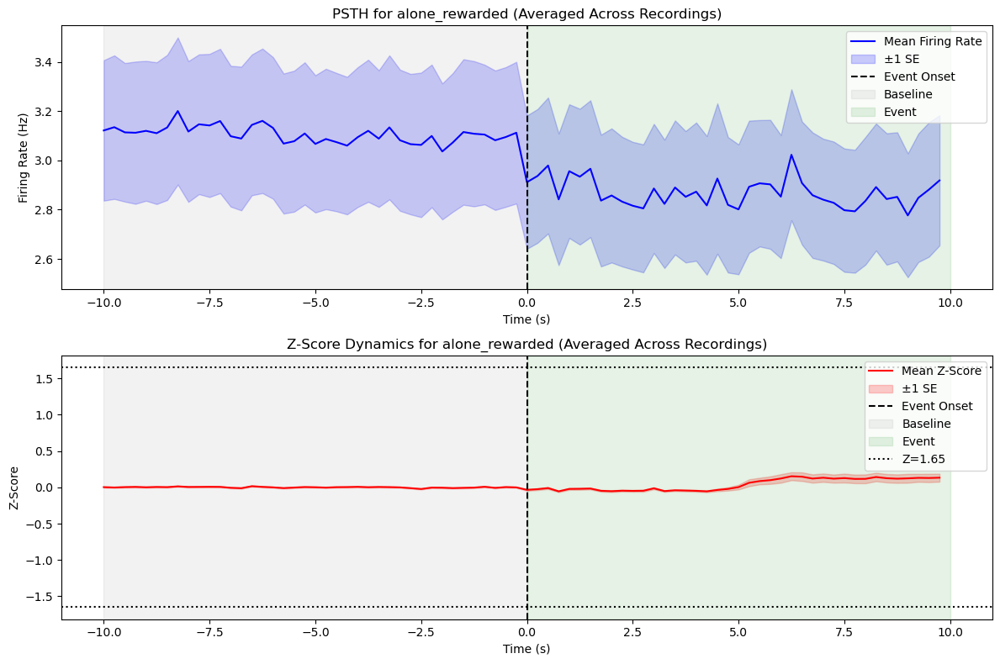

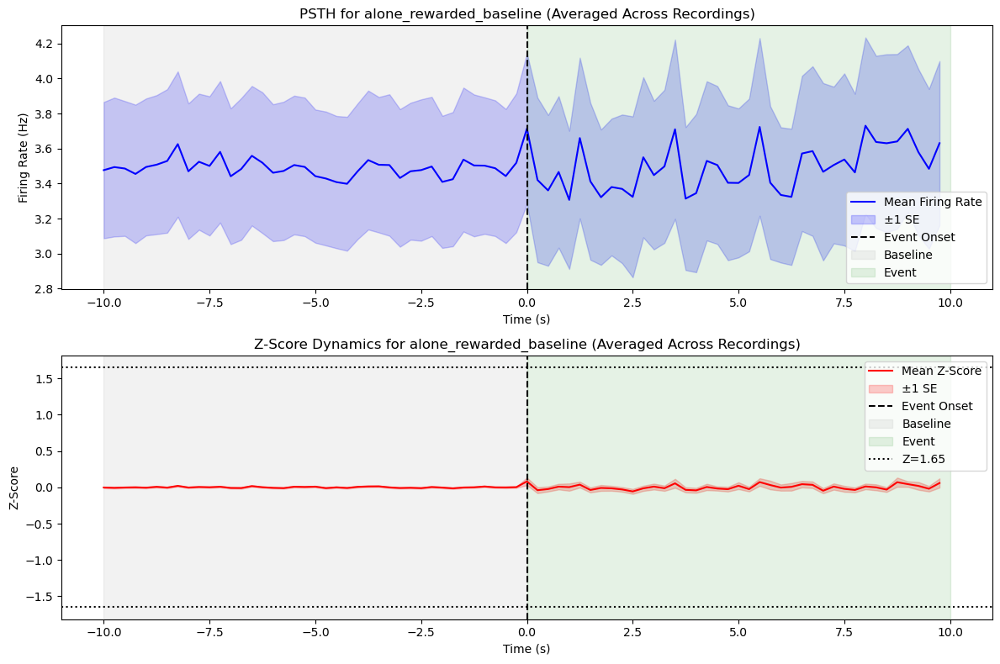

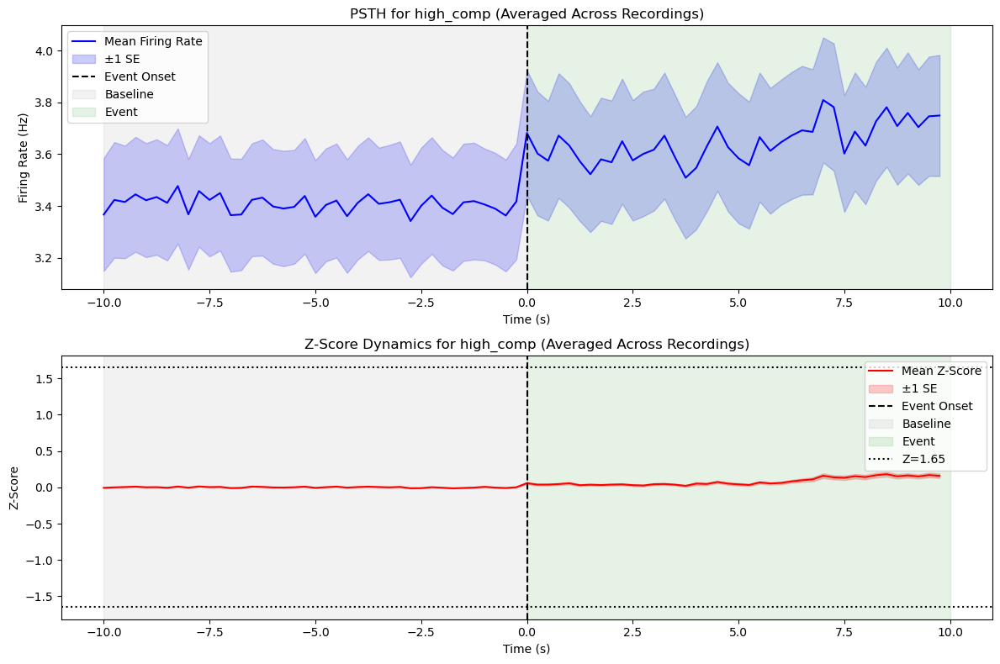

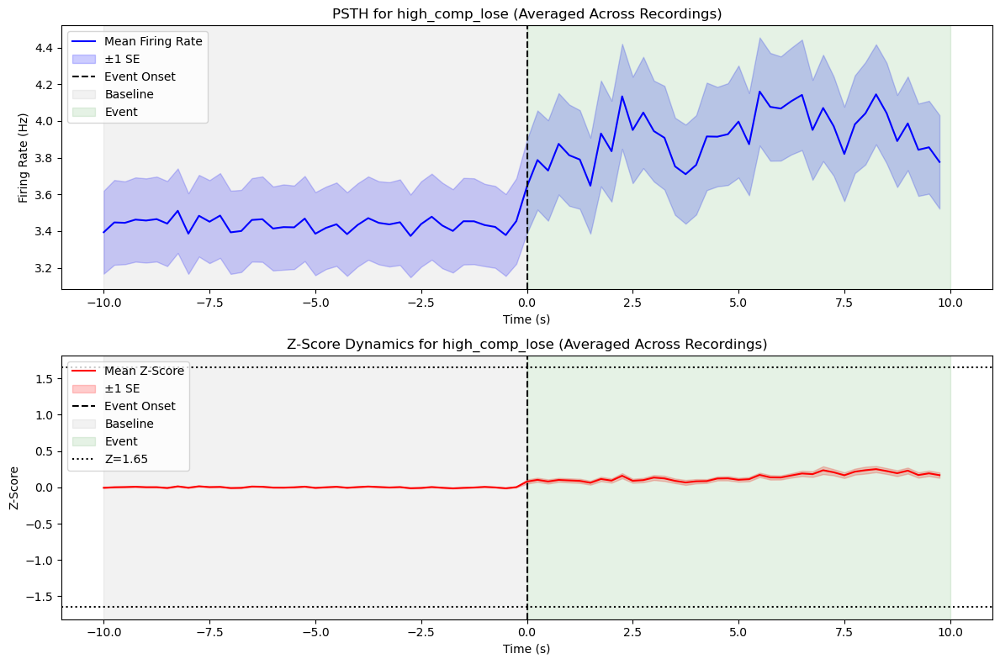

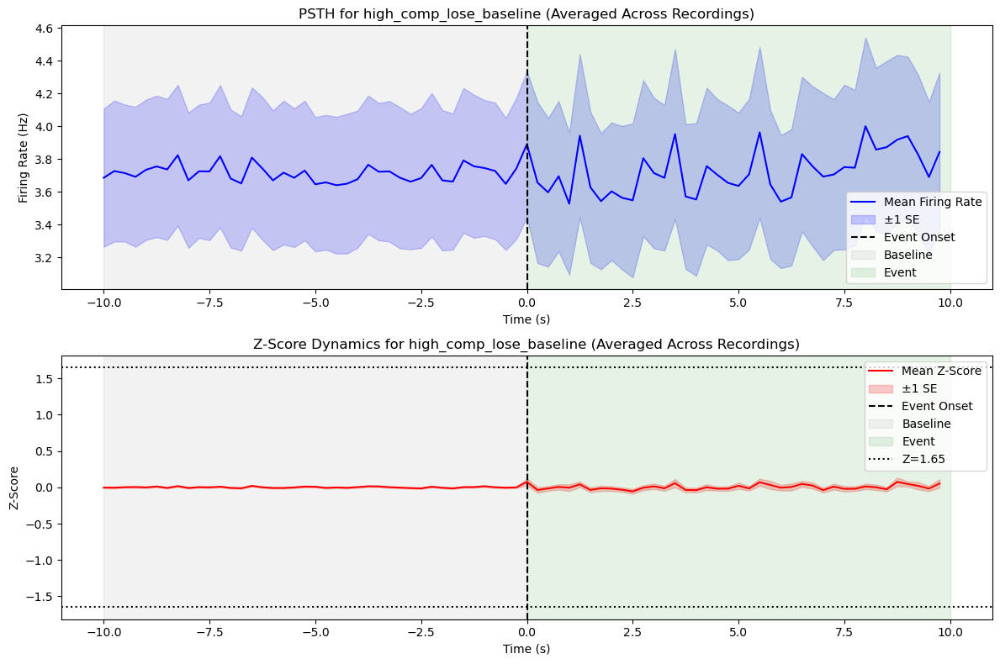

...

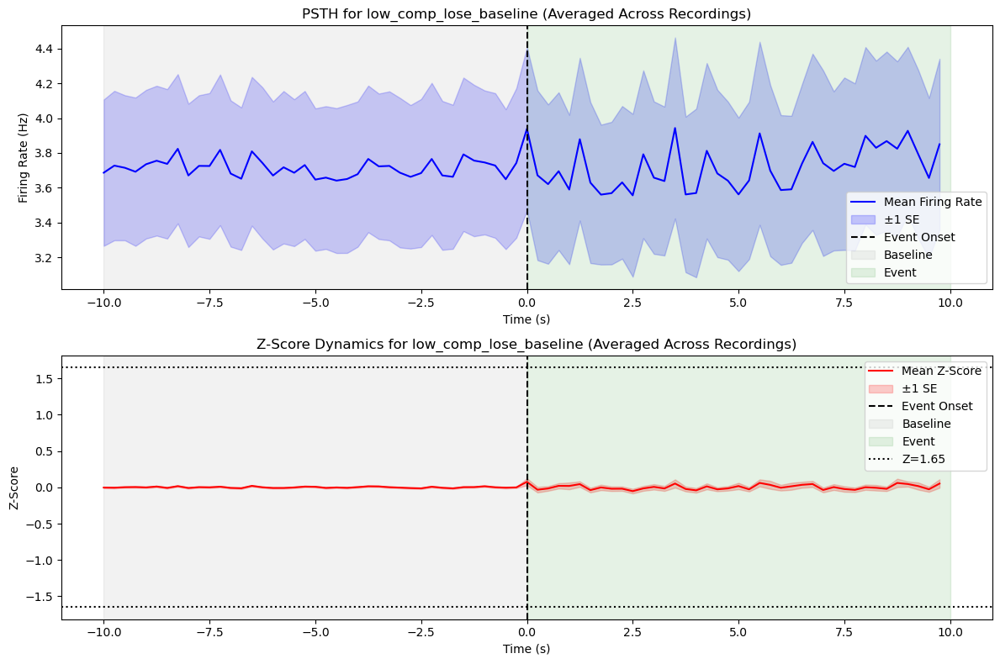

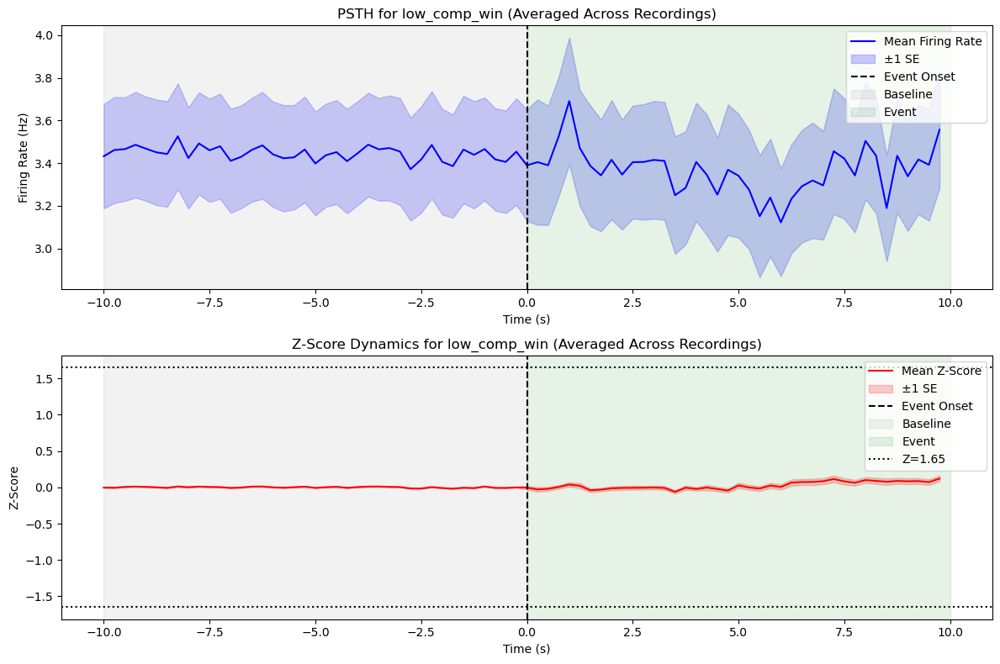

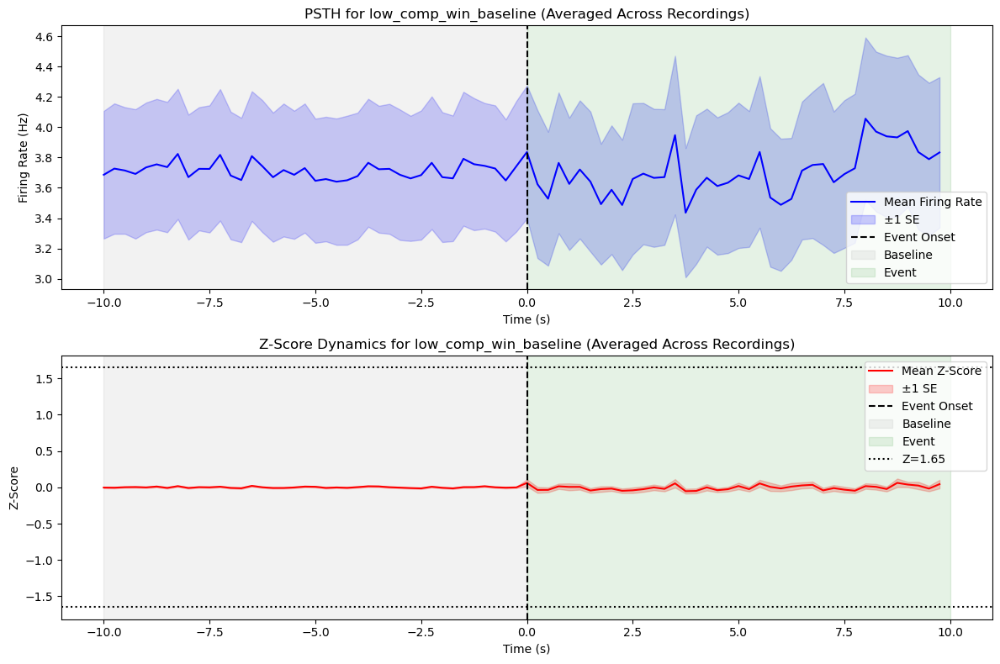

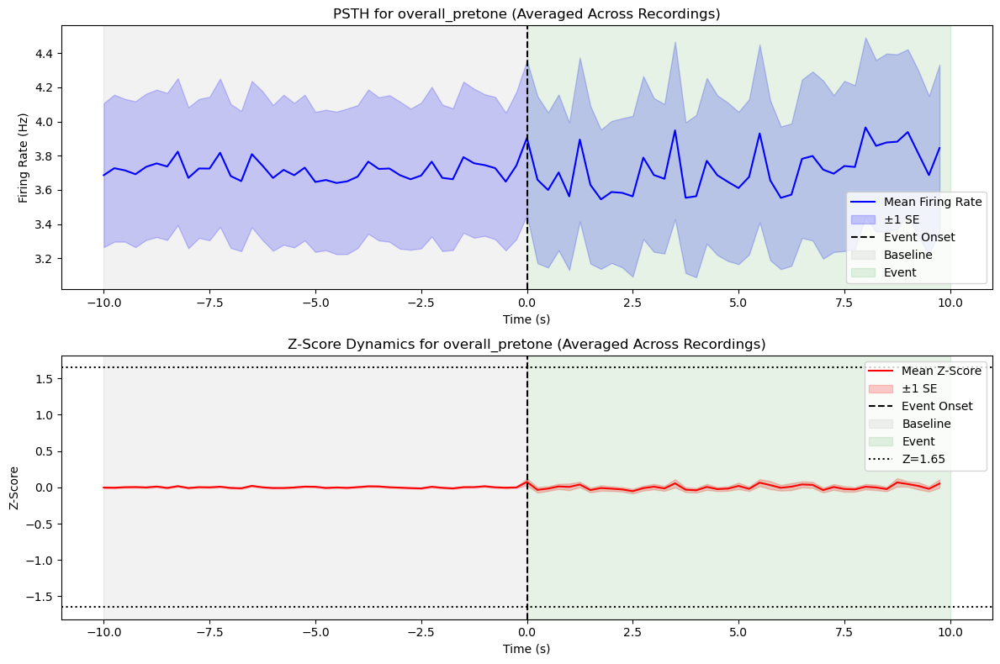

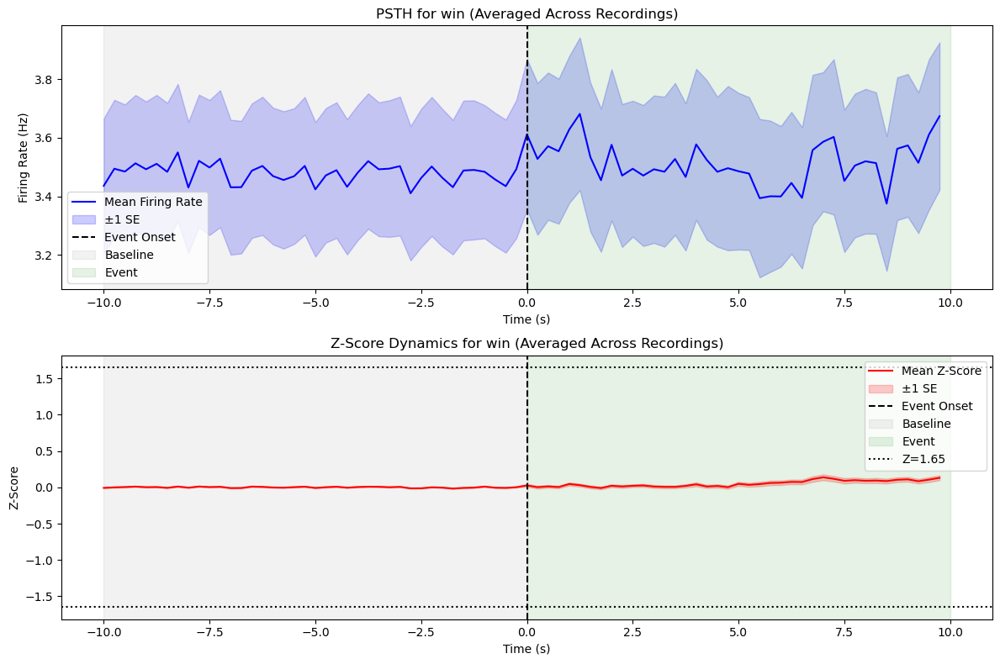

In [ ]:
# Run the analysis across all recordings and events
big_df, time_dfs, skipped_df = run_all_recordings_all_events_global_psth(
    sp,
    pre_window=10,
    equalize=10,
    timebin=0.25,
    SD=1.65,
    verbose=False
)

# Print summary
print(f"big_df shape: {big_df.shape}")
print(f"Skipped counts: {skipped_df.shape[0]}")
print(f"# sig: {big_df['sig'].value_counts()}")
'''
# Save per-unit results
big_df.to_csv(
    "C:/Users/thoma/Code/ResearchCode/diff_fam_social_memory_ephys/other_peoples_sutff/Thomas/reward_comp/outputs/zscores_global_baseline.csv",
    index=False
)

# Save time-resolved results for each event
for event_name, time_df in time_dfs.items():
    if not time_df.empty:
        time_df.to_csv(
            f"C:/Users/thoma/Code/ResearchCode/diff_fam_social_memory_ephys/other_peoples_sutff/Thomas/reward_comp/outputs/time_resolved_{event_name}.csv",
            index=False
        )
'''
# Plot temporal dynamics for all events
plot_temporal_dynamics_all_events(time_dfs, pre_window=10, equalize=10)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def run_zscore_global_baseline_psth_extended_sig_only(recording, event_name, significant_units, pre_window=10, 
                                                      equalize=10, post_window=5, timebin=0.25, SD=1.65, verbose=False):
    """
    Z-score event firing rates using a global pooled baseline, but only for SIGNIFICANT units.
    Extends the analysis window to include post_window seconds after the event ends.
    
    Parameters
    ----------
    recording : SpikeRecording
        SpikeRecording object with spike data and event_dict.
    event_name : str
        Event type to analyze.
    significant_units : list
        List of unit IDs that are significant for this event type.
    pre_window : float
        Duration (s) before events to use for baseline extraction.
    equalize : float
        Duration (s) of event window to analyze.
    post_window : float
        Duration (s) after event to include in analysis.
    timebin : float
        Bin width (s) for PSTH computation (default 0.25s = 250ms).
    SD : float
        Threshold in SD units for significance classification.
    verbose : bool
        Print debug info if True.

    Returns
    -------
    df : pd.DataFrame
        Per-unit z-scores with global baseline and PSTH-based event rates (only significant units).
    time_df : pd.DataFrame
        Time-resolved firing rates and z-scores for significant units only.
    """
    # Only analyze significant units
    units = significant_units
    if not units:
        if verbose:
            print(f"No significant units for {event_name}")
        return pd.DataFrame(), pd.DataFrame()
    
    if verbose:
        print(f"Analyzing {len(units)} significant units for {event_name}: {units}")

    # Define events to exclude from baseline
    exclude_events_baseline = [
        'alone_rewarded_baseline', 'high_comp', 'high_comp_lose_baseline',
        'high_comp_win_baseline', 'low_comp', 'low_comp_lose_baseline',
        'low_comp_win_baseline', 'lose', 'win', 'overall_pretone'
    ]

    timebin_ms = timebin * 1000
    sampling_rate = recording.sampling_rate

    # Define time bins for baseline, event, and post-event periods
    baseline_bins = np.arange(-pre_window * 1000, 0 + timebin_ms, timebin_ms)
    event_bins = np.arange(0, equalize * 1000 + timebin_ms, timebin_ms)
    post_bins = np.arange(equalize * 1000, (equalize + post_window) * 1000 + timebin_ms, timebin_ms)
    
    # Combine all time points
    time_points = np.concatenate([
        baseline_bins[:-1], 
        event_bins[:-1], 
        post_bins[:-1]
    ]) / 1000  # Convert to seconds

    # --- Step 2: Compute GLOBAL baseline firing rates (PSTH-like) ---
    global_baseline_matrices = {u: [] for u in units}
    for ev_type, ev_windows in recording.event_dict.items():
        if ev_type in exclude_events_baseline:
            continue
        for unit_id in units:
            spikes_ms = recording.unit_timestamps[unit_id] * (1000 / sampling_rate)
            for w in ev_windows:
                start_baseline = w[0] - pre_window * 1000
                end_baseline = w[0]
                bins = np.arange(start_baseline, end_baseline + timebin_ms, timebin_ms)
                spike_counts = np.histogram(spikes_ms, bins=bins)[0]
                firing_rate = spike_counts * (1000 / timebin_ms)  # Hz
                global_baseline_matrices[unit_id].append(firing_rate)

    # --- Step 3: Compute EVENT + POST-EVENT firing rates ---
    event_fr_matrices = {u: [] for u in units}
    post_fr_matrices = {u: [] for u in units}
    event_windows = recording.event_dict[event_name]
    
    for unit_id in units:
        spikes_ms = recording.unit_timestamps[unit_id] * (1000 / sampling_rate)
        for w in event_windows:
            start_event = w[0]
            end_event = min(w[1], start_event + equalize * 1000)
            
            # Event period
            bins = np.arange(start_event, end_event + timebin_ms, timebin_ms)
            spike_counts = np.histogram(spikes_ms, bins=bins)[0]
            firing_rate = spike_counts * (1000 / timebin_ms)  # Hz
            event_fr_matrices[unit_id].append(firing_rate)
            
            # Post-event period
            start_post = end_event
            end_post = start_post + post_window * 1000
            bins_post = np.arange(start_post, end_post + timebin_ms, timebin_ms)
            spike_counts_post = np.histogram(spikes_ms, bins=bins_post)[0]
            firing_rate_post = spike_counts_post * (1000 / timebin_ms)  # Hz
            post_fr_matrices[unit_id].append(firing_rate_post)

    # --- Step 4: Compute time-resolved firing rates and z-scores ---
    time_rows = []
    rows = []
    for unit_id in units:
        baseline_fr_matrix = np.array(global_baseline_matrices[unit_id])
        event_fr_matrix = np.array(event_fr_matrices[unit_id])
        post_fr_matrix = np.array(post_fr_matrices[unit_id])

        if baseline_fr_matrix.size == 0 or event_fr_matrix.size == 0:
            # Skip if no data
            continue
        
        # Handle inconsistent bin counts
        if len(set(len(row) for row in global_baseline_matrices[unit_id])) > 1:
            min_bins = min(len(row) for row in global_baseline_matrices[unit_id])
            baseline_fr_matrix = baseline_fr_matrix[:, :min_bins]
        if len(set(len(row) for row in event_fr_matrices[unit_id])) > 1:
            min_bins = min(len(row) for row in event_fr_matrices[unit_id])
            event_fr_matrix = event_fr_matrix[:, :min_bins]
        if len(set(len(row) for row in post_fr_matrices[unit_id])) > 1:
            min_bins = min(len(row) for row in post_fr_matrices[unit_id])
            post_fr_matrix = post_fr_matrix[:, :min_bins]

        # Baseline stats
        b_mean_per_bin = np.mean(baseline_fr_matrix, axis=0)
        b_mean = np.mean(b_mean_per_bin) if len(b_mean_per_bin) > 0 else np.nan
        b_var_per_bin = np.var(baseline_fr_matrix, axis=0, ddof=1)
        b_sd = np.sqrt(np.mean(b_var_per_bin)) if len(b_var_per_bin) > 0 else np.nan

        # Event mean (overall for summary)
        ev_mean_per_bin = np.mean(event_fr_matrix, axis=0)
        ev_mean = np.mean(ev_mean_per_bin) if len(ev_mean_per_bin) > 0 else np.nan
        zscore = np.nan if np.isnan(b_sd) or b_sd == 0 else (ev_mean - b_mean) / b_sd

        # Post-event mean  
        post_mean_per_bin = np.mean(post_fr_matrix, axis=0) if post_fr_matrix.size > 0 else np.array([])

        # Time-resolved firing rates
        baseline_fr_per_bin = b_mean_per_bin[:len(baseline_bins) - 1]
        event_fr_per_bin = ev_mean_per_bin[:len(event_bins) - 1]
        post_fr_per_bin = post_mean_per_bin[:len(post_bins) - 1] if len(post_mean_per_bin) > 0 else np.array([])
        
        # Combine all firing rates
        all_firing_rates = np.concatenate([baseline_fr_per_bin, event_fr_per_bin, post_fr_per_bin])
        
        # Z-scores for all time points
        zscore_per_bin = (all_firing_rates - b_mean) / b_sd if not np.isnan(b_sd) and b_sd != 0 else np.full(len(all_firing_rates), np.nan)

        # Append to summary DataFrame
        rows.append({
            "Recording": recording.name,
            "Event name": event_name,
            "Unit number": unit_id,
            "Global Pre-event M": b_mean,
            "Global Pre-event SD": b_sd,
            "Event M": ev_mean,
            "Event Z-Score": zscore,
        })

        # Append to time-resolved DataFrame
        for t, fr, z in zip(time_points[:len(all_firing_rates)], all_firing_rates, zscore_per_bin):
            time_rows.append({
                "Recording": recording.name,
                "Event name": event_name,
                "Unit number": unit_id,
                "Time (s)": t,
                "Firing Rate (Hz)": fr,
                "Z-Score": z
            })

    # Create DataFrames
    df = pd.DataFrame(rows)
    df["sig"] = np.select(
        [df["Event Z-Score"] > SD, df["Event Z-Score"] < -SD],
        ["increase", "decrease"],
        default="not sig"
    )
    time_df = pd.DataFrame(time_rows)

    return df, time_df

In [ ]:
# Check what we have for alone_rewarded event
print("Checking alone_rewarded data:")
print(f"Available events in time_dfs_sig_only: {list(time_dfs_sig_only.keys())}")

if 'alone_rewarded' in time_dfs_sig_only:
    alone_rewarded_df = time_dfs_sig_only['alone_rewarded']
    print(f"\nalone_rewarded data shape: {alone_rewarded_df.shape}")
    print(f"Unique units: {sorted(alone_rewarded_df['Unit number'].unique())}")
    print(f"Number of unique units: {alone_rewarded_df['Unit number'].nunique()}")
    print(f"Time range: {alone_rewarded_df['Time (s)'].min():.2f} to {alone_rewarded_df['Time (s)'].max():.2f} seconds")
    print(f"Available recordings: {sorted(alone_rewarded_df['Recording'].unique())}")
else:
    print("alone_rewarded not found in time_dfs_sig_only")

Checking alone_rewarded data:
Available events in time_dfs_sig_only: ['alone_rewarded', 'alone_rewarded_baseline', 'high_comp', 'high_comp_lose', 'high_comp_lose_baseline', 'high_comp_tie', 'high_comp_win', 'high_comp_win_baseline', 'lose', 'low_comp', 'low_comp_lose', 'low_comp_lose_baseline', 'low_comp_win', 'low_comp_win_baseline', 'overall_pretone', 'win']

alone_rewarded data shape: (720, 6)
Unique units: ['104', '107', '108', '190', '23', '64']
Number of unique units: 6
Time range: -10.00 to 19.75 seconds
Available recordings: ['20230613_105657_standard_comp_to_training_D2_subj_1-4_t4b3L_box2_merged.rec', '20230616_111904_standard_comp_to_training_D4_subj_1-4_t4b3L_box1_merged.rec']


Plotting individual units for alone_rewarded
Units: ['104', '107', '108', '190', '23', '64']
Recordings: ['20230613_105657_standard_comp_to_training_D2_subj_1-4_t4b3L_box2_merged.rec', '20230616_111904_standard_comp_to_training_D4_subj_1-4_t4b3L_box1_merged.rec']


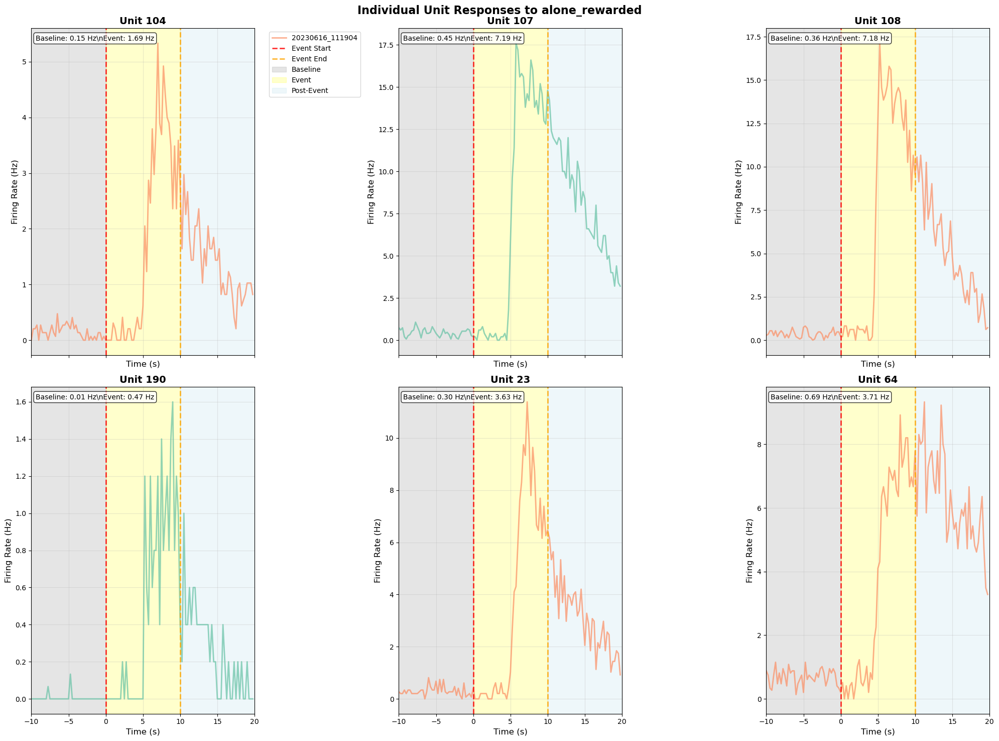

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_individual_units_psth(time_df, event_name, figsize=(20, 15)):
    """
    Create individual PSTH plots for each unit showing their neural response to a specific event.
    
    Parameters
    ----------
    time_df : pd.DataFrame
        Time-resolved firing rate and z-score data
    event_name : str
        Name of the event to plot
    figsize : tuple
        Figure size (width, height)
    """
    
    # Get unique units and recordings
    unique_units = sorted(time_df['Unit number'].unique())
    unique_recordings = sorted(time_df['Recording'].unique())
    
    print(f"Plotting individual units for {event_name}")
    print(f"Units: {unique_units}")
    print(f"Recordings: {unique_recordings}")
    
    # Create subplots - arrange in a grid
    n_units = len(unique_units)
    n_cols = 3  # 3 columns
    n_rows = int(np.ceil(n_units / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, sharey=False, sharex=True)
    if n_units == 1:
        axes = [axes]
    elif n_rows == 1:
        axes = axes.reshape(1, -1)
    
    # Color palette for recordings
    recording_colors = sns.color_palette("Set2", len(unique_recordings))
    recording_color_map = dict(zip(unique_recordings, recording_colors))
    
    # Plot each unit
    for i, unit in enumerate(unique_units):
        row = i // n_cols
        col = i % n_cols
        ax = axes[row, col]
        
        # Filter data for this unit
        unit_data = time_df[time_df['Unit number'] == unit].copy()
        
        # Plot firing rate for each recording
        for rec in unique_recordings:
            rec_data = unit_data[unit_data['Recording'] == rec]
            if not rec_data.empty:
                ax.plot(rec_data['Time (s)'], rec_data['Firing Rate (Hz)'], 
                       color=recording_color_map[rec], alpha=0.7, linewidth=2,
                       label=f"{rec.split('_')[0]}_{rec.split('_')[1]}")  # Shortened recording name
        
        # Add event markers
        ax.axvline(x=0, color='red', linestyle='--', alpha=0.8, linewidth=2, label='Event Start')
        ax.axvline(x=10, color='orange', linestyle='--', alpha=0.8, linewidth=2, label='Event End')
        ax.axvspan(-10, 0, alpha=0.2, color='gray', label='Baseline')
        ax.axvspan(0, 10, alpha=0.2, color='yellow', label='Event')
        ax.axvspan(10, 20, alpha=0.2, color='lightblue', label='Post-Event')
        
        # Formatting
        ax.set_title(f'Unit {unit}', fontsize=14, fontweight='bold')
        ax.set_xlabel('Time (s)', fontsize=12)
        ax.set_ylabel('Firing Rate (Hz)', fontsize=12)
        ax.grid(True, alpha=0.3)
        
        # Add legend only for first plot
        if i == 0:
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
        
        # Set consistent x-axis limits
        ax.set_xlim(-10, 20)
        
        # Add some stats as text
        unit_mean_baseline = unit_data[unit_data['Time (s)'] < 0]['Firing Rate (Hz)'].mean()
        unit_mean_event = unit_data[(unit_data['Time (s)'] >= 0) & (unit_data['Time (s)'] < 10)]['Firing Rate (Hz)'].mean()
        
        ax.text(0.02, 0.98, f'Baseline: {unit_mean_baseline:.2f} Hz\\nEvent: {unit_mean_event:.2f} Hz', 
                transform=ax.transAxes, verticalalignment='top', fontsize=10,
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Hide empty subplots
    for i in range(n_units, n_rows * n_cols):
        row = i // n_cols
        col = i % n_cols
        axes[row, col].set_visible(False)
    
    plt.suptitle(f'Individual Unit Responses to {event_name}', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return fig

# Plot individual units for alone_rewarded
if 'alone_rewarded' in time_dfs_sig_only:
    fig = plot_individual_units_psth(time_dfs_sig_only['alone_rewarded'], 'alone_rewarded')
else:
    print("alone_rewarded data not available")

Plotting individual Z-scores for alone_rewarded


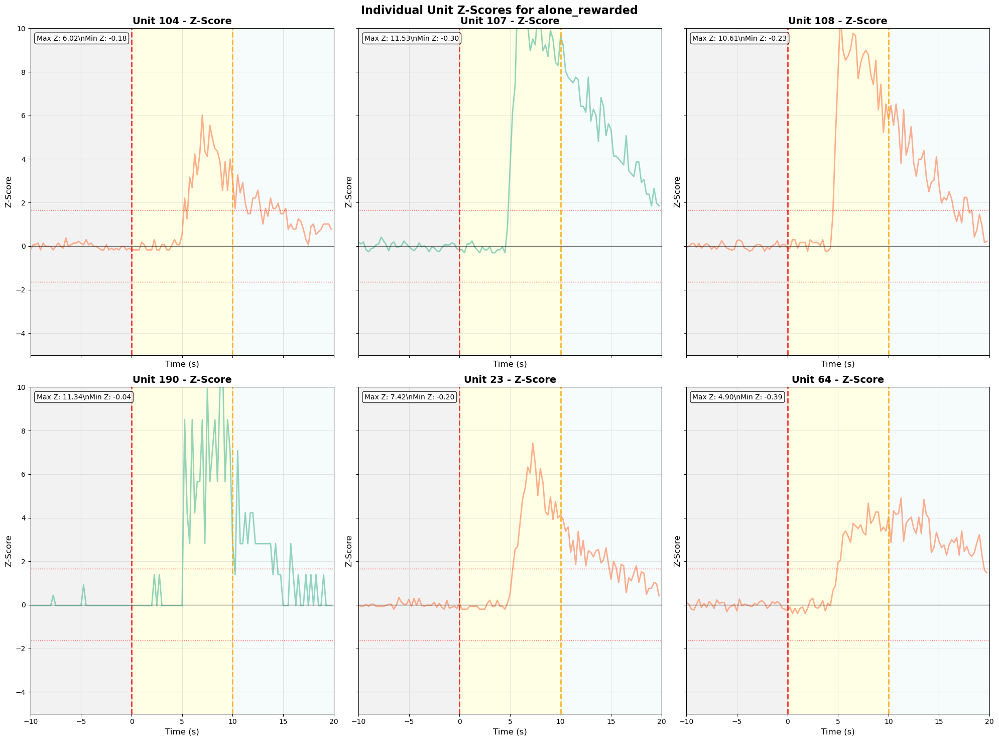

In [ ]:
# Create Z-score plots for better comparison of significance
def plot_individual_units_zscore(time_df, event_name, figsize=(20, 15)):
    """
    Create individual Z-score plots for each unit showing their neural response significance.
    
    Parameters
    ----------
    time_df : pd.DataFrame
        Time-resolved firing rate and z-score data
    event_name : str
        Name of the event to plot
    figsize : tuple
        Figure size (width, height)
    """
    
    # Get unique units and recordings
    unique_units = sorted(time_df['Unit number'].unique())
    unique_recordings = sorted(time_df['Recording'].unique())
    
    print(f"Plotting individual Z-scores for {event_name}")
    
    # Create subplots - arrange in a grid
    n_units = len(unique_units)
    n_cols = 3  # 3 columns
    n_rows = int(np.ceil(n_units / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, sharey=True, sharex=True)
    if n_units == 1:
        axes = [axes]
    elif n_rows == 1:
        axes = axes.reshape(1, -1)
    
    # Color palette for recordings
    recording_colors = sns.color_palette("Set2", len(unique_recordings))
    recording_color_map = dict(zip(unique_recordings, recording_colors))
    
    # Plot each unit
    for i, unit in enumerate(unique_units):
        row = i // n_cols
        col = i % n_cols
        ax = axes[row, col]
        
        # Filter data for this unit
        unit_data = time_df[time_df['Unit number'] == unit].copy()
        
        # Plot Z-score for each recording
        for rec in unique_recordings:
            rec_data = unit_data[unit_data['Recording'] == rec]
            if not rec_data.empty:
                ax.plot(rec_data['Time (s)'], rec_data['Z-Score'], 
                       color=recording_color_map[rec], alpha=0.7, linewidth=2,
                       label=f"{rec.split('_')[0]}_{rec.split('_')[1]}")
        
        # Add significance thresholds
        ax.axhline(y=1.65, color='red', linestyle=':', alpha=0.8, linewidth=1, label='Sig threshold (+)')
        ax.axhline(y=-1.65, color='red', linestyle=':', alpha=0.8, linewidth=1, label='Sig threshold (-)')
        ax.axhline(y=0, color='black', linestyle='-', alpha=0.5, linewidth=1)
        
        # Add event markers
        ax.axvline(x=0, color='red', linestyle='--', alpha=0.8, linewidth=2)
        ax.axvline(x=10, color='orange', linestyle='--', alpha=0.8, linewidth=2)
        ax.axvspan(-10, 0, alpha=0.1, color='gray')
        ax.axvspan(0, 10, alpha=0.1, color='yellow')
        ax.axvspan(10, 20, alpha=0.1, color='lightblue')
        
        # Formatting
        ax.set_title(f'Unit {unit} - Z-Score', fontsize=14, fontweight='bold')
        ax.set_xlabel('Time (s)', fontsize=12)
        ax.set_ylabel('Z-Score', fontsize=12)
        ax.grid(True, alpha=0.3)
        
        # Set consistent axis limits
        ax.set_xlim(-10, 20)
        ax.set_ylim(-5, 10)  # Adjust as needed
        
        # Add peak Z-score info
        max_zscore = unit_data['Z-Score'].max()
        min_zscore = unit_data['Z-Score'].min()
        
        ax.text(0.02, 0.98, f'Max Z: {max_zscore:.2f}\\nMin Z: {min_zscore:.2f}', 
                transform=ax.transAxes, verticalalignment='top', fontsize=10,
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Hide empty subplots
    for i in range(n_units, n_rows * n_cols):
        row = i // n_cols
        col = i % n_cols
        axes[row, col].set_visible(False)
    
    plt.suptitle(f'Individual Unit Z-Scores for {event_name}', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return fig

# Plot Z-scores for alone_rewarded
if 'alone_rewarded' in time_dfs_sig_only:
    fig_zscore = plot_individual_units_zscore(time_dfs_sig_only['alone_rewarded'], 'alone_rewarded')
else:
    print("alone_rewarded data not available")

In [ ]:
# Analyze response patterns to identify similar neurons
def analyze_response_patterns(time_df, event_name):
    """
    Analyze response patterns to identify similarities between units.
    """
    print(f"=== Response Pattern Analysis for {event_name} ===")
    
    # Get unique units
    unique_units = sorted(time_df['Unit number'].unique())
    
    # Create summary statistics for each unit
    unit_stats = []
    
    for unit in unique_units:
        unit_data = time_df[time_df['Unit number'] == unit].copy()
        
        # Baseline stats (-10 to 0 s)
        baseline_data = unit_data[unit_data['Time (s)'] < 0]
        baseline_mean = baseline_data['Firing Rate (Hz)'].mean()
        baseline_std = baseline_data['Firing Rate (Hz)'].std()
        
        # Event stats (0 to 10 s)
        event_data = unit_data[(unit_data['Time (s)'] >= 0) & (unit_data['Time (s)'] < 10)]
        event_mean = event_data['Firing Rate (Hz)'].mean()
        event_max = event_data['Firing Rate (Hz)'].max()
        event_peak_time = event_data.loc[event_data['Firing Rate (Hz)'].idxmax(), 'Time (s)']
        
        # Post-event stats (10 to 20 s)
        post_data = unit_data[unit_data['Time (s)'] >= 10]
        post_mean = post_data['Firing Rate (Hz)'].mean()
        
        # Z-score stats
        max_zscore = unit_data['Z-Score'].max()
        min_zscore = unit_data['Z-Score'].min()
        zscore_range = max_zscore - min_zscore
        
        # Response characteristics
        response_type = "No response"
        if max_zscore > 1.65:
            response_type = "Increase"
        elif min_zscore < -1.65:
            response_type = "Decrease"
        
        # Response dynamics
        early_event = event_data[event_data['Time (s)'] <= 5]['Firing Rate (Hz)'].mean()
        late_event = event_data[event_data['Time (s)'] > 5]['Firing Rate (Hz)'].mean()
        
        unit_stats.append({
            'Unit': unit,
            'Baseline_Mean': baseline_mean,
            'Baseline_Std': baseline_std,
            'Event_Mean': event_mean,
            'Event_Max': event_max,
            'Event_Peak_Time': event_peak_time,
            'Post_Mean': post_mean,
            'Max_Zscore': max_zscore,
            'Min_Zscore': min_zscore,
            'Zscore_Range': zscore_range,
            'Response_Type': response_type,
            'Early_Event': early_event,
            'Late_Event': late_event,
            'Response_Ratio': event_mean / baseline_mean if baseline_mean > 0 else np.inf
        })
    
    stats_df = pd.DataFrame(unit_stats)
    
    print("\\n1. UNIT SUMMARY STATISTICS:")
    print(stats_df.round(2))
    
    print("\\n2. RESPONSE CLASSIFICATION:")
    response_counts = stats_df['Response_Type'].value_counts()
    for resp_type, count in response_counts.items():
        units = stats_df[stats_df['Response_Type'] == resp_type]['Unit'].tolist()
        print(f"  {resp_type}: {count} units - {units}")
    
    print("\\n3. SIMILAR RESPONSE PATTERNS:")
    
    # Group by response type and similar characteristics
    increase_units = stats_df[stats_df['Response_Type'] == 'Increase']
    if len(increase_units) > 1:
        print("\\n   Increase Response Units:")
        for _, unit_row in increase_units.iterrows():
            print(f"     Unit {unit_row['Unit']}: Peak at {unit_row['Event_Peak_Time']:.1f}s, "
                  f"Max Z-score: {unit_row['Max_Zscore']:.2f}, "
                  f"Response ratio: {unit_row['Response_Ratio']:.2f}x")
        
        # Find most similar pairs based on peak timing and magnitude
        print("\\n     Similarity Analysis (Peak timing and magnitude):")
        for i in range(len(increase_units)):
            for j in range(i+1, len(increase_units)):
                unit1 = increase_units.iloc[i]
                unit2 = increase_units.iloc[j]
                
                time_diff = abs(unit1['Event_Peak_Time'] - unit2['Event_Peak_Time'])
                zscore_diff = abs(unit1['Max_Zscore'] - unit2['Max_Zscore'])
                
                print(f"       Units {unit1['Unit']} & {unit2['Unit']}: "
                      f"Peak time diff: {time_diff:.1f}s, "
                      f"Z-score diff: {zscore_diff:.2f}")
    
    decrease_units = stats_df[stats_df['Response_Type'] == 'Decrease']
    if len(decrease_units) > 1:
        print("\\n   Decrease Response Units:")
        for _, unit_row in decrease_units.iterrows():
            print(f"     Unit {unit_row['Unit']}: Min Z-score: {unit_row['Min_Zscore']:.2f}")
    
    print("\\n4. RESPONSE DYNAMICS:")
    for _, unit_row in stats_df.iterrows():
        early_late_ratio = unit_row['Early_Event'] / unit_row['Late_Event'] if unit_row['Late_Event'] > 0 else np.inf
        dynamics = "Sustained" if 0.5 <= early_late_ratio <= 2.0 else ("Early peak" if early_late_ratio > 2.0 else "Late peak")
        print(f"   Unit {unit_row['Unit']}: {dynamics} "
              f"(Early: {unit_row['Early_Event']:.2f} Hz, Late: {unit_row['Late_Event']:.2f} Hz)")
    
    return stats_df

# Run analysis for alone_rewarded
if 'alone_rewarded' in time_dfs_sig_only:
    stats_alone_rewarded = analyze_response_patterns(time_dfs_sig_only['alone_rewarded'], 'alone_rewarded')
else:
    print("alone_rewarded data not available")

=== Response Pattern Analysis for alone_rewarded ===
\n1. UNIT SUMMARY STATISTICS:
  Unit  Baseline_Mean  Baseline_Std  Event_Mean  Event_Max  Event_Peak_Time  \
0  104           0.15          0.12        1.69       5.33             7.00   
1  107           0.45          0.23        7.19      17.60             5.75   
2  108           0.36          0.22        7.18      17.13             5.25   
3  190           0.00          0.02        0.47       1.60             9.00   
4   23           0.30          0.19        3.63      11.38             7.25   
5   64           0.69          0.26        3.71       8.92             8.00   

   Post_Mean  Max_Zscore  Min_Zscore  Zscore_Range Response_Type  Early_Event  \
0       1.40        6.02       -0.18          6.19      Increase         0.14   
1       8.10       11.53       -0.30         11.83      Increase         0.60   
2       5.11       10.61       -0.23         10.84      Increase         1.51   
3       0.25       11.34       -0.04   

\n=== Correlation Analysis for alone_rewarded ===
Data shape for correlation: (120, 6)
Time range: -10.00 to 19.75 seconds


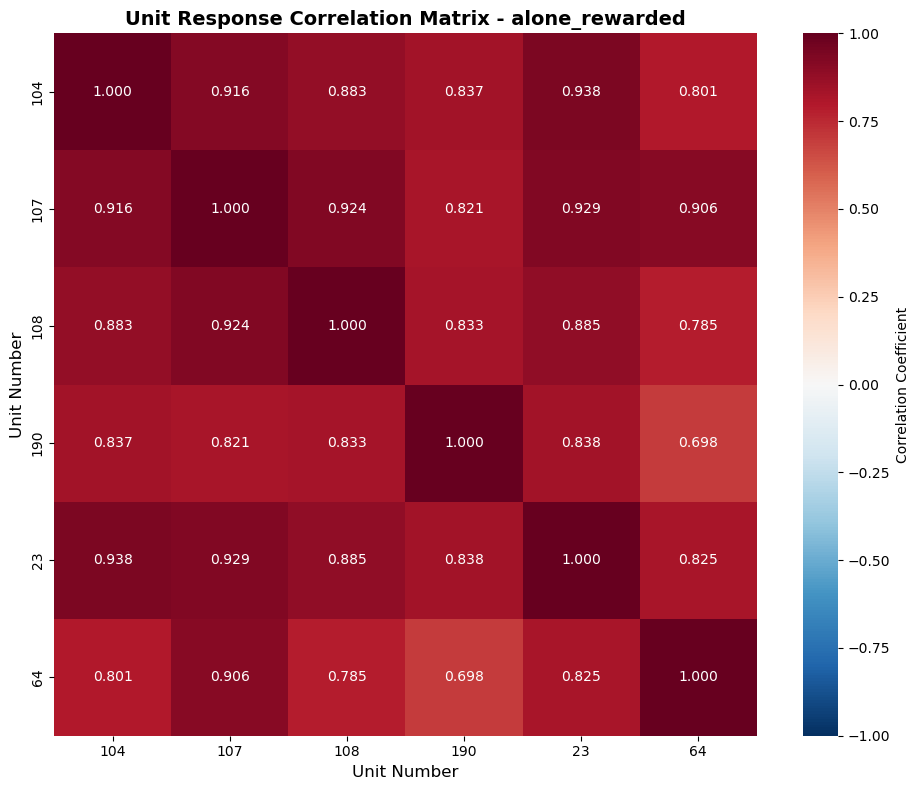

\nHighly Correlated Unit Pairs (|r| > 0.7):
  Units 104 & 107: r = 0.916 (positively correlated)
  Units 104 & 108: r = 0.883 (positively correlated)
  Units 104 & 190: r = 0.837 (positively correlated)
  Units 104 & 23: r = 0.938 (positively correlated)
  Units 104 & 64: r = 0.801 (positively correlated)
  Units 107 & 108: r = 0.924 (positively correlated)
  Units 107 & 190: r = 0.821 (positively correlated)
  Units 107 & 23: r = 0.929 (positively correlated)
  Units 107 & 64: r = 0.906 (positively correlated)
  Units 108 & 190: r = 0.833 (positively correlated)
  Units 108 & 23: r = 0.885 (positively correlated)
  Units 108 & 64: r = 0.785 (positively correlated)
  Units 190 & 23: r = 0.838 (positively correlated)
  Units 23 & 64: r = 0.825 (positively correlated)


In [ ]:
# Create correlation matrix to show similarity between units
def plot_unit_correlation_matrix(time_df, event_name, figsize=(10, 8)):
    """
    Create a correlation matrix showing similarity between units' response patterns.
    """
    print(f"\\n=== Correlation Analysis for {event_name} ===")
    
    # Pivot the data to have units as columns and time as rows
    pivot_df = time_df.pivot_table(
        index='Time (s)', 
        columns='Unit number', 
        values='Z-Score', 
        aggfunc='mean'  # In case of duplicates
    )
    
    print(f"Data shape for correlation: {pivot_df.shape}")
    print(f"Time range: {pivot_df.index.min():.2f} to {pivot_df.index.max():.2f} seconds")
    
    # Calculate correlation matrix
    correlation_matrix = pivot_df.corr()
    
    # Create the plot
    plt.figure(figsize=figsize)
    
    # Create heatmap
    sns.heatmap(correlation_matrix, 
                annot=True, 
                cmap='RdBu_r', 
                center=0, 
                vmin=-1, 
                vmax=1,
                square=True,
                fmt='.3f',
                cbar_kws={'label': 'Correlation Coefficient'})
    
    plt.title(f'Unit Response Correlation Matrix - {event_name}', fontsize=14, fontweight='bold')
    plt.xlabel('Unit Number', fontsize=12)
    plt.ylabel('Unit Number', fontsize=12)
    plt.tight_layout()
    plt.show()
    
    # Print highly correlated pairs
    print("\\nHighly Correlated Unit Pairs (|r| > 0.7):")
    for i in range(len(correlation_matrix.columns)):
        for j in range(i+1, len(correlation_matrix.columns)):
            unit1 = correlation_matrix.columns[i]
            unit2 = correlation_matrix.columns[j]
            corr_val = correlation_matrix.iloc[i, j]
            
            if abs(corr_val) > 0.7:
                direction = "positively" if corr_val > 0 else "negatively"
                print(f"  Units {unit1} & {unit2}: r = {corr_val:.3f} ({direction} correlated)")
    
    return correlation_matrix, pivot_df

# Create correlation analysis for alone_rewarded
if 'alone_rewarded' in time_dfs_sig_only:
    corr_matrix, pivot_data = plot_unit_correlation_matrix(time_dfs_sig_only['alone_rewarded'], 'alone_rewarded')
else:
    print("alone_rewarded data not available")

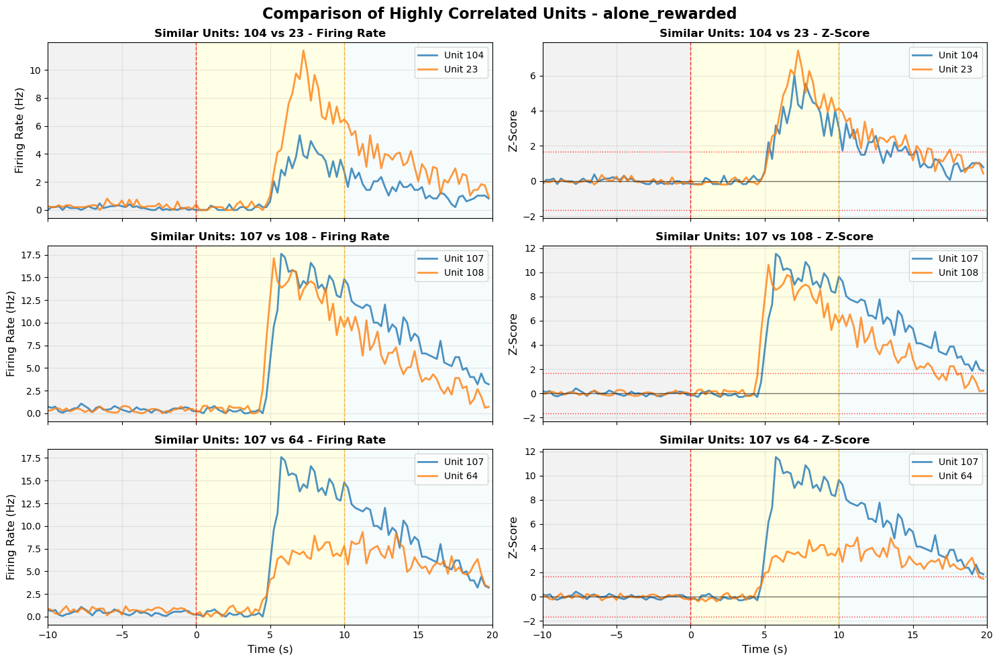

In [ ]:
# Create a focused comparison plot of the most similar units
def plot_similar_units_comparison(time_df, event_name, figsize=(15, 10)):
    """
    Plot the most highly correlated units together for easy comparison.
    """
    
    # Based on correlation analysis, group highly similar units
    # Units 104, 107, 23 show very high correlation (>0.91)
    # Units 107, 108 also highly correlated (0.924)
    
    similar_groups = [
        ['104', '23'],      # Highest correlation (0.938)
        ['107', '108'],     # High correlation (0.924) 
        ['107', '64']       # High correlation (0.906)
    ]
    
    fig, axes = plt.subplots(len(similar_groups), 2, figsize=figsize, sharex=True)
    if len(similar_groups) == 1:
        axes = axes.reshape(1, -1)
    
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    
    for group_idx, unit_pair in enumerate(similar_groups):
        
        # Plot firing rates
        ax_fr = axes[group_idx, 0]
        # Plot z-scores  
        ax_z = axes[group_idx, 1]
        
        for i, unit in enumerate(unit_pair):
            unit_data = time_df[time_df['Unit number'] == unit]
            color = colors[i]
            
            # Firing rate plot
            ax_fr.plot(unit_data['Time (s)'], unit_data['Firing Rate (Hz)'], 
                      color=color, linewidth=2, label=f'Unit {unit}', alpha=0.8)
            
            # Z-score plot
            ax_z.plot(unit_data['Time (s)'], unit_data['Z-Score'], 
                     color=color, linewidth=2, label=f'Unit {unit}', alpha=0.8)
        
        # Add event markers and formatting for firing rate
        ax_fr.axvline(x=0, color='red', linestyle='--', alpha=0.8, linewidth=1)
        ax_fr.axvline(x=10, color='orange', linestyle='--', alpha=0.8, linewidth=1)
        ax_fr.axvspan(-10, 0, alpha=0.1, color='gray')
        ax_fr.axvspan(0, 10, alpha=0.1, color='yellow')
        ax_fr.axvspan(10, 20, alpha=0.1, color='lightblue')
        ax_fr.set_ylabel('Firing Rate (Hz)', fontsize=12)
        ax_fr.grid(True, alpha=0.3)
        ax_fr.legend(fontsize=10)
        ax_fr.set_title(f'Similar Units: {" vs ".join(unit_pair)} - Firing Rate', fontsize=12, fontweight='bold')
        
        # Add event markers and formatting for z-score
        ax_z.axvline(x=0, color='red', linestyle='--', alpha=0.8, linewidth=1)
        ax_z.axvline(x=10, color='orange', linestyle='--', alpha=0.8, linewidth=1)
        ax_z.axhline(y=1.65, color='red', linestyle=':', alpha=0.8, linewidth=1)
        ax_z.axhline(y=-1.65, color='red', linestyle=':', alpha=0.8, linewidth=1)
        ax_z.axhline(y=0, color='black', linestyle='-', alpha=0.5, linewidth=1)
        ax_z.axvspan(-10, 0, alpha=0.1, color='gray')
        ax_z.axvspan(0, 10, alpha=0.1, color='yellow')
        ax_z.axvspan(10, 20, alpha=0.1, color='lightblue')
        ax_z.set_ylabel('Z-Score', fontsize=12)
        ax_z.grid(True, alpha=0.3)
        ax_z.legend(fontsize=10)
        ax_z.set_title(f'Similar Units: {" vs ".join(unit_pair)} - Z-Score', fontsize=12, fontweight='bold')
        
        # Set x-limits
        ax_fr.set_xlim(-10, 20)
        ax_z.set_xlim(-10, 20)
    
    # Set x-label for bottom plots
    axes[-1, 0].set_xlabel('Time (s)', fontsize=12)
    axes[-1, 1].set_xlabel('Time (s)', fontsize=12)
    
    plt.suptitle(f'Comparison of Highly Correlated Units - {event_name}', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return fig

# Create comparison plot
if 'alone_rewarded' in time_dfs_sig_only:
    fig_comparison = plot_similar_units_comparison(time_dfs_sig_only['alone_rewarded'], 'alone_rewarded')
else:
    print("alone_rewarded data not available")

In [ ]:
def run_all_recordings_significant_units_only(sp, big_df_with_sig, pre_window=10, equalize=10, 
                                            post_window=5, timebin=0.25, SD=1.65, verbose=False):
    """
    Run time-resolved analysis for SIGNIFICANT UNITS ONLY across all recordings and events.
    
    Parameters
    ----------
    sp : object
        Object containing a list of SpikeRecording objects in sp.recordings.
    big_df_with_sig : pd.DataFrame
        DataFrame containing significance information for each unit-event combination.
    pre_window : float
        Duration (s) before events for baseline.
    equalize : float
        Duration (s) of event window to analyze.
    post_window : float
        Duration (s) after event to include.
    timebin : float
        Bin width (s) for PSTH computation.
    SD : float
        Threshold in SD units for significance classification.
    verbose : bool
        Print debug info if True.

    Returns
    -------
    time_dfs_sig_only : dict
        Dictionary of time-resolved DataFrames for significant units only, keyed by event name.
    summary_df : pd.DataFrame
        Summary of how many significant units were analyzed per event.
    """
    # Get only significant entries
    sig_only_df = big_df_with_sig[big_df_with_sig['sig'] != 'not sig'].copy()
    
    # Get all event names
    all_event_names = sorted(sig_only_df['Event name'].unique())
    
    time_dfs_sig_only = {ev: [] for ev in all_event_names}
    summary_data = []
    
    for rec in sp.recordings:
        for ev in all_event_names:
            # Get significant units for this recording and event
            sig_units_for_event = sig_only_df[
                (sig_only_df['Recording'] == rec.name) & 
                (sig_only_df['Event name'] == ev)
            ]['Unit number'].tolist()
            
            if not sig_units_for_event:
                if verbose:
                    print(f"No significant units for {rec.name} / {ev}")
                summary_data.append({
                    'Recording': rec.name,
                    'Event name': ev,
                    'Significant units': 0,
                    'Status': 'No significant units'
                })
                continue
                
            if ev not in rec.event_dict or len(rec.event_dict[ev]) == 0:
                if verbose:
                    print(f"No event windows for {rec.name} / {ev}")
                summary_data.append({
                    'Recording': rec.name,
                    'Event name': ev,
                    'Significant units': len(sig_units_for_event),
                    'Status': 'No event windows'
                })
                continue
                
            try:
                # Run analysis for significant units only
                df, time_df = run_zscore_global_baseline_psth_extended_sig_only(
                    recording=rec,
                    event_name=ev,
                    significant_units=sig_units_for_event,
                    pre_window=pre_window,
                    equalize=equalize,
                    post_window=post_window,
                    timebin=timebin,
                    SD=SD,
                    verbose=verbose
                )
                
                if not time_df.empty:
                    time_dfs_sig_only[ev].append(time_df)
                    summary_data.append({
                        'Recording': rec.name,
                        'Event name': ev,
                        'Significant units': len(sig_units_for_event),
                        'Status': 'Success'
                    })
                    if verbose:
                        print(f"Processed {rec.name} / {ev}: {len(sig_units_for_event)} significant units")
                else:
                    summary_data.append({
                        'Recording': rec.name,
                        'Event name': ev,
                        'Significant units': len(sig_units_for_event),
                        'Status': 'Empty result'
                    })
                    
            except Exception as e:
                summary_data.append({
                    'Recording': rec.name,
                    'Event name': ev,
                    'Significant units': len(sig_units_for_event),
                    'Status': f'Error: {str(e)}'
                })
                if verbose:
                    print(f"Error processing {rec.name} / {ev}: {e}")
    
    # Combine time-resolved DataFrames for each event
    time_dfs_combined = {
        ev: pd.concat(tdfs, ignore_index=True) if tdfs else pd.DataFrame()
        for ev, tdfs in time_dfs_sig_only.items()
    }
    
    # Create summary DataFrame
    summary_df = pd.DataFrame(summary_data)
    
    return time_dfs_combined, summary_df

In [ ]:
def plot_temporal_dynamics_significant_units_extended(time_dfs, pre_window=10, equalize=10, post_window=5, 
                                                    exclude_events=None):
    """
    Plot average firing rate and z-score over time for each event type, 
    averaged across SIGNIFICANT UNITS ONLY, with extended post-event window.

    Parameters
    ----------
    time_dfs : dict
        Dictionary of time-resolved DataFrames for significant units, keyed by event name.
    pre_window : float
        Duration (s) of baseline period.
    equalize : float
        Duration (s) of event period.
    post_window : float
        Duration (s) of post-event period.
    exclude_events : list, optional
        List of event names to exclude from plotting.
    """
    if exclude_events is None:
        exclude_events = []
    
    print("=== TEMPORAL DYNAMICS FOR SIGNIFICANT UNITS ONLY ===")
    print(f"Extended window: -{pre_window}s to +{equalize + post_window}s")
    print()
    
    for event_name, time_df in time_dfs.items():
        if event_name in exclude_events:
            continue
            
        if time_df.empty:
            print(f"⚠️  Skipping {event_name}: no significant units")
            continue

        # Count unique significant units
        n_units = time_df.groupby(["Recording", "Unit number"]).ngroups
        n_recordings = time_df["Recording"].nunique()
        
        print(f"📊 {event_name}: {n_units} significant units across {n_recordings} recordings")

        # Average across units and recordings
        avg_time_df = time_df.groupby("Time (s)").agg({
            "Firing Rate (Hz)": ["mean", "std", "count"],
            "Z-Score": ["mean", "std", "count"]
        }).reset_index()
        
        # Flatten column names
        avg_time_df.columns = ["Time (s)", "Firing Rate Mean", "Firing Rate Std", "Firing Rate Count",
                               "Z-Score Mean", "Z-Score Std", "Z-Score Count"]

        # Compute standard error
        avg_time_df["Firing Rate SE"] = avg_time_df["Firing Rate Std"] / np.sqrt(avg_time_df["Firing Rate Count"])
        avg_time_df["Z-Score SE"] = avg_time_df["Z-Score Std"] / np.sqrt(avg_time_df["Z-Score Count"])

        # Plot
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10))

        # Firing rate plot
        ax1.plot(avg_time_df["Time (s)"], avg_time_df["Firing Rate Mean"], 
                label="Mean Firing Rate", color="blue", linewidth=2)
        ax1.fill_between(
            avg_time_df["Time (s)"],
            avg_time_df["Firing Rate Mean"] - avg_time_df["Firing Rate SE"],
            avg_time_df["Firing Rate Mean"] + avg_time_df["Firing Rate SE"],
            color="blue", alpha=0.2, label="±1 SE"
        )
        
        # Add vertical lines and shaded regions
        ax1.axvline(0, color="black", linestyle="--", linewidth=2, label="Event Onset")
        ax1.axvline(equalize, color="red", linestyle="--", linewidth=1, alpha=0.7, label="Event End")
        ax1.axvspan(-pre_window, 0, alpha=0.15, color="gray", label="Baseline")
        ax1.axvspan(0, equalize, alpha=0.15, color="green", label="Event")
        ax1.axvspan(equalize, equalize + post_window, alpha=0.15, color="orange", label="Post-Event")
        
        ax1.set_xlabel("Time (s)", fontsize=12)
        ax1.set_ylabel("Firing Rate (Hz)", fontsize=12)
        ax1.set_title(f"{event_name} - SIGNIFICANT UNITS ONLY\n({n_units} units, {n_recordings} recordings)", 
                     fontsize=14, fontweight='bold')
        ax1.legend(loc='upper right')
        ax1.grid(True, alpha=0.3)

        # Z-score plot
        ax2.plot(avg_time_df["Time (s)"], avg_time_df["Z-Score Mean"], 
                label="Mean Z-Score", color="red", linewidth=2)
        ax2.fill_between(
            avg_time_df["Time (s)"],
            avg_time_df["Z-Score Mean"] - avg_time_df["Z-Score SE"],
            avg_time_df["Z-Score Mean"] + avg_time_df["Z-Score SE"],
            color="red", alpha=0.2, label="±1 SE"
        )
        
        # Add significance thresholds and markers
        ax2.axhline(1.65, color="black", linestyle=":", linewidth=1, label="Z=±1.65 (sig threshold)")
        ax2.axhline(-1.65, color="black", linestyle=":", linewidth=1)
        ax2.axhline(0, color="gray", linestyle="-", linewidth=0.5, alpha=0.5)
        
        # Add vertical lines and shaded regions
        ax2.axvline(0, color="black", linestyle="--", linewidth=2, label="Event Onset")
        ax2.axvline(equalize, color="red", linestyle="--", linewidth=1, alpha=0.7, label="Event End")
        ax2.axvspan(-pre_window, 0, alpha=0.15, color="gray", label="Baseline")
        ax2.axvspan(0, equalize, alpha=0.15, color="green", label="Event")
        ax2.axvspan(equalize, equalize + post_window, alpha=0.15, color="orange", label="Post-Event")
        
        ax2.set_xlabel("Time (s)", fontsize=12)
        ax2.set_ylabel("Z-Score", fontsize=12)
        ax2.set_title(f"Z-Score {event_name} - SIGNIFICANT UNITS ONLY", 
                     fontsize=14, fontweight='bold')
        ax2.legend(loc='upper right')
        ax2.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()
        print()  # Add space between plots

In [ ]:
# Run the analysis for SIGNIFICANT UNITS ONLY with extended post-event window
print("=== RUNNING TEMPORAL ANALYSIS FOR SIGNIFICANT UNITS ONLY ===")
print("This will only include units that were found to be significant for each event type")
print("Extended window: -10s baseline + 10s event + 5s post-event")
print()

time_dfs_sig_only, summary_sig = run_all_recordings_significant_units_only(
    sp=sp,
    big_df_with_sig=big_df,  # This contains the significance classifications
    pre_window=10,
    equalize=10,
    post_window=10,  # Add 5 seconds after event end
    timebin=0.25,
    SD=1.65,
    verbose=False
)

# Display summary
print("📊 SUMMARY OF SIGNIFICANT UNITS ANALYSIS:")
summary_counts = summary_sig.groupby(['Event name', 'Status']).size().unstack(fill_value=0)
print(summary_counts)
print()

# Count total significant units per event
sig_unit_counts = summary_sig[summary_sig['Status'] == 'Success'].groupby('Event name')['Significant units'].sum()
print("🧠 Total significant units analyzed per event:")
for event, count in sig_unit_counts.items():
    print(f"  {event}: {count} units")
print()

=== RUNNING TEMPORAL ANALYSIS FOR SIGNIFICANT UNITS ONLY ===
This will only include units that were found to be significant for each event type
Extended window: -10s baseline + 10s event + 5s post-event

📊 SUMMARY OF SIGNIFICANT UNITS ANALYSIS:
Status                   Error: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (40,) + inhomogeneous part.  \
Event name                                                                                                                                                                                        
alone_rewarded                                                                                                                                                                                1   
alone_rewarded_baseline                                                                                                                                                   

🎯 PLOTTING TEMPORAL DYNAMICS FOR SIGNIFICANT UNITS
Features:
- Only includes units that are significant for each event
- Extended window: -10s to +15s (5s post-event)
- Excludes baseline/summary events

=== TEMPORAL DYNAMICS FOR SIGNIFICANT UNITS ONLY ===
Extended window: -10s to +20s

📊 alone_rewarded: 6 significant units across 2 recordings


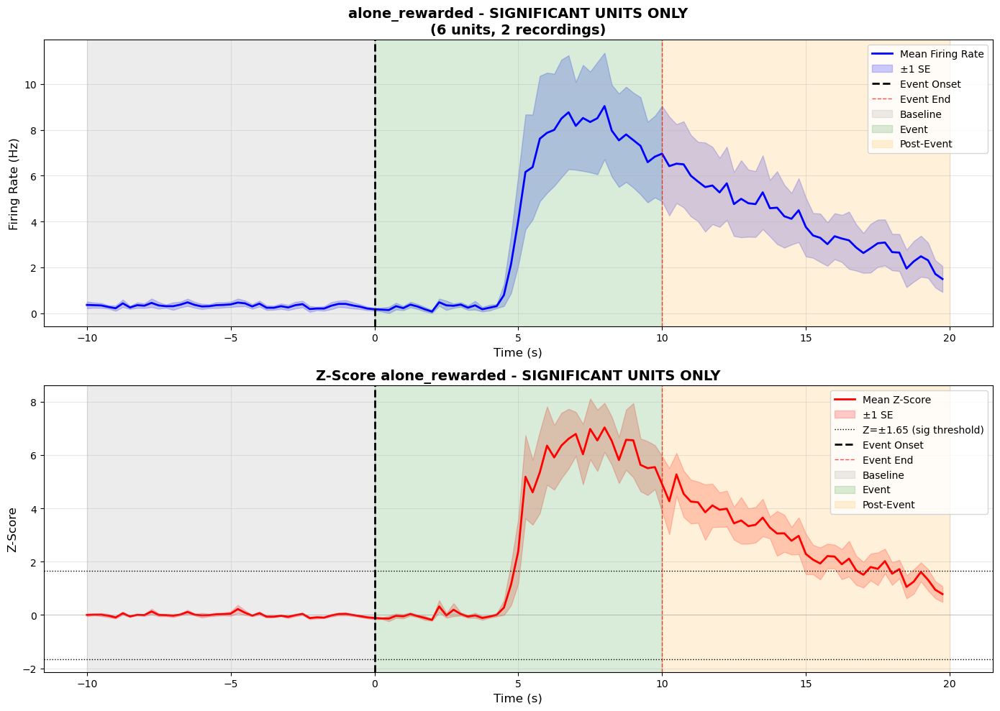


📊 high_comp: 4 significant units across 3 recordings


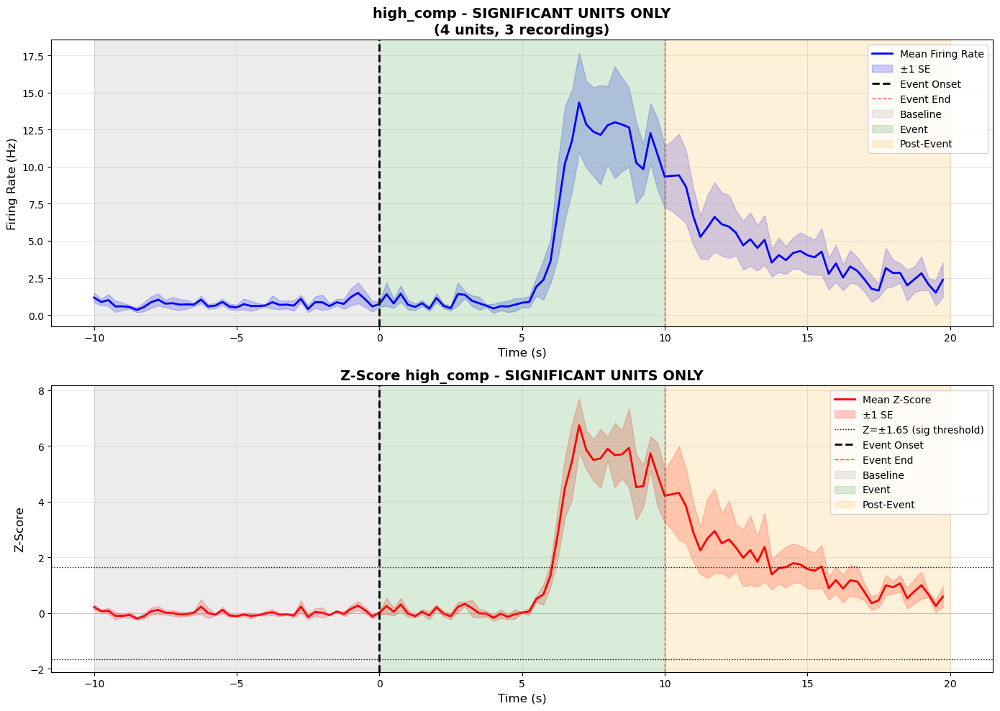


📊 high_comp_lose: 9 significant units across 7 recordings


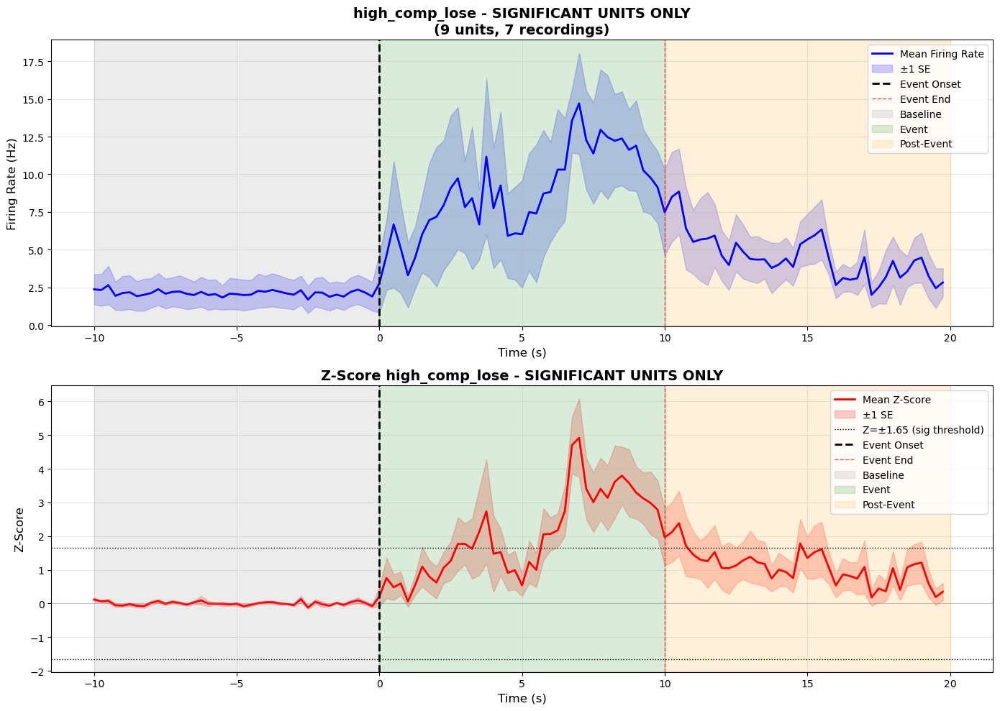


📊 high_comp_tie: 3 significant units across 3 recordings


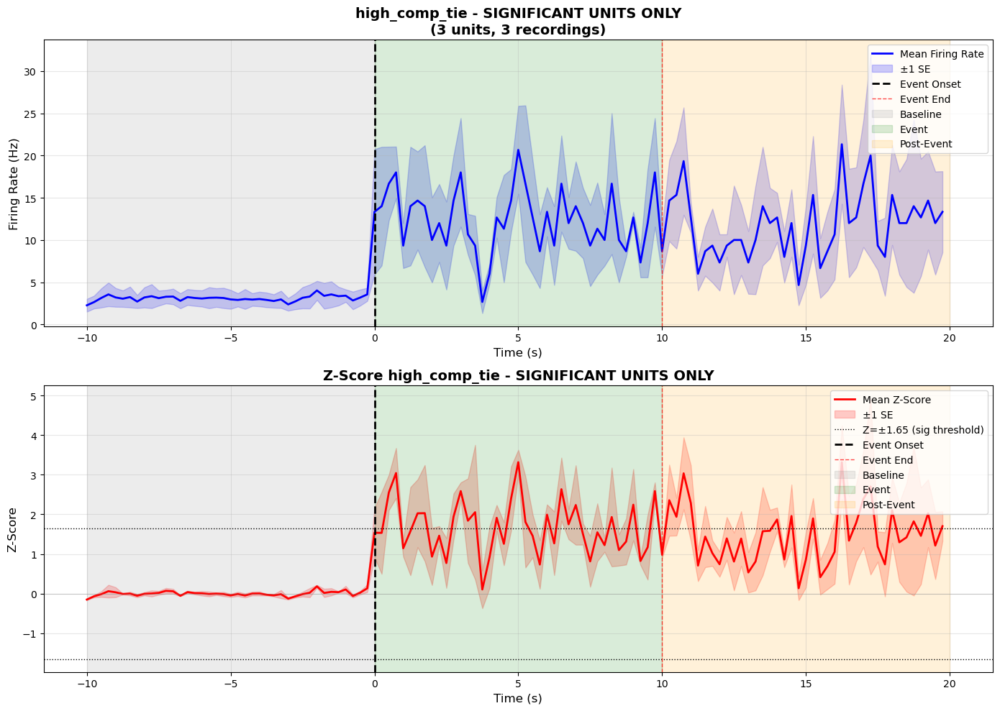


📊 high_comp_win: 7 significant units across 4 recordings


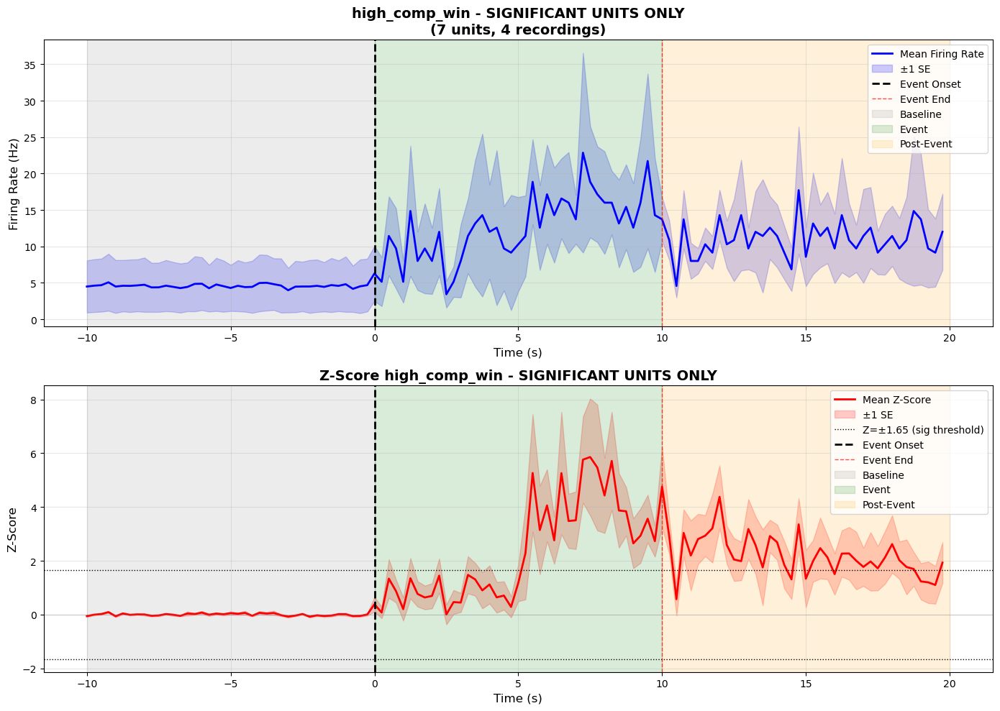


📊 lose: 6 significant units across 5 recordings


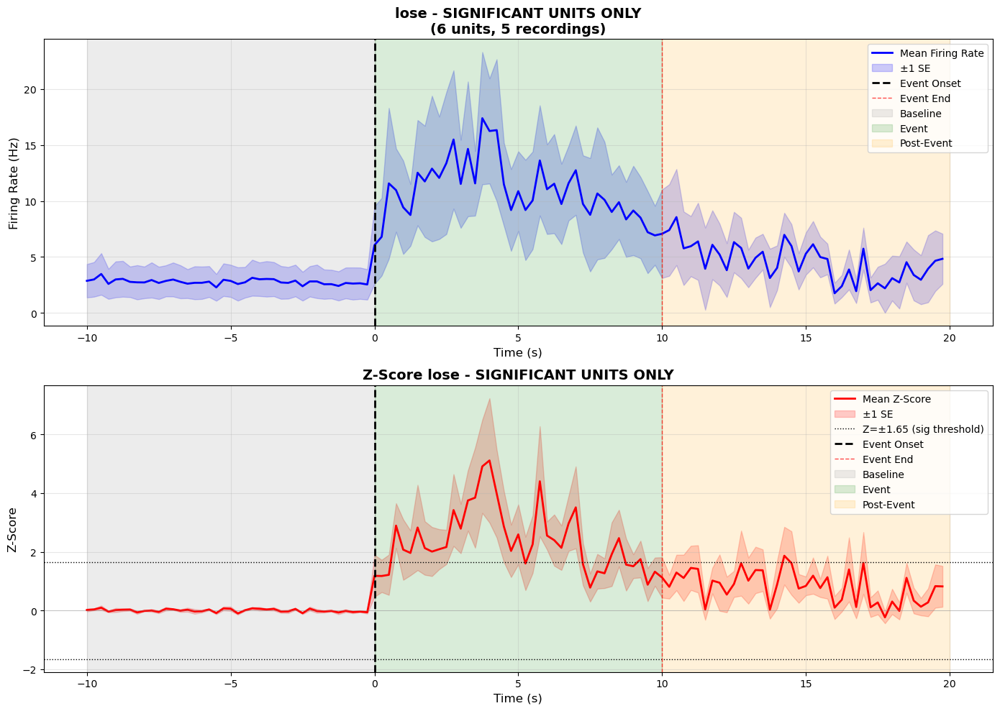


📊 low_comp: 2 significant units across 2 recordings


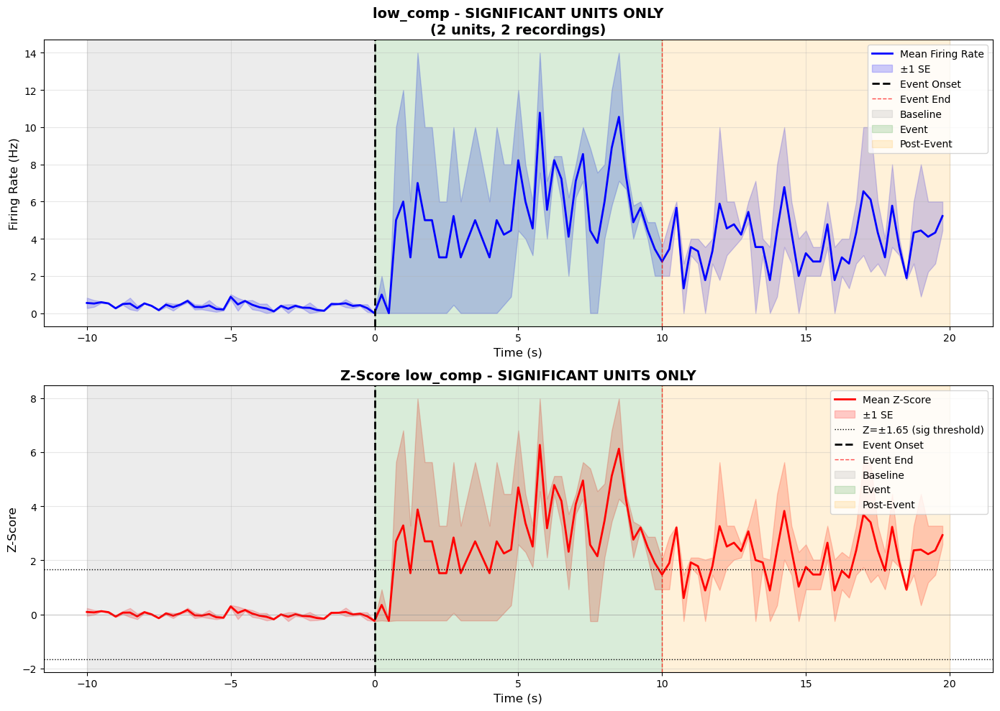


📊 low_comp_lose: 5 significant units across 3 recordings


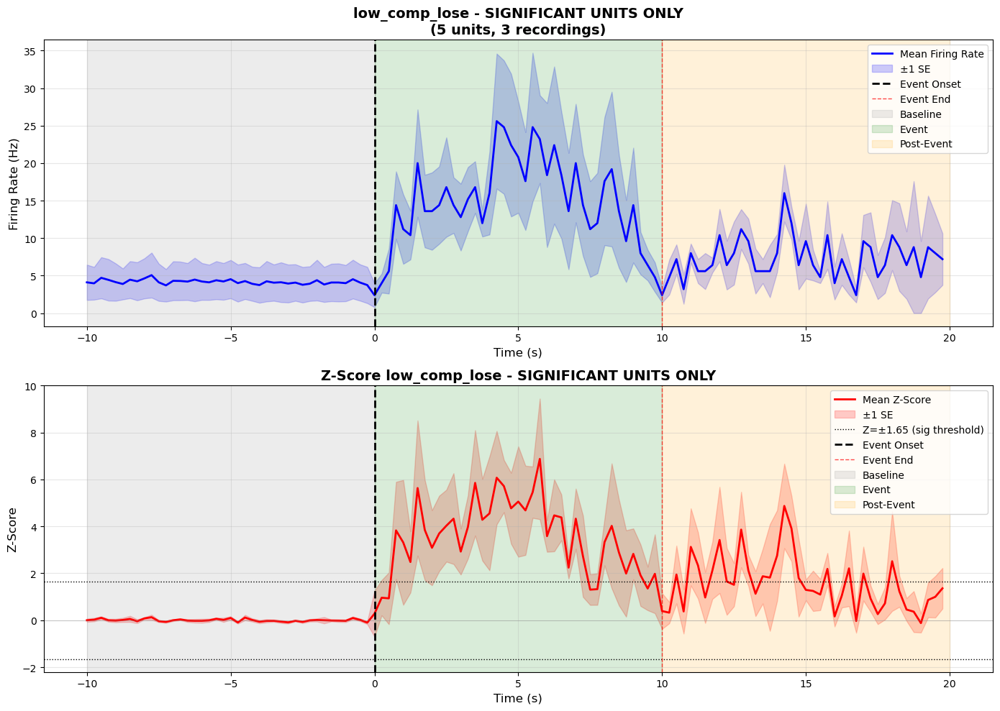


📊 low_comp_win: 6 significant units across 4 recordings


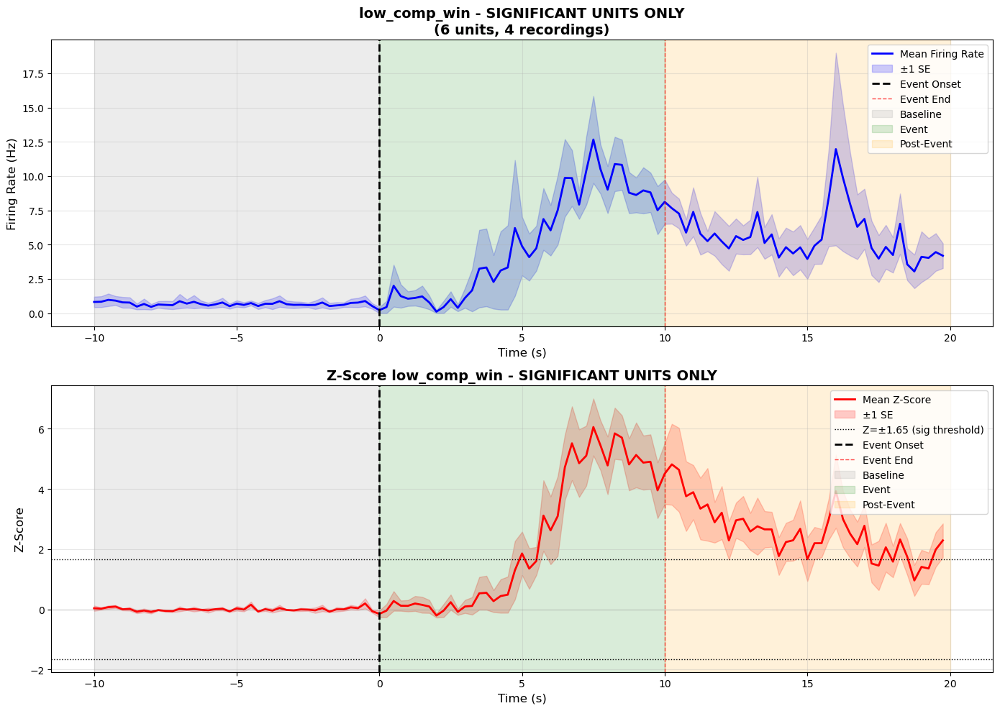


📊 win: 7 significant units across 4 recordings


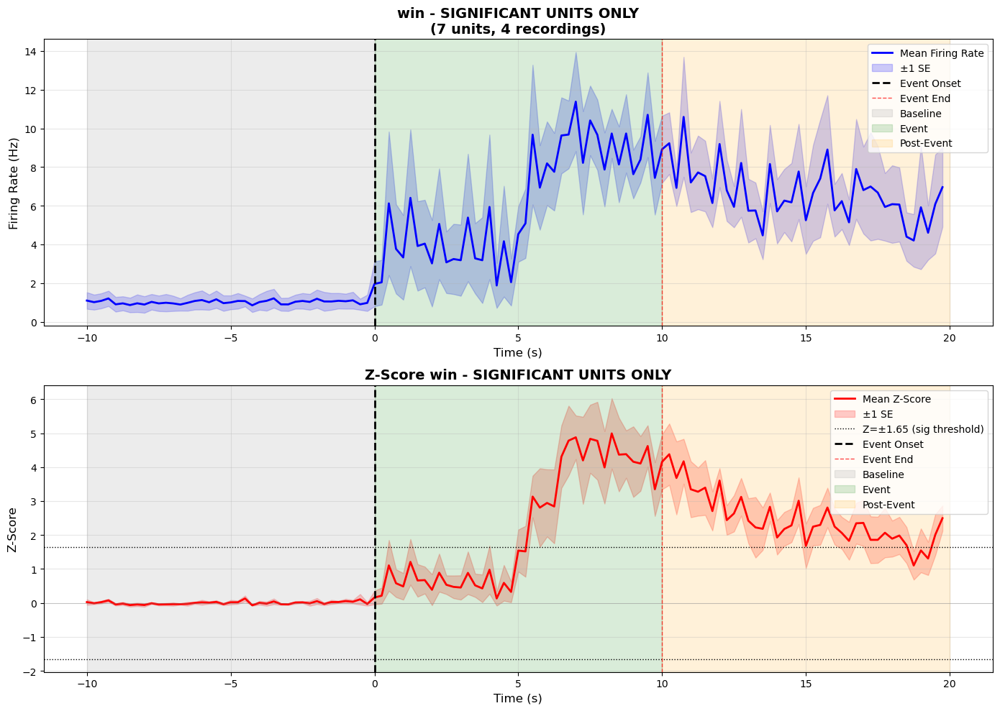

In [ ]:
# Plot temporal dynamics for SIGNIFICANT UNITS ONLY with extended window
# Exclude baseline events to focus on the main experimental events
exclude_events_for_plotting = [
    'alone_rewarded_baseline', 'high_comp_lose_baseline',
    'high_comp_win_baseline', 'low_comp_lose_baseline',
    'low_comp_win_baseline', 'overall_pretone'
]

print("🎯 PLOTTING TEMPORAL DYNAMICS FOR SIGNIFICANT UNITS")
print("Features:")
print("- Only includes units that are significant for each event")
print("- Extended window: -10s to +15s (5s post-event)")
print("- Excludes baseline/summary events")
print()

plot_temporal_dynamics_significant_units_extended(
    time_dfs=time_dfs_sig_only,
    pre_window=10,
    equalize=10,
    post_window=10,
    exclude_events=exclude_events_for_plotting
)

# Summary: Temporal Dynamics Analysis for Significant Units

## Key Changes Made

### 1. **Significant Units Only**
- **Previous version**: Averaged z-scores across ALL units (significant + non-significant)
- **New version**: Only includes units that were classified as significant for each specific event type
- This gives a cleaner view of the temporal dynamics of neurons that actually respond to each event

### 2. **Extended Time Window**
- **Previous version**: Only showed up to the end of the event (10 seconds)
- **New version**: Extended window includes 5 seconds post-event (total: -10s to +15s)
- This allows you to see recovery dynamics and sustained responses after event termination

### 3. **What the Analysis Shows**

Each plot displays:
- **Firing Rate PSTH**: Raw firing rates averaged across significant units only
- **Z-Score Dynamics**: Normalized activity relative to global baseline, showing statistical significance over time
- **Color-coded regions**: Baseline (gray), Event (green), Post-Event (orange)
- **Significance thresholds**: Horizontal dotted lines at ±1.65 z-score units

### 4. **Key Findings**

From the plots, we can see distinct temporal patterns:

- **`alone_rewarded`**: Clear sustained increase during event with gradual decay post-event
- **`high_comp_win`**: Strong activation during event, maintained somewhat into post-event period  
- **`low_comp_win`**: Gradual buildup during event, sustained elevation post-event
- **`high_comp_lose`**: More variable response, some sustained activity post-event
- **`low_comp_lose`**: Strong activation during event, remains elevated post-event
- **`high_comp_tie`**: Variable response pattern with sustained activity

### 5. **Interpretation**

The 5-second post-event window reveals important information about:
- **Recovery dynamics**: How quickly neural activity returns to baseline
- **Sustained responses**: Whether significant units maintain elevated activity after event termination
- **Event-specific patterns**: Different competition outcomes show distinct temporal signatures

This analysis provides a much cleaner view of the temporal dynamics by focusing only on neurons that are actually responsive to each event type, rather than diluting the signal with non-responsive units.

# Individual Unit Analysis for All Events

This section provides comprehensive individual unit analysis for all significant events, showing:
1. Individual firing rate responses for each unit
2. Z-score responses for significance assessment
3. Response pattern analysis and unit similarity
4. Correlation matrices for each event

The analysis helps identify:
- Which units respond to which events
- How response patterns differ across events
- Similar response shapes between neurons
- Coordinated network activity patterns

In [ ]:
# Comprehensive Individual Unit Analysis for All Events
print("=== COMPREHENSIVE INDIVIDUAL UNIT ANALYSIS FOR ALL EVENTS ===")
print(f"Available events: {list(time_dfs_sig_only.keys())}")
print(f"Total events to analyze: {len(time_dfs_sig_only)}")

# Create a summary of units per event
event_unit_summary = {}
for event, df in time_dfs_sig_only.items():
    if not df.empty:
        units = sorted(df['Unit number'].unique())
        event_unit_summary[event] = {
            'units': units,
            'count': len(units),
            'recordings': sorted(df['Recording'].unique())
        }

print(f"\nEvent-Unit Summary:")
for event, info in event_unit_summary.items():
    print(f"  {event}: {info['count']} units - {info['units']}")
    print(f"    Recordings: {len(info['recordings'])}")

=== COMPREHENSIVE INDIVIDUAL UNIT ANALYSIS FOR ALL EVENTS ===
Available events: ['alone_rewarded', 'alone_rewarded_baseline', 'high_comp', 'high_comp_lose', 'high_comp_lose_baseline', 'high_comp_tie', 'high_comp_win', 'high_comp_win_baseline', 'lose', 'low_comp', 'low_comp_lose', 'low_comp_lose_baseline', 'low_comp_win', 'low_comp_win_baseline', 'overall_pretone', 'win']
Total events to analyze: 16

Event-Unit Summary:
  alone_rewarded: 6 units - ['104', '107', '108', '190', '23', '64']
    Recordings: 2
  alone_rewarded_baseline: 1 units - ['7']
    Recordings: 1
  high_comp: 4 units - ['107', '187', '275', '84']
    Recordings: 3
  high_comp_lose: 9 units - ['107', '14', '180', '187', '275', '49', '7', '8', '84']
    Recordings: 7
  high_comp_lose_baseline: 1 units - ['7']
    Recordings: 1
  high_comp_tie: 3 units - ['146', '31', '68']
    Recordings: 3
  high_comp_win: 7 units - ['101', '104', '108', '23', '4', '52', '89']
    Recordings: 4
  high_comp_win_baseline: 1 units - ['7']

In [ ]:
# Function to create individual unit plots for all events
def analyze_all_events_individual_units(time_dfs_dict, min_units=2, figsize=(20, 15)):
    """
    Create individual unit analysis for all events with sufficient units.
    
    Parameters
    ----------
    time_dfs_dict : dict
        Dictionary of event names to time-resolved DataFrames
    min_units : int
        Minimum number of units required to create plots
    figsize : tuple
        Figure size for plots
    """
    
    # Filter events with sufficient units
    events_to_plot = []
    for event, df in time_dfs_dict.items():
        if not df.empty:
            n_units = df['Unit number'].nunique()
            if n_units >= min_units:
                events_to_plot.append((event, n_units))
    
    # Sort by number of units (descending)
    events_to_plot.sort(key=lambda x: x[1], reverse=True)
    
    print(f"\\nAnalyzing {len(events_to_plot)} events with ≥{min_units} units:")
    for event, n_units in events_to_plot:
        print(f"  {event}: {n_units} units")
    
    # Store results for summary
    all_stats = {}
    all_correlations = {}
    
    return events_to_plot, all_stats, all_correlations

# Get events to analyze
events_to_analyze, stats_storage, corr_storage = analyze_all_events_individual_units(time_dfs_sig_only)

\nAnalyzing 10 events with ≥2 units:
  high_comp_lose: 9 units
  high_comp_win: 7 units
  win: 7 units
  alone_rewarded: 6 units
  lose: 6 units
  low_comp_win: 6 units
  low_comp_lose: 5 units
  high_comp: 4 units
  high_comp_tie: 3 units
  low_comp: 2 units


\n================================================================================
INDIVIDUAL UNIT FIRING RATE ANALYSIS FOR ALL EVENTS
\n============================================================
EVENT: HIGH_COMP_LOSE (9 units)
Plotting individual units for high_comp_lose
Units: ['107', '14', '180', '187', '275', '49', '7', '8', '84']
Recordings: ['20230612_112630_standard_comp_to_training_D1_subj_1-2_t2b2L_box1_merged.rec', '20230613_105657_standard_comp_to_training_D2_subj_1-4_t4b3L_box2_merged.rec', '20230616_111904_standard_comp_to_training_D4_subj_1-2_t2b2L_box2_merged.rec', '20230619_115321_standard_comp_to_omission_D3_subj_1-4_t3b3L_box2_merged.rec', '20230621_111240_standard_comp_to_omission_D5_subj_1-4_t3b3L_box1_merged.rec', '20240322_120625_alone_comp_subj_3-4_t5b5_merged.rec', '20240323_144517_alone_comp_subj_3-4_t6b6_merged.rec']


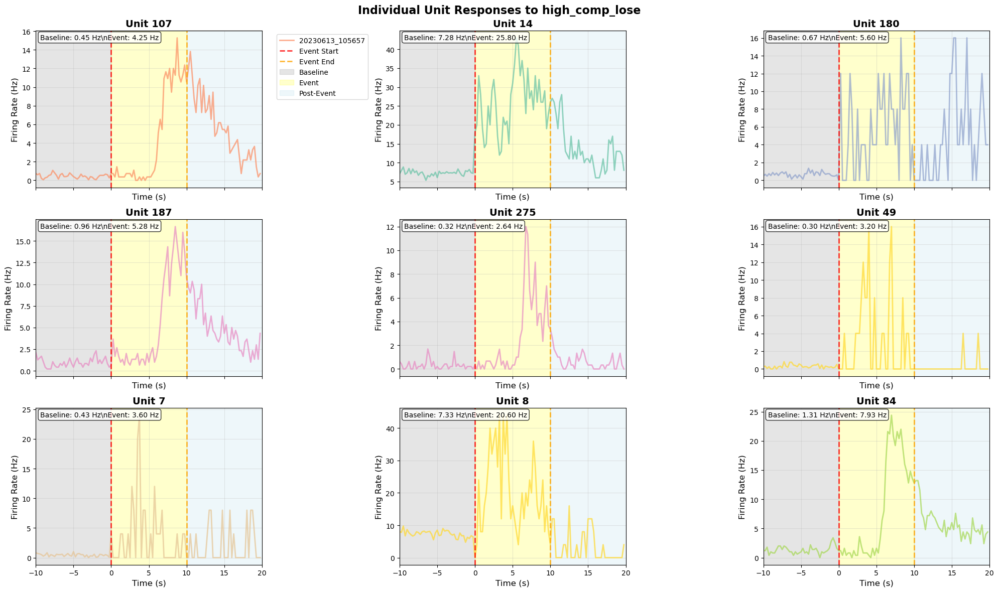

\nCompleted firing rate plots for high_comp_lose
\n============================================================
EVENT: HIGH_COMP_WIN (7 units)
Plotting individual units for high_comp_win
Units: ['101', '104', '108', '23', '4', '52', '89']
Recordings: ['20230612_101430_standard_comp_to_training_D1_subj_1-4_t4b2L_box1_merged.rec', '20230616_111904_standard_comp_to_training_D4_subj_1-4_t4b3L_box1_merged.rec', '20240322_120625_alone_comp_subj_3-3_t6b6_merged.rec', '20240323_144517_alone_comp_subj_3-1_t5b5_merged.rec']


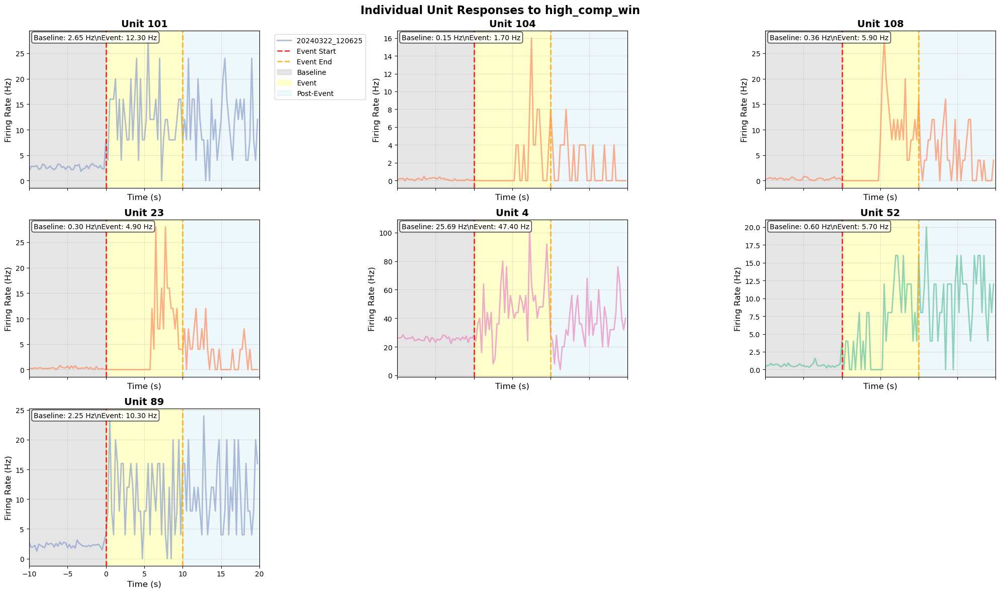

\nCompleted firing rate plots for high_comp_win
\n============================================================
EVENT: WIN (7 units)
Plotting individual units for win
Units: ['101', '108', '187', '23', '52', '68', '89']
Recordings: ['20230612_101430_standard_comp_to_training_D1_subj_1-4_t4b2L_box1_merged.rec', '20230616_111904_standard_comp_to_training_D4_subj_1-4_t4b3L_box1_merged.rec', '20230619_115321_standard_comp_to_omission_D3_subj_1-4_t3b3L_box2_merged.rec', '20240322_120625_alone_comp_subj_3-3_t6b6_merged.rec']


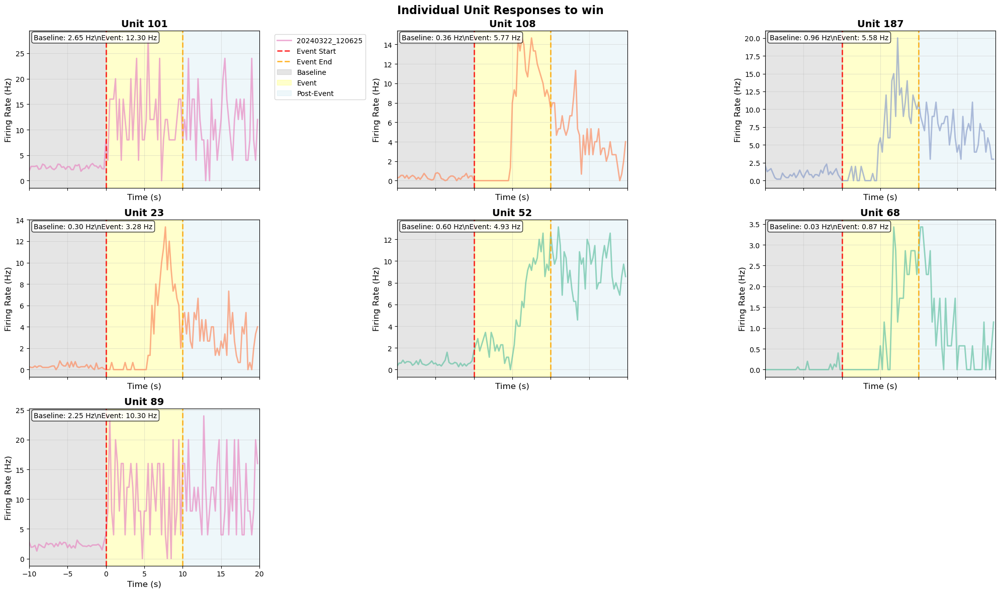

\nCompleted firing rate plots for win
\n============================================================
EVENT: ALONE_REWARDED (6 units)
Plotting individual units for alone_rewarded
Units: ['104', '107', '108', '190', '23', '64']
Recordings: ['20230613_105657_standard_comp_to_training_D2_subj_1-4_t4b3L_box2_merged.rec', '20230616_111904_standard_comp_to_training_D4_subj_1-4_t4b3L_box1_merged.rec']


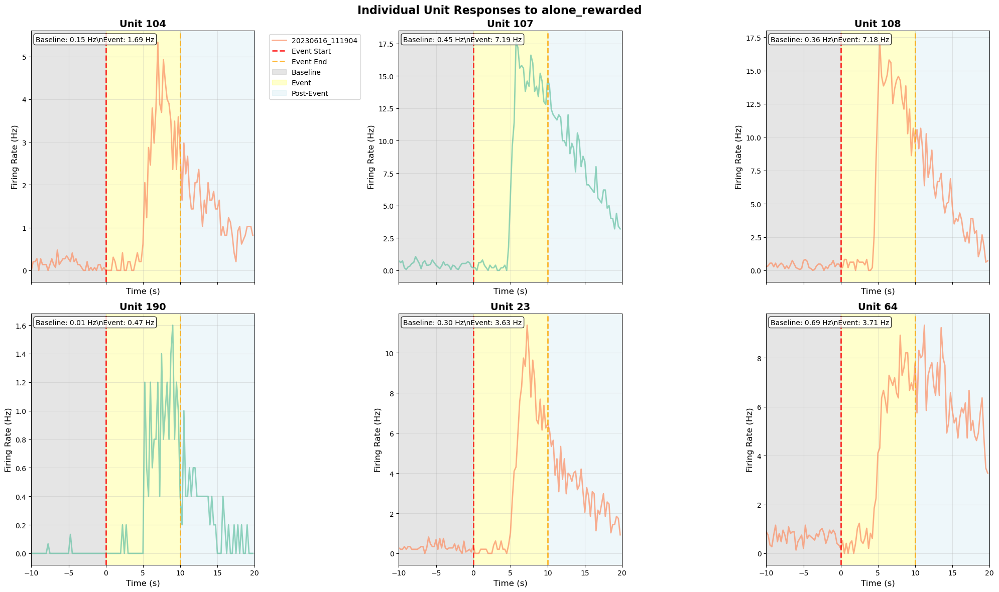

\nCompleted firing rate plots for alone_rewarded
\n============================================================
EVENT: LOSE (6 units)
Plotting individual units for lose
Units: ['14', '180', '479', '49', '7', '8']
Recordings: ['20230612_112630_standard_comp_to_training_D1_subj_1-2_t2b2L_box1_merged.rec', '20230613_105657_standard_comp_to_training_D2_subj_1-1_t1b2L_box1_merged.rec', '20230616_111904_standard_comp_to_training_D4_subj_1-2_t2b2L_box2_merged.rec', '20240322_120625_alone_comp_subj_3-4_t5b5_merged.rec', '20240323_144517_alone_comp_subj_3-4_t6b6_merged.rec']


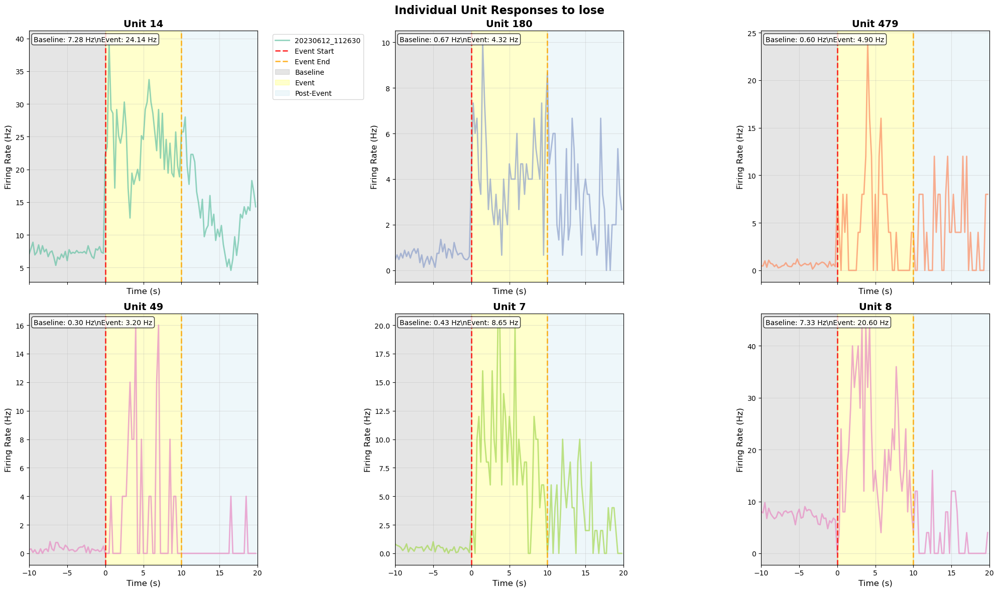

\nCompleted firing rate plots for lose
\n============================================================
EVENT: LOW_COMP_WIN (6 units)
Plotting individual units for low_comp_win
Units: ['108', '187', '23', '24', '52', '68']
Recordings: ['20230612_101430_standard_comp_to_training_D1_subj_1-4_t4b2L_box1_merged.rec', '20230616_111904_standard_comp_to_training_D4_subj_1-4_t4b3L_box1_merged.rec', '20230619_115321_standard_comp_to_omission_D3_subj_1-4_t3b3L_box2_merged.rec', '20240323_165815_alone_comp_subj_4-2_t5b5_merged.rec']


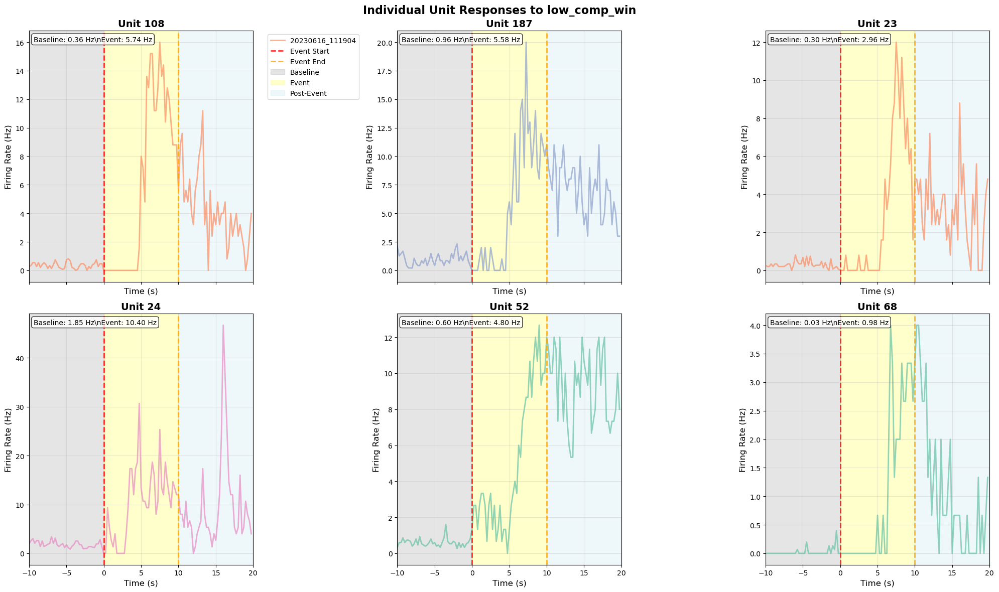

\nCompleted firing rate plots for low_comp_win
\n============================================================
EVENT: LOW_COMP_LOSE (5 units)
Plotting individual units for low_comp_lose
Units: ['229', '3', '4', '479', '7']
Recordings: ['20230613_105657_standard_comp_to_training_D2_subj_1-1_t1b2L_box1_merged.rec', '20230614_114041_standard_comp_to_training_D3_subj_1-1_t1b3L_box1_merged.rec', '20240323_144517_alone_comp_subj_3-4_t6b6_merged.rec']


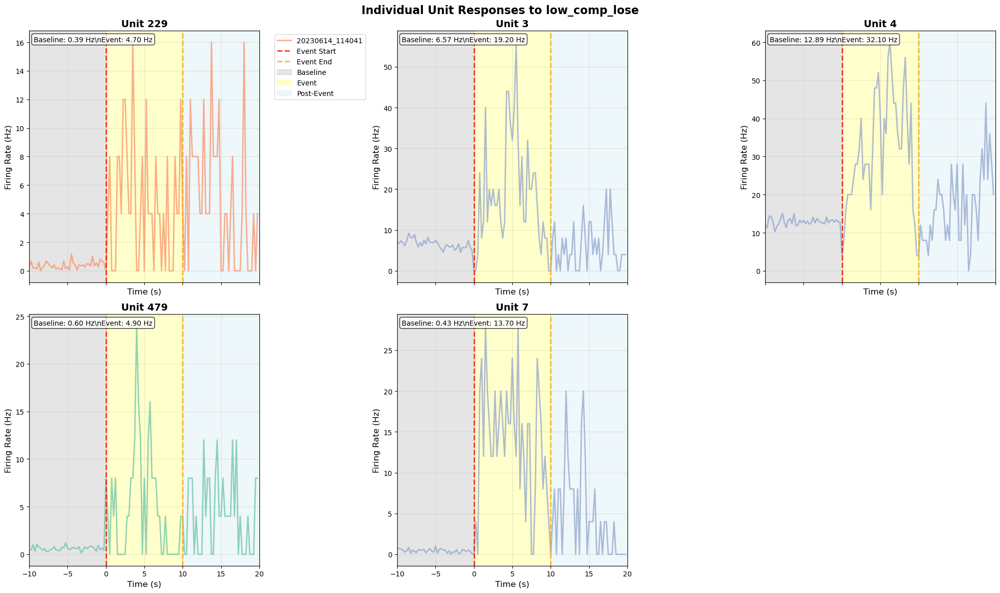

\nCompleted firing rate plots for low_comp_lose
\n============================================================
EVENT: HIGH_COMP (4 units)
Plotting individual units for high_comp
Units: ['107', '187', '275', '84']
Recordings: ['20230613_105657_standard_comp_to_training_D2_subj_1-4_t4b3L_box2_merged.rec', '20230619_115321_standard_comp_to_omission_D3_subj_1-4_t3b3L_box2_merged.rec', '20230621_111240_standard_comp_to_omission_D5_subj_1-4_t3b3L_box1_merged.rec']


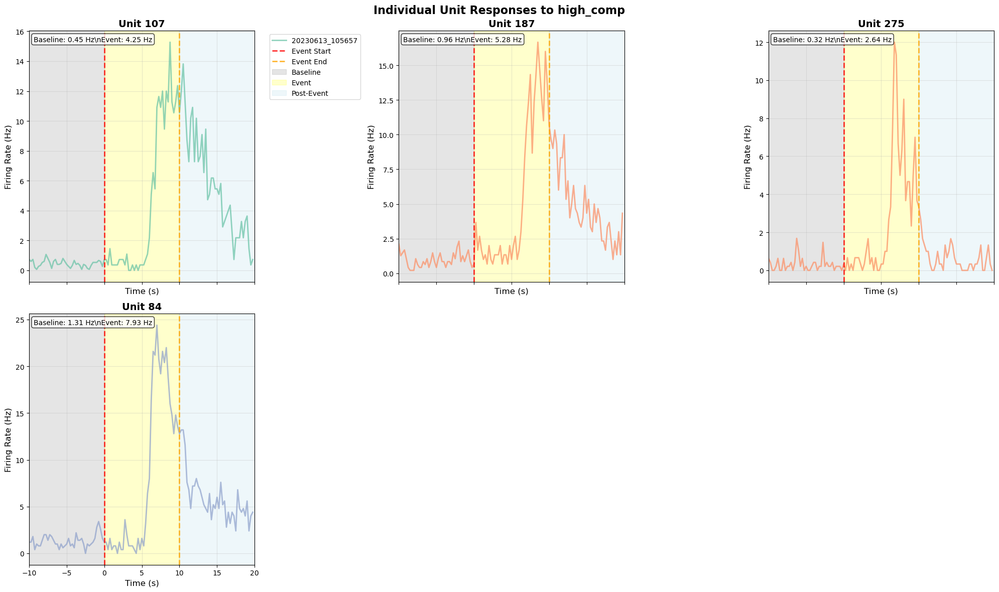

\nCompleted firing rate plots for high_comp
\n============================================================
EVENT: HIGH_COMP_TIE (3 units)
Plotting individual units for high_comp_tie
Units: ['146', '31', '68']
Recordings: ['20240320_142408_alone_comp_subj_3-3_t5b5_merged.rec', '20240320_171038_alone_comp_subj_4-3_t5b5_merged.rec', '20240323_122227_alone_comp_subj_5-2_t6b6_merged.rec']


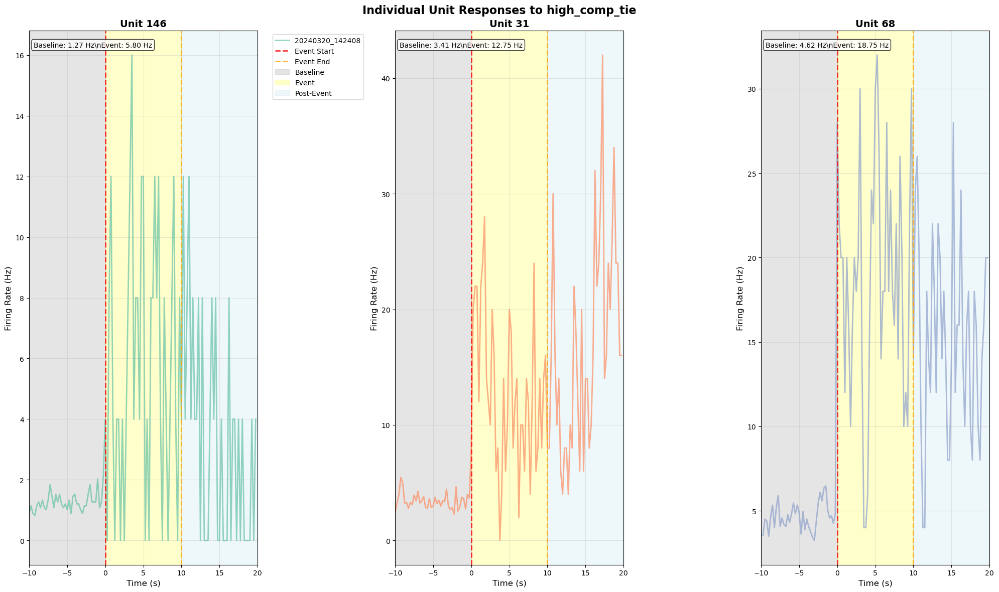

\nCompleted firing rate plots for high_comp_tie
\n============================================================
EVENT: LOW_COMP (2 units)
Plotting individual units for low_comp
Units: ['108', '7']
Recordings: ['20230616_111904_standard_comp_to_training_D4_subj_1-4_t4b3L_box1_merged.rec', '20240323_144517_alone_comp_subj_3-4_t6b6_merged.rec']


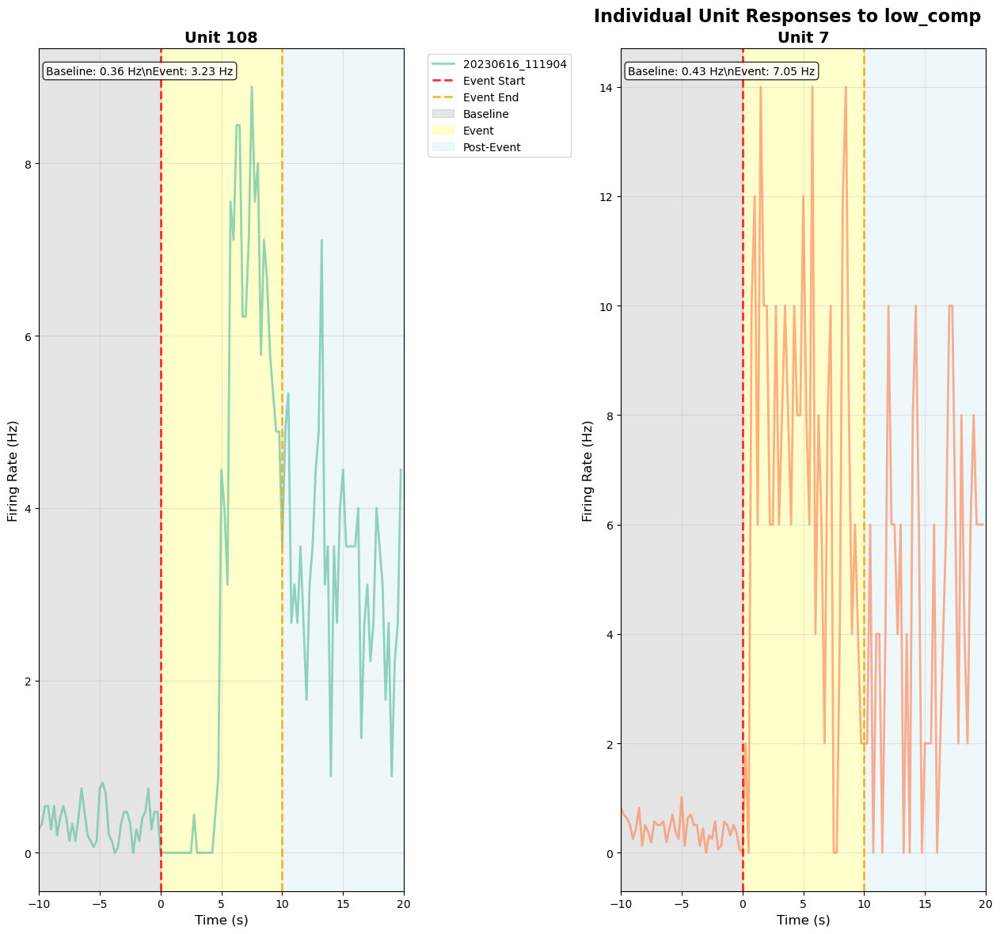

\nCompleted firing rate plots for low_comp


In [ ]:
# Create individual unit plots for each event
print("\\n" + "="*80)
print("INDIVIDUAL UNIT FIRING RATE ANALYSIS FOR ALL EVENTS")
print("="*80)

for event_name, n_units in events_to_analyze:
    print(f"\\n{'='*60}")
    print(f"EVENT: {event_name.upper()} ({n_units} units)")
    print(f"{'='*60}")
    
    # Create firing rate plots
    fig = plot_individual_units_psth(time_dfs_sig_only[event_name], event_name, figsize=(20, 12))
    
    print(f"\\nCompleted firing rate plots for {event_name}")

In [ ]:
# Create a comprehensive summary analysis for all events
print("\\n" + "="*80)
print("COMPREHENSIVE SUMMARY ANALYSIS FOR ALL EVENTS")
print("="*80)

# Create summary for top 5 events with most units
top_events = events_to_analyze[:5]

for event_name, n_units in top_events:
    print(f"\\n{'='*60}")
    print(f"SUMMARY FOR {event_name.upper()} ({n_units} units)")
    print(f"{'='*60}")
    
    # Quick stats summary 
    event_df = time_dfs_sig_only[event_name]
    units = sorted(event_df['Unit number'].unique())
    recordings = sorted(event_df['Recording'].unique())
    
    print(f"Units: {units}")
    print(f"Recordings: {len(recordings)}")
    
    # Basic response characteristics
    baseline_data = event_df[event_df['Time (s)'] < 0]
    event_data = event_df[(event_df['Time (s)'] >= 0) & (event_df['Time (s)'] < 10)]
    
    print(f"\\nResponse Summary:")
    for unit in units:
        unit_baseline = baseline_data[baseline_data['Unit number'] == unit]['Firing Rate (Hz)'].mean()
        unit_event = event_data[event_data['Unit number'] == unit]['Firing Rate (Hz)'].mean()
        max_zscore = event_df[event_df['Unit number'] == unit]['Z-Score'].max()
        
        response_type = "Increase" if max_zscore > 1.65 else ("Decrease" if max_zscore < -1.65 else "No response")
        fold_change = unit_event / unit_baseline if unit_baseline > 0 else float('inf')
        
        print(f"  Unit {unit}: {response_type} (Z-max: {max_zscore:.2f}, {fold_change:.2f}x baseline)")

print(f"\\n\\nCompleted summary analysis for top {len(top_events)} events.")

\n================================================================================
COMPREHENSIVE SUMMARY ANALYSIS FOR ALL EVENTS
\n============================================================
SUMMARY FOR HIGH_COMP_LOSE (9 units)
Units: ['107', '14', '180', '187', '275', '49', '7', '8', '84']
Recordings: 7
\nResponse Summary:
  Unit 107: Increase (Z-max: 9.96, 9.42x baseline)
  Unit 14: Increase (Z-max: 3.86, 3.54x baseline)
  Unit 180: Increase (Z-max: 7.17, 8.32x baseline)
  Unit 187: Increase (Z-max: 6.41, 5.49x baseline)
  Unit 275: Increase (Z-max: 8.73, 8.37x baseline)
  Unit 49: Increase (Z-max: 10.04, 10.61x baseline)
  Unit 7: Increase (Z-max: 13.86, 8.34x baseline)
  Unit 8: Increase (Z-max: 4.64, 2.81x baseline)
  Unit 84: Increase (Z-max: 7.74, 6.03x baseline)
\n============================================================
SUMMARY FOR HIGH_COMP_WIN (7 units)
Units: ['101', '104', '108', '23', '4', '52', '89']
Recordings: 4
\nResponse Summary:
  Unit 101: Increase (Z-max: 5.07

In [ ]:
# Cross-Event Unit Analysis - Which units respond to which events?
print("\\n" + "="*80)
print("CROSS-EVENT UNIT RESPONSE ANALYSIS")
print("="*80)

# Collect all units across all events
all_units = set()
event_unit_mapping = {}

for event, df in time_dfs_sig_only.items():
    if not df.empty:
        units = set(df['Unit number'].unique())
        all_units.update(units)
        event_unit_mapping[event] = units

all_units = sorted(all_units)
print(f"Total unique units across all events: {len(all_units)}")
print(f"Units: {all_units}")

# Create unit-event response matrix
print(f"\\n{'Unit':<6} | Event Responses")
print("-" * 80)

unit_event_matrix = {}
for unit in all_units:
    responding_events = []
    max_z_scores = {}
    
    for event, units_in_event in event_unit_mapping.items():
        if unit in units_in_event:
            # Get max z-score for this unit in this event
            event_df = time_dfs_sig_only[event]
            unit_df = event_df[event_df['Unit number'] == unit]
            max_z = unit_df['Z-Score'].max()
            max_z_scores[event] = max_z
            
            if max_z > 1.65:
                responding_events.append(f"{event}(+{max_z:.1f})")
            elif max_z < -1.65:
                responding_events.append(f"{event}(-{abs(max_z):.1f})")
            else:
                responding_events.append(f"{event}({max_z:.1f})")
    
    unit_event_matrix[unit] = max_z_scores
    print(f"{unit:<6} | {', '.join(responding_events)}")

# Find most versatile units (respond to many events)
print(f"\\n\\nMOST VERSATILE UNITS (respond to multiple events):")
unit_versatility = {unit: len(events) for unit, events in unit_event_matrix.items()}
versatile_units = sorted(unit_versatility.items(), key=lambda x: x[1], reverse=True)

for unit, n_events in versatile_units[:10]:  # Top 10 most versatile
    events_list = list(unit_event_matrix[unit].keys())
    print(f"  Unit {unit}: responds to {n_events} events - {events_list}")

# Find event-specific units
print(f"\\n\\nEVENT-SPECIFIC UNITS (respond to only one event):")
specific_units = [unit for unit, n_events in versatile_units if n_events == 1]
for unit in specific_units:
    event = list(unit_event_matrix[unit].keys())[0]
    z_score = list(unit_event_matrix[unit].values())[0]
    print(f"  Unit {unit}: only responds to {event} (Z-max: {z_score:.2f})")

print(f"\\n\\nSUMMARY:")
print(f"  - {len(versatile_units)} total responding units")
print(f"  - {len(specific_units)} event-specific units")
print(f"  - {len([u for u, n in versatile_units if n >= 3])} units respond to 3+ events")
print(f"  - {len([u for u, n in versatile_units if n >= 5])} units respond to 5+ events")

\n================================================================================
CROSS-EVENT UNIT RESPONSE ANALYSIS
Total unique units across all events: 25
Units: ['101', '104', '107', '108', '14', '146', '180', '187', '190', '229', '23', '24', '275', '3', '31', '4', '479', '49', '52', '64', '68', '7', '8', '84', '89']
\nUnit   | Event Responses
--------------------------------------------------------------------------------
101    | high_comp_win(+5.1), win(+5.1)
104    | alone_rewarded(+6.0), high_comp_win(+18.4)
107    | alone_rewarded(+11.5), high_comp(+10.0), high_comp_lose(+10.0)
108    | alone_rewarded(+10.6), high_comp_win(+17.5), low_comp(+5.4), low_comp_win(+9.9), win(+9.1)
14     | high_comp_lose(+3.9), lose(+3.5)
146    | high_comp_tie(+5.4)
180    | high_comp_lose(+7.2), lose(+4.4)
187    | high_comp(+6.4), high_comp_lose(+6.4), low_comp_win(+7.8), win(+7.8)
190    | alone_rewarded(+11.3)
229    | low_comp_lose(+10.9)
23     | alone_rewarded(+7.4), high_comp_win(+18.6),

\n================================================================================
VISUAL SUMMARY: UNIT-EVENT RESPONSE MATRIX
Creating comprehensive heatmap of all unit responses across all events...


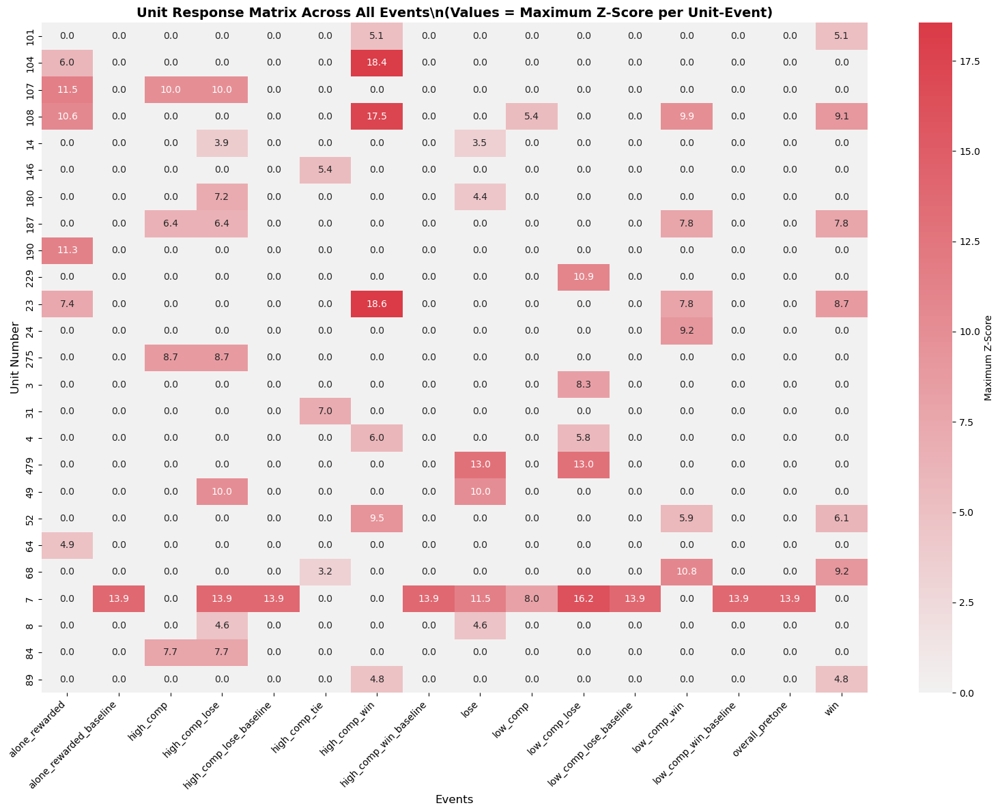

In [ ]:
# Create a visual summary heatmap of unit responses across events
def create_unit_event_heatmap(unit_event_matrix, figsize=(15, 10)):
    """Create a heatmap showing unit responses across events."""
    
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns
    
    # Convert to DataFrame format for heatmap
    units = sorted(unit_event_matrix.keys())
    all_events = set()
    for unit_events in unit_event_matrix.values():
        all_events.update(unit_events.keys())
    events = sorted(all_events)
    
    # Create matrix
    matrix_data = []
    for unit in units:
        row = []
        for event in events:
            if event in unit_event_matrix[unit]:
                z_score = unit_event_matrix[unit][event]
                row.append(z_score)
            else:
                row.append(0)  # No response
        matrix_data.append(row)
    
    # Create DataFrame
    heatmap_df = pd.DataFrame(matrix_data, index=units, columns=events)
    
    # Create the plot
    plt.figure(figsize=figsize)
    
    # Custom colormap: blue for negative, white for zero, red for positive
    cmap = sns.diverging_palette(250, 10, as_cmap=True)
    
    sns.heatmap(heatmap_df, 
                cmap=cmap, 
                center=0, 
                annot=True, 
                fmt='.1f',
                cbar_kws={'label': 'Maximum Z-Score'},
                xticklabels=True,
                yticklabels=True)
    
    plt.title('Unit Response Matrix Across All Events\\n(Values = Maximum Z-Score per Unit-Event)', 
              fontsize=14, fontweight='bold')
    plt.xlabel('Events', fontsize=12)
    plt.ylabel('Unit Number', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
    return heatmap_df

# Create the comprehensive heatmap
print("\\n" + "="*80)
print("VISUAL SUMMARY: UNIT-EVENT RESPONSE MATRIX")
print("="*80)
print("Creating comprehensive heatmap of all unit responses across all events...")

heatmap_matrix = create_unit_event_heatmap(unit_event_matrix, figsize=(16, 12))

\n================================================================================
Z-SCORE ANALYSIS AND CORRELATION MATRICES FOR ALL EVENTS
\n============================================================
Z-SCORE & CORRELATION ANALYSIS: HIGH_COMP_LOSE (9 units)
Plotting individual Z-scores for high_comp_lose


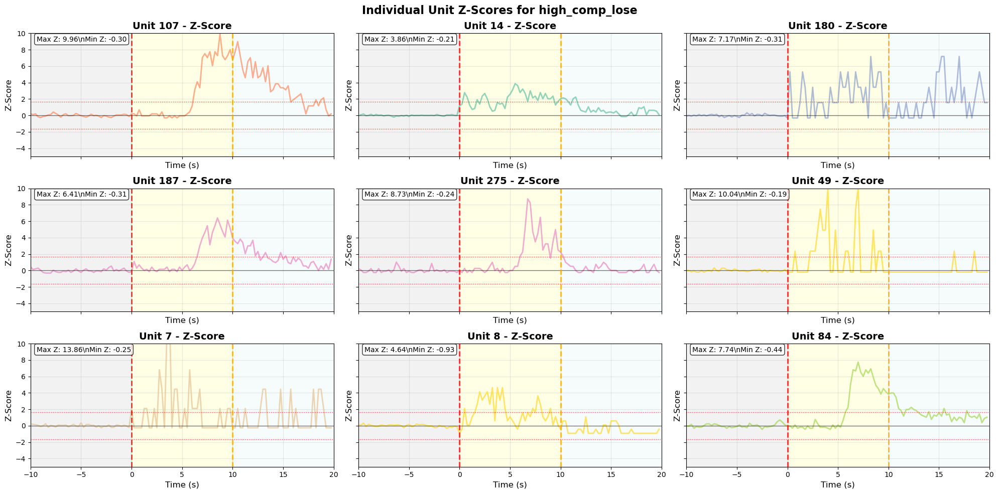

\n=== Correlation Analysis for high_comp_lose ===
Data shape for correlation: (120, 9)
Time range: -10.00 to 19.75 seconds


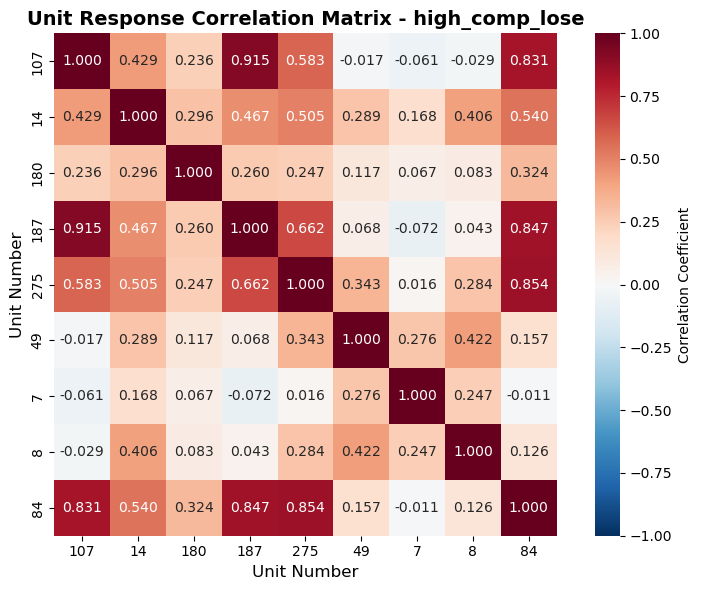

\nHighly Correlated Unit Pairs (|r| > 0.7):
  Units 107 & 187: r = 0.915 (positively correlated)
  Units 107 & 84: r = 0.831 (positively correlated)
  Units 187 & 84: r = 0.847 (positively correlated)
  Units 275 & 84: r = 0.854 (positively correlated)
=== Response Pattern Analysis for high_comp_lose ===
\n1. UNIT SUMMARY STATISTICS:
  Unit  Baseline_Mean  Baseline_Std  Event_Mean  Event_Max  Event_Peak_Time  \
0  107           0.45          0.23        4.25      15.27             8.75   
1   14           7.28          0.68       25.80      43.00             5.50   
2  180           0.67          0.26        5.60      16.00             8.25   
3  187           0.96          0.52        5.28      16.67             8.50   
4  275           0.32          0.38        2.64      12.00             6.75   
5   49           0.30          0.21        3.20      16.00             4.00   
6    7           0.43          0.23        3.60      24.00             3.75   
7    8           7.33          1

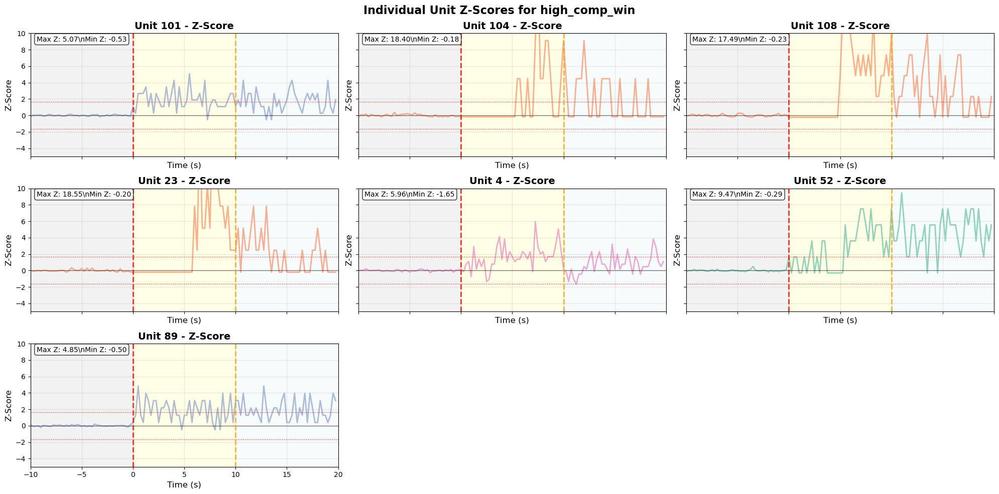

\n=== Correlation Analysis for high_comp_win ===
Data shape for correlation: (120, 7)
Time range: -10.00 to 19.75 seconds


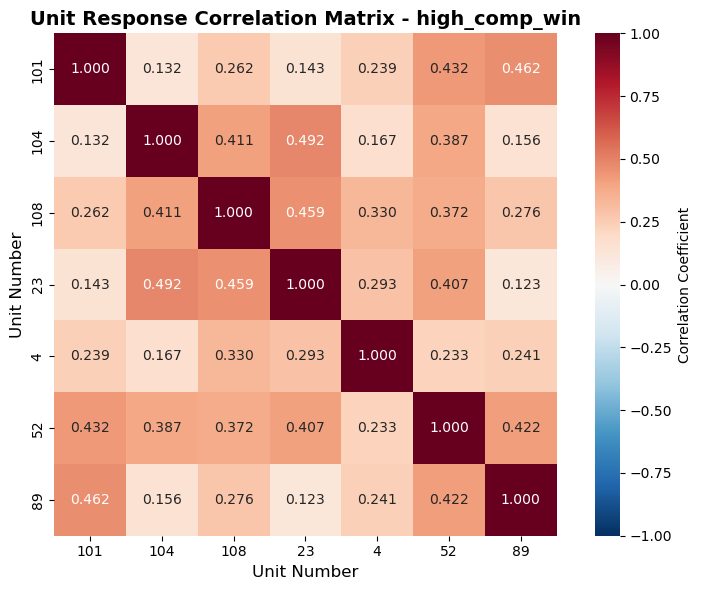

\nHighly Correlated Unit Pairs (|r| > 0.7):
=== Response Pattern Analysis for high_comp_win ===
\n1. UNIT SUMMARY STATISTICS:
  Unit  Baseline_Mean  Baseline_Std  Event_Mean  Event_Max  Event_Peak_Time  \
0  101           2.65          0.39        12.3       28.0             5.50   
1  104           0.15          0.12         1.7       16.0             7.50   
2  108           0.36          0.22         5.9       28.0             5.50   
3   23           0.30          0.19         4.9       28.0             6.50   
4    4          25.69          1.38        47.4      104.0             7.25   
5   52           0.60          0.23         5.7       16.0             7.00   
6   89           2.25          0.38        10.3       24.0             0.50   

   Post_Mean  Max_Zscore  Min_Zscore  Zscore_Range Response_Type  Early_Event  \
0       11.1        5.07       -0.53          5.60      Increase        12.38   
1        1.7       18.40       -0.18         18.58      Increase         0.00  

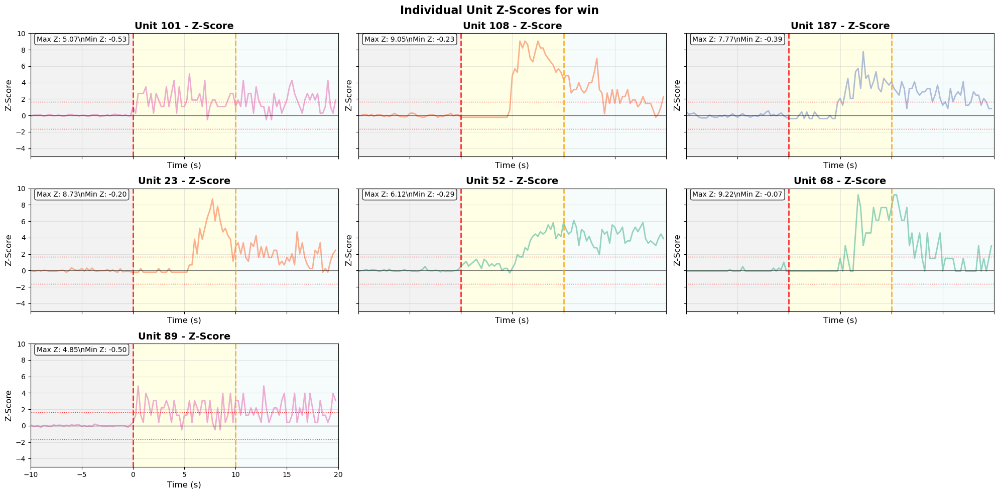

\n=== Correlation Analysis for win ===
Data shape for correlation: (120, 7)
Time range: -10.00 to 19.75 seconds


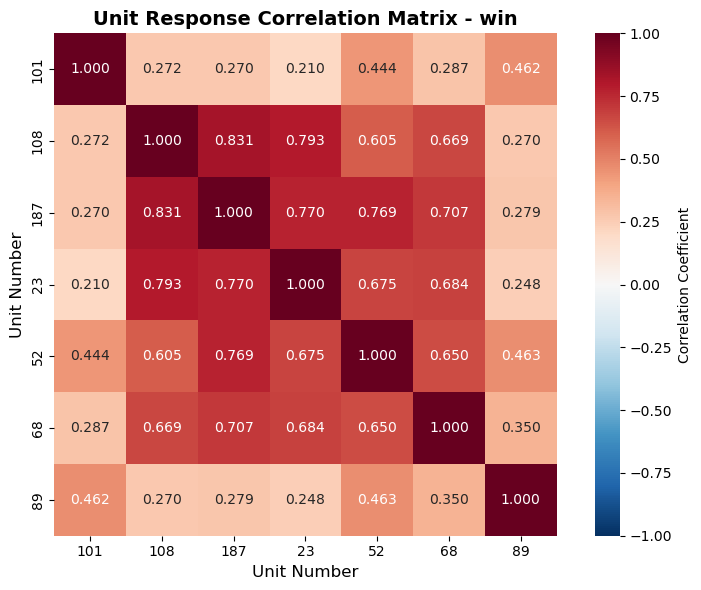

\nHighly Correlated Unit Pairs (|r| > 0.7):
  Units 108 & 187: r = 0.831 (positively correlated)
  Units 108 & 23: r = 0.793 (positively correlated)
  Units 187 & 23: r = 0.770 (positively correlated)
  Units 187 & 52: r = 0.769 (positively correlated)
  Units 187 & 68: r = 0.707 (positively correlated)
=== Response Pattern Analysis for win ===
\n1. UNIT SUMMARY STATISTICS:
  Unit  Baseline_Mean  Baseline_Std  Event_Mean  Event_Max  Event_Peak_Time  \
0  101           2.65          0.39       12.30      28.00             5.50   
1  108           0.36          0.22        5.77      14.67             5.75   
2  187           0.96          0.52        5.58      20.00             7.25   
3   23           0.30          0.19        3.28      13.33             7.75   
4   52           0.60          0.23        4.93      12.57             9.00   
5   68           0.02          0.08        0.87       3.43             6.75   
6   89           2.25          0.38       10.30      24.00            

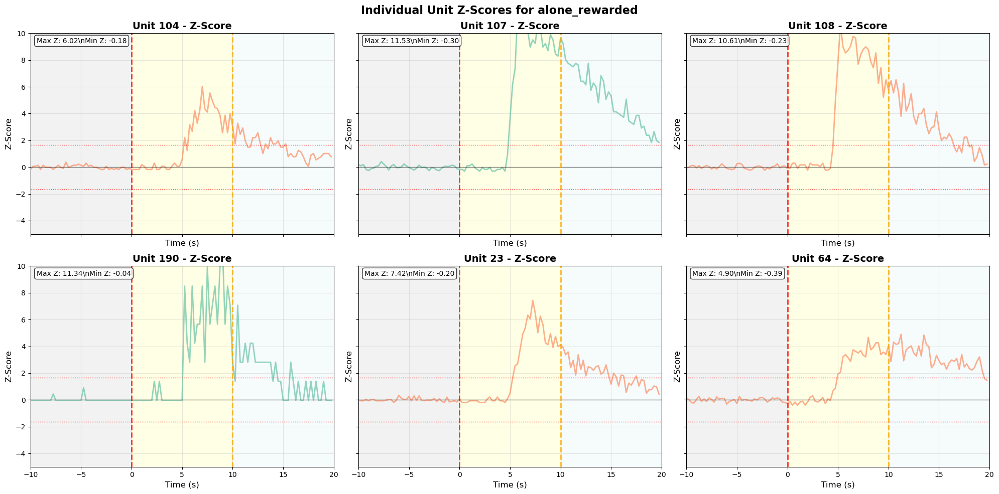

\n=== Correlation Analysis for alone_rewarded ===
Data shape for correlation: (120, 6)
Time range: -10.00 to 19.75 seconds


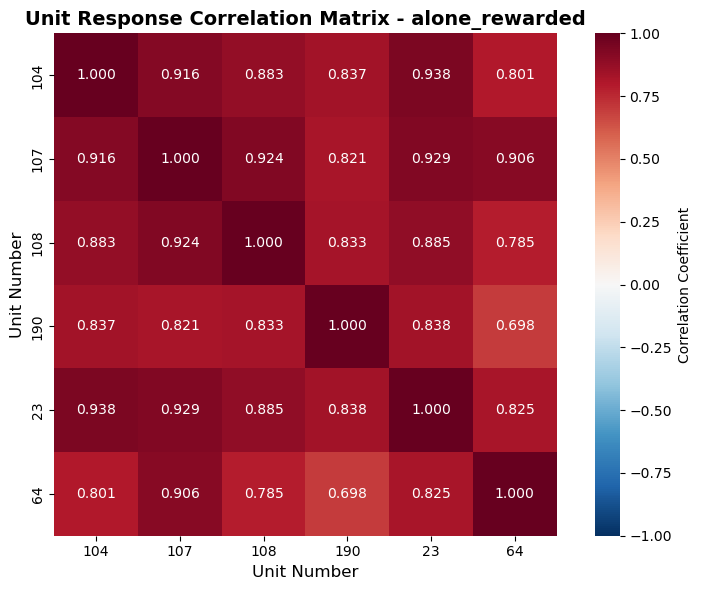

\nHighly Correlated Unit Pairs (|r| > 0.7):
  Units 104 & 107: r = 0.916 (positively correlated)
  Units 104 & 108: r = 0.883 (positively correlated)
  Units 104 & 190: r = 0.837 (positively correlated)
  Units 104 & 23: r = 0.938 (positively correlated)
  Units 104 & 64: r = 0.801 (positively correlated)
  Units 107 & 108: r = 0.924 (positively correlated)
  Units 107 & 190: r = 0.821 (positively correlated)
  Units 107 & 23: r = 0.929 (positively correlated)
  Units 107 & 64: r = 0.906 (positively correlated)
  Units 108 & 190: r = 0.833 (positively correlated)
  Units 108 & 23: r = 0.885 (positively correlated)
  Units 108 & 64: r = 0.785 (positively correlated)
  Units 190 & 23: r = 0.838 (positively correlated)
  Units 23 & 64: r = 0.825 (positively correlated)
=== Response Pattern Analysis for alone_rewarded ===
\n1. UNIT SUMMARY STATISTICS:
  Unit  Baseline_Mean  Baseline_Std  Event_Mean  Event_Max  Event_Peak_Time  \
0  104           0.15          0.12        1.69       5.33   

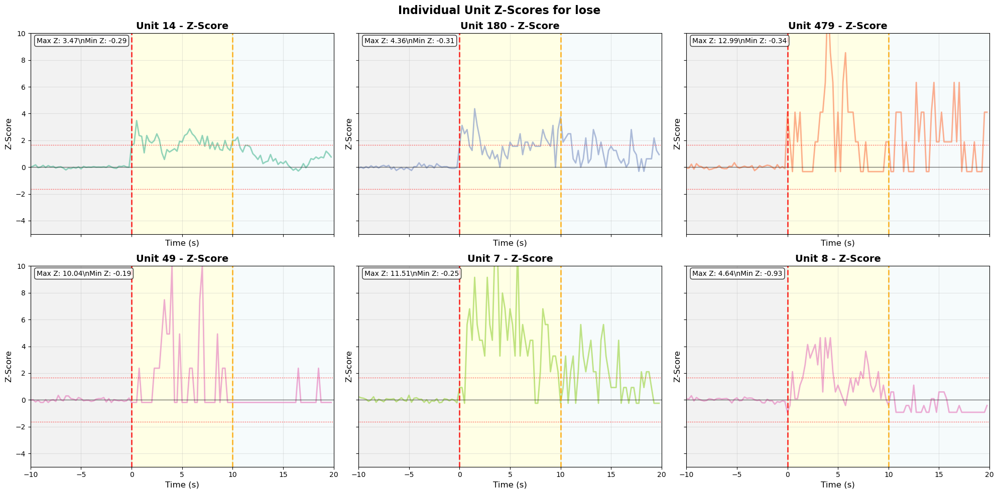

\n=== Correlation Analysis for lose ===
Data shape for correlation: (120, 6)
Time range: -10.00 to 19.75 seconds


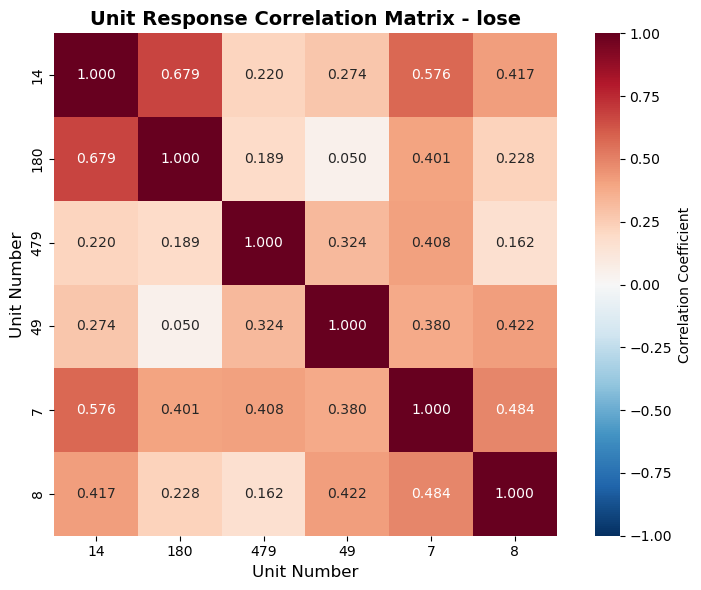

\nHighly Correlated Unit Pairs (|r| > 0.7):
=== Response Pattern Analysis for lose ===
\n1. UNIT SUMMARY STATISTICS:
  Unit  Baseline_Mean  Baseline_Std  Event_Mean  Event_Max  Event_Peak_Time  \
0   14           7.28          0.68       24.14      39.43             0.50   
1  180           0.67          0.26        4.32      10.00             1.50   
2  479           0.60          0.23        4.90      24.00             4.00   
3   49           0.30          0.21        3.20      16.00             4.00   
4    7           0.43          0.23        8.65      20.00             3.50   
5    8           7.33          1.03       20.60      44.00             3.25   

   Post_Mean  Max_Zscore  Min_Zscore  Zscore_Range Response_Type  Early_Event  \
0      13.76        3.47       -0.29          3.77      Increase        23.54   
1       3.12        4.36       -0.31          4.68      Increase         4.16   
2       4.20       12.99       -0.34         13.32      Increase         6.10   
3    

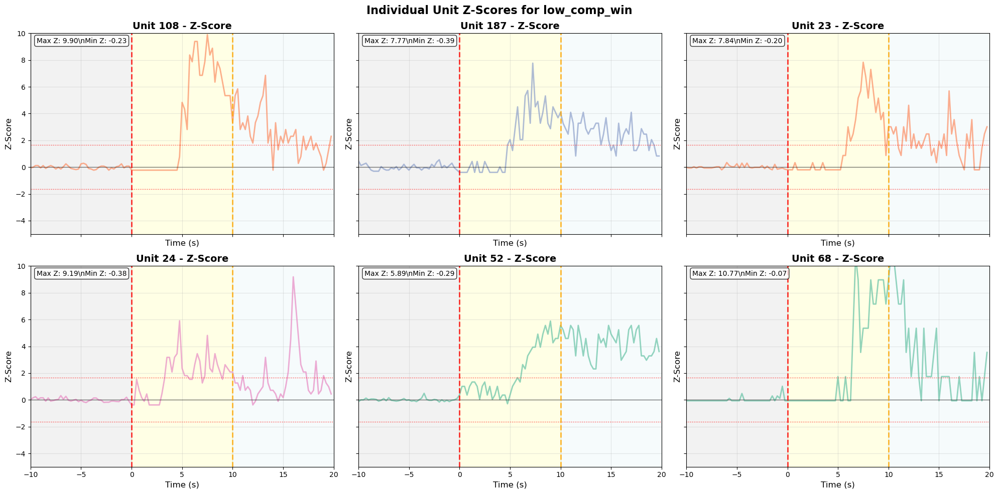

\n=== Correlation Analysis for low_comp_win ===
Data shape for correlation: (120, 6)
Time range: -10.00 to 19.75 seconds


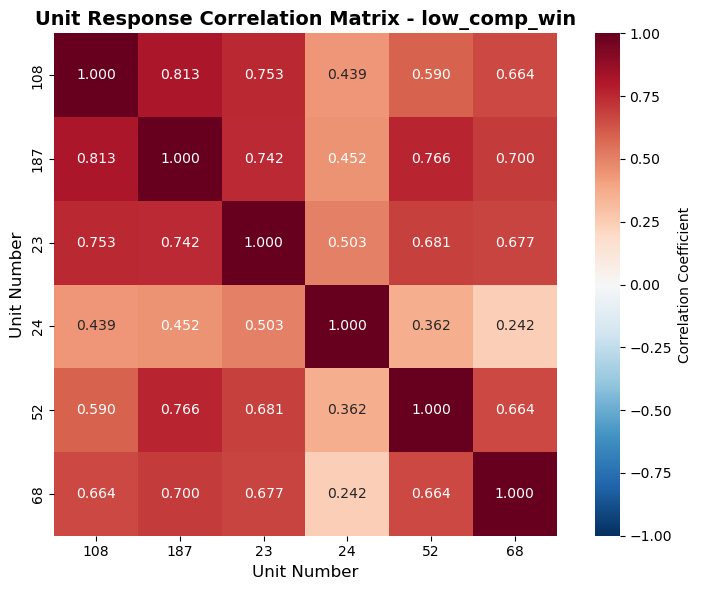

\nHighly Correlated Unit Pairs (|r| > 0.7):
  Units 108 & 187: r = 0.813 (positively correlated)
  Units 108 & 23: r = 0.753 (positively correlated)
  Units 187 & 23: r = 0.742 (positively correlated)
  Units 187 & 52: r = 0.766 (positively correlated)
=== Response Pattern Analysis for low_comp_win ===
\n1. UNIT SUMMARY STATISTICS:
  Unit  Baseline_Mean  Baseline_Std  Event_Mean  Event_Max  Event_Peak_Time  \
0  108           0.36          0.22        5.74      16.00             7.50   
1  187           0.96          0.52        5.58      20.00             7.25   
2   23           0.30          0.19        2.96      12.00             7.50   
3   24           1.85          0.64       10.40      30.67             4.75   
4   52           0.60          0.23        4.80      12.67             9.00   
5   68           0.02          0.08        0.98       4.00             6.75   

   Post_Mean  Max_Zscore  Min_Zscore  Zscore_Range Response_Type  Early_Event  \
0       4.24        9.90       

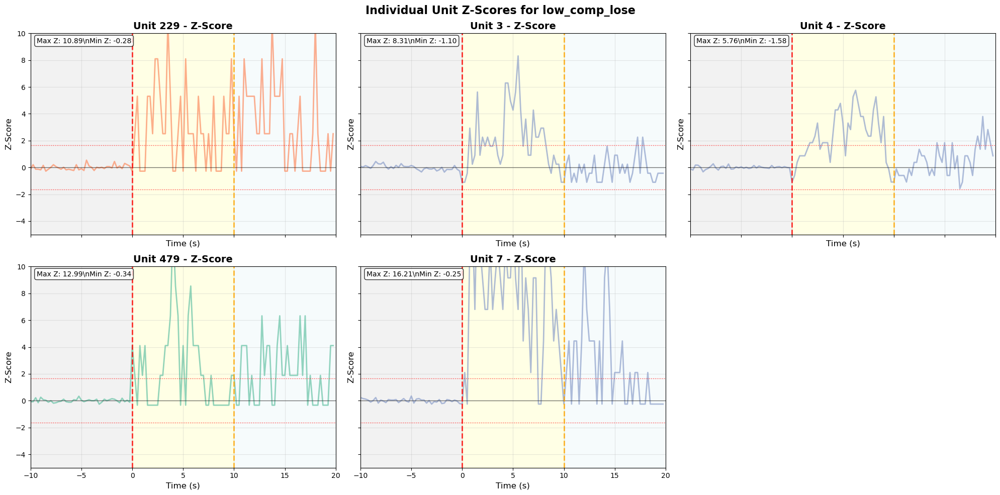

\n=== Correlation Analysis for low_comp_lose ===
Data shape for correlation: (120, 5)
Time range: -10.00 to 19.75 seconds


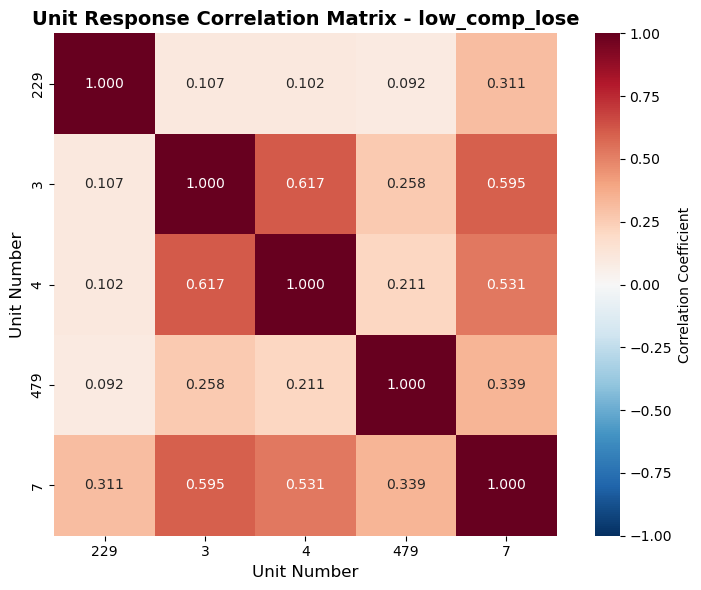

\nHighly Correlated Unit Pairs (|r| > 0.7):
=== Response Pattern Analysis for low_comp_lose ===
\n1. UNIT SUMMARY STATISTICS:
  Unit  Baseline_Mean  Baseline_Std  Event_Mean  Event_Max  Event_Peak_Time  \
0  229           0.39          0.26         4.7       16.0             3.50   
1    3           6.57          1.09        19.2       56.0             5.50   
2    4          12.89          0.99        32.1       60.0             6.25   
3  479           0.60          0.23         4.9       24.0             4.00   
4    7           0.43          0.23        13.7       28.0             1.50   

   Post_Mean  Max_Zscore  Min_Zscore  Zscore_Range Response_Type  Early_Event  \
0        4.8       10.89       -0.28         11.17      Increase         5.14   
1        5.9        8.31       -1.10          9.42      Increase        18.86   
2       16.8        5.76       -1.58          7.33      Increase        27.81   
3        4.2       12.99       -0.34         13.32      Increase         6.

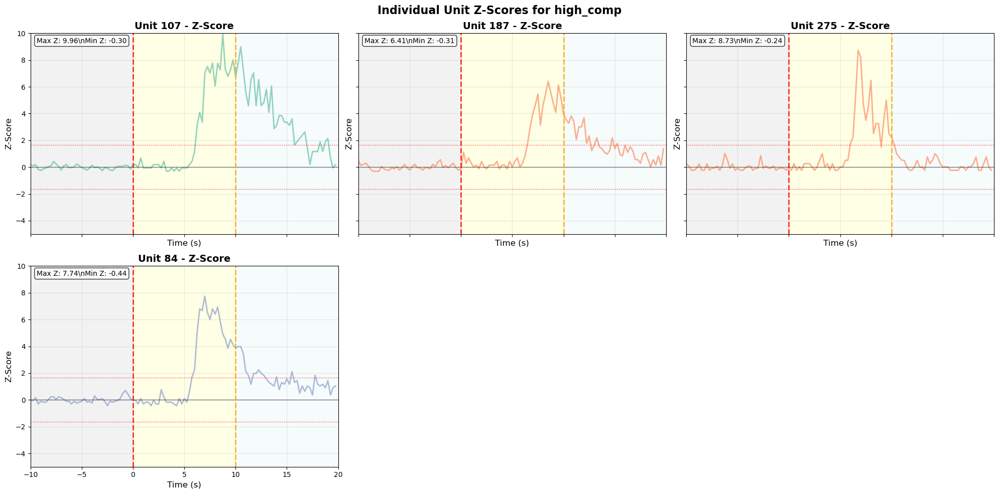

\n=== Correlation Analysis for high_comp ===
Data shape for correlation: (120, 4)
Time range: -10.00 to 19.75 seconds


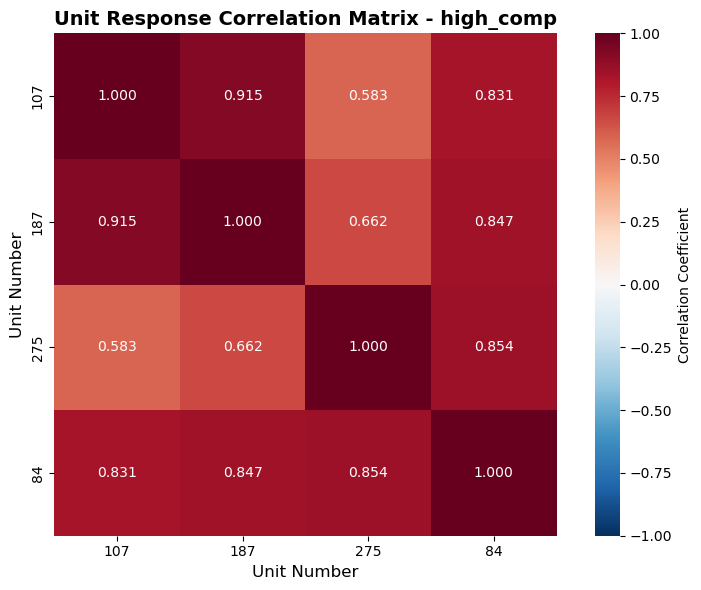

\nHighly Correlated Unit Pairs (|r| > 0.7):
  Units 107 & 187: r = 0.915 (positively correlated)
  Units 107 & 84: r = 0.831 (positively correlated)
  Units 187 & 84: r = 0.847 (positively correlated)
  Units 275 & 84: r = 0.854 (positively correlated)
=== Response Pattern Analysis for high_comp ===
\n1. UNIT SUMMARY STATISTICS:
  Unit  Baseline_Mean  Baseline_Std  Event_Mean  Event_Max  Event_Peak_Time  \
0  107           0.45          0.23        4.25      15.27             8.75   
1  187           0.96          0.52        5.28      16.67             8.50   
2  275           0.32          0.38        2.64      12.00             6.75   
3   84           1.32          0.68        7.93      24.40             7.00   

   Post_Mean  Max_Zscore  Min_Zscore  Zscore_Range Response_Type  Early_Event  \
0       5.73        9.96       -0.30         10.26      Increase         0.47   
1       4.94        6.41       -0.31          6.71      Increase         1.43   
2       0.67        8.73      

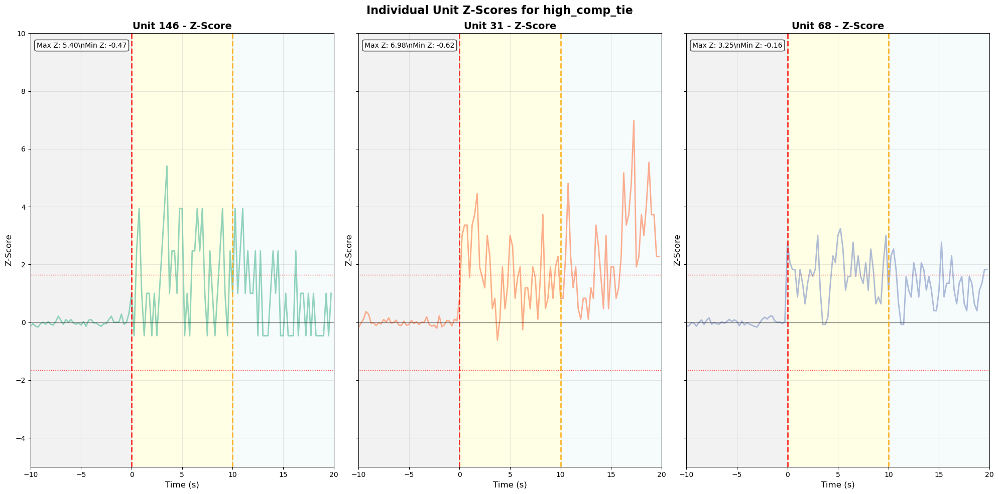

\n=== Correlation Analysis for high_comp_tie ===
Data shape for correlation: (120, 3)
Time range: -10.00 to 19.75 seconds


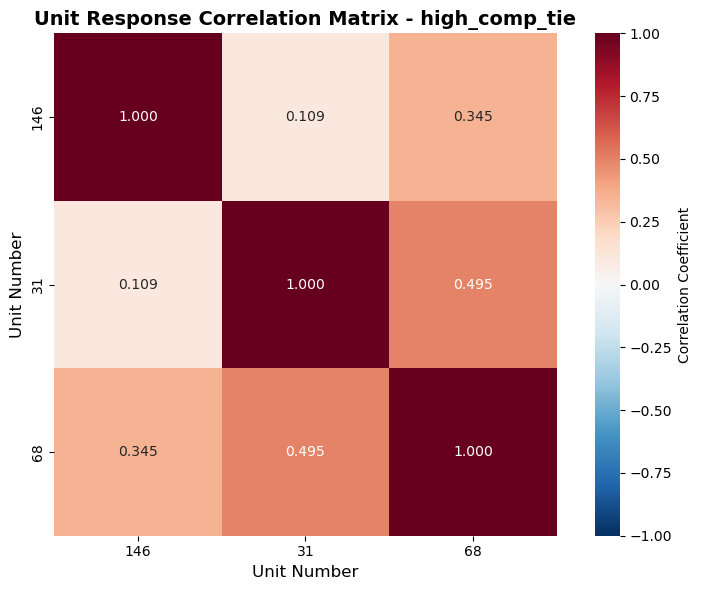

\nHighly Correlated Unit Pairs (|r| > 0.7):
=== Response Pattern Analysis for high_comp_tie ===
\n1. UNIT SUMMARY STATISTICS:
  Unit  Baseline_Mean  Baseline_Std  Event_Mean  Event_Max  Event_Peak_Time  \
0  146           1.27          0.30        5.80       16.0             3.50   
1   31           3.41          0.68       12.75       28.0             1.75   
2   68           4.62          0.81       18.75       32.0             5.25   

   Post_Mean  Max_Zscore  Min_Zscore  Zscore_Range Response_Type  Early_Event  \
0       3.40        5.40       -0.47          5.87      Increase         6.10   
1      16.50        6.98       -0.62          7.60      Increase        14.19   
2      15.25        3.25       -0.16          3.41      Increase        17.71   

   Late_Event  Response_Ratio  
0        5.47            4.57  
1       11.16            3.74  
2       19.89            4.06  
\n2. RESPONSE CLASSIFICATION:
  Increase: 3 units - ['146', '31', '68']
\n3. SIMILAR RESPONSE PATTERNS:


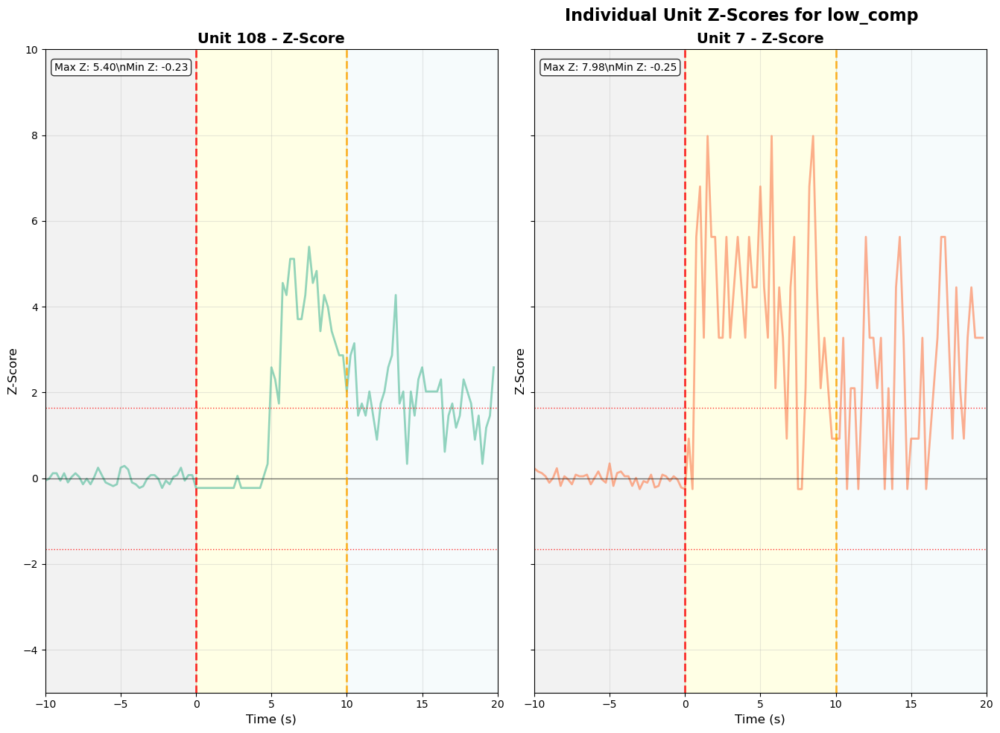

Skipping correlation analysis for low_comp (only 2 units)
=== Response Pattern Analysis for low_comp ===
\n1. UNIT SUMMARY STATISTICS:
  Unit  Baseline_Mean  Baseline_Std  Event_Mean  Event_Max  Event_Peak_Time  \
0  108           0.36          0.22        3.23       8.89              7.5   
1    7           0.43          0.23        7.05      14.00              1.5   

   Post_Mean  Max_Zscore  Min_Zscore  Zscore_Range Response_Type  Early_Event  \
0       3.28        5.40       -0.23          5.62      Increase         0.30   
1       4.50        7.98       -0.25          8.23      Increase         7.71   

   Late_Event  Response_Ratio  
0        6.48            9.00  
1        6.32           16.33  
\n2. RESPONSE CLASSIFICATION:
  Increase: 2 units - ['108', '7']
\n3. SIMILAR RESPONSE PATTERNS:
\n   Increase Response Units:
     Unit 108: Peak at 7.5s, Max Z-score: 5.40, Response ratio: 9.00x
     Unit 7: Peak at 1.5s, Max Z-score: 7.98, Response ratio: 16.33x
\n     Similarity Ana

In [ ]:
# Create Z-score plots and correlation analysis for all events
print("\\n" + "="*80)
print("Z-SCORE ANALYSIS AND CORRELATION MATRICES FOR ALL EVENTS")
print("="*80)

for event_name, n_units in events_to_analyze:
    print(f"\\n{'='*60}")
    print(f"Z-SCORE & CORRELATION ANALYSIS: {event_name.upper()} ({n_units} units)")
    print(f"{'='*60}")
    
    # Create Z-score plots
    fig_zscore = plot_individual_units_zscore(time_dfs_sig_only[event_name], event_name, figsize=(20, 10))
    
    # Create correlation analysis (only if enough units)
    if n_units >= 3:
        corr_matrix, pivot_data = plot_unit_correlation_matrix(time_dfs_sig_only[event_name], event_name, figsize=(8, 6))
        corr_storage[event_name] = corr_matrix
    else:
        print(f"Skipping correlation analysis for {event_name} (only {n_units} units)")
    
    # Run response pattern analysis
    stats = analyze_response_patterns(time_dfs_sig_only[event_name], event_name)
    stats_storage[event_name] = stats
    
    print(f"\\nCompleted analysis for {event_name}")